In [1]:
import pandas as pd
from pathlib import Path
import zipfile
import os
import sqlite3
from datetime import datetime
import glob
from pprint import pprint
# import praw
import pprint
import pandas as pd
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.util import ngrams
import string
import seaborn as sns
import matplotlib.pyplot as plt
from wordcloud import WordCloud
import spacy
# import contractions
import re
# from langdetect import detect
# from langdetect.lang_detect_exception import LangDetectException
from collections import Counter
import gensim
from gensim import corpora
from nltk.sentiment.vader import SentimentIntensityAnalyzer
import time
import gensim.downloader as api
from gensim.models.ldamodel import LdaModel
from sklearn.feature_extraction.text import CountVectorizer
from dateutil.parser import parse
from datetime import datetime
from pandas import json_normalize

In [3]:
df = pd.read_csv(r"news_data_latest.csv")
df

,Unnamed: 0,Title,Description,Date,Source,Topic
0,0,Marex cancels London listing,"Broker Marex has pulled its planned listing, r...",2021-09-06,Financial Times,Private equity
1,1,Gensler says SEC to review payment for order flow,The top US stock market regulator is looking t...,2021-09-06,Financial Times,US financial regulation
2,2,Global banking regulator urges toughest capita...,Global regulators are calling for cryptocurren...,2021-10-06,Financial Times,Cryptocurrencies
3,3,Bank of England orders Euroclear to bolster re...,The Bank of England has ordered Euroclear to i...,2021-06-25,Financial Times,Clearing & Settlement
4,4,Europe seeks to kick-start sluggish corporate ...,"Banks, regulators and fund managers are gearin...",2021-06-28,Financial Times,Corporate bonds
...,...,...,...,...,...,...
34635,34635,"Snakelets, Lizards in Bihar’s Mid/Day Meals fo...","Amid the rise in such incidents, CNN/News18 sp...",2023-05-31,CNN,NaN
34636,34636,'Badlav' Buzzword for 2024? Cong Banks on RaGa...,"As results of 2014 and 2019 poured in, the Con...",2023-05-31,CNN,NaN
34637,34637,"The Curious Case of a Famous Sweets Shop, CM E...",The Shinde faction of Shiv Sena alleged that S...,2023-05-31,CNN,NaN
34638,34638,Sick of Traffic Between IGI Airport & Mehrauli...,The five/kilometer road will not only offer an...,2023-05-31,CNN,NaN


In [4]:
# Convert 'Date' to datetime, keeping both date and time
df['Date'] = pd.to_datetime(df['Date'])

# If you want to keep only the date
df['Date'] = pd.to_datetime(df['Date']).dt.date

In [5]:
df['Source'].unique()

array(['Financial Times', 'BBC', 'Sun', 'Mirror', 'Daily Mail',
       'Independent', 'Guardian', 'Telegraph', 'Manchester Evening News',
       'Sky News', 'Metro', 'Daily Express', 'Times', 'Liverpool Echo',
       'Birmingham Live', 'Evening Standard', nan, 'The New York Times',
       'CNN'], dtype=object)

In [49]:
df.rename(columns = {'Title':'headline','Topic':'category','Description':'short_description','Date':'date'},inplace=True)
df

,Unnamed: 0,headline,short_description,date,Source,category
0,0,Marex cancels London listing,"Broker Marex has pulled its planned listing, r...",2021-09-06,Financial Times,Private equity
1,1,Gensler says SEC to review payment for order flow,The top US stock market regulator is looking t...,2021-09-06,Financial Times,US financial regulation
2,2,Global banking regulator urges toughest capita...,Global regulators are calling for cryptocurren...,2021-10-06,Financial Times,Cryptocurrencies
3,3,Bank of England orders Euroclear to bolster re...,The Bank of England has ordered Euroclear to i...,2021-06-25,Financial Times,Clearing & Settlement
4,4,Europe seeks to kick-start sluggish corporate ...,"Banks, regulators and fund managers are gearin...",2021-06-28,Financial Times,Corporate bonds
...,...,...,...,...,...,...
34635,34635,"Snakelets, Lizards in Bihar’s Mid/Day Meals fo...","Amid the rise in such incidents, CNN/News18 sp...",2023-05-31,CNN,NaN
34636,34636,'Badlav' Buzzword for 2024? Cong Banks on RaGa...,"As results of 2014 and 2019 poured in, the Con...",2023-05-31,CNN,NaN
34637,34637,"The Curious Case of a Famous Sweets Shop, CM E...",The Shinde faction of Shiv Sena alleged that S...,2023-05-31,CNN,NaN
34638,34638,Sick of Traffic Between IGI Airport & Mehrauli...,The five/kilometer road will not only offer an...,2023-05-31,CNN,NaN


In [51]:
news_json = pd.read_json(r'News_12-22_Dataset_v3.json',lines=True)
news_json

,link,headline,category,short_description,authors,date
0,https://www.huffpost.com/entry/covid-boosters-...,Over 4 Million Americans Roll Up Sleeves For O...,U.S. NEWS,Health experts said it is too early to predict...,"Carla K. Johnson, AP",2022-09-23
1,https://www.huffpost.com/entry/american-airlin...,"American Airlines Flyer Charged, Banned For Li...",U.S. NEWS,He was subdued by passengers and crew when he ...,Mary Papenfuss,2022-09-23
2,https://www.huffpost.com/entry/funniest-tweets...,23 Of The Funniest Tweets About Cats And Dogs ...,COMEDY,"""Until you have a dog you don't understand wha...",Elyse Wanshel,2022-09-23
3,https://www.huffpost.com/entry/funniest-parent...,The Funniest Tweets From Parents This Week (Se...,PARENTING,"""Accidentally put grown-up toothpaste on my to...",Caroline Bologna,2022-09-23
4,https://www.huffpost.com/entry/amy-cooper-lose...,Woman Who Called Cops On Black Bird-Watcher Lo...,U.S. NEWS,Amy Cooper accused investment firm Franklin Te...,Nina Golgowski,2022-09-22
...,...,...,...,...,...,...
209522,https://www.huffingtonpost.com/entry/rim-ceo-t...,RIM CEO Thorsten Heins' 'Significant' Plans Fo...,TECH,Verizon Wireless and AT&T are already promotin...,"Reuters, Reuters",2012-01-28
209523,https://www.huffingtonpost.com/entry/maria-sha...,Maria Sharapova Stunned By Victoria Azarenka I...,SPORTS,"Afterward, Azarenka, more effusive with the pr...",,2012-01-28
209524,https://www.huffingtonpost.com/entry/super-bow...,"Giants Over Patriots, Jets Over Colts Among M...",SPORTS,"Leading up to Super Bowl XLVI, the most talked...",,2012-01-28
209525,https://www.huffingtonpost.com/entry/aldon-smi...,Aldon Smith Arrested: 49ers Linebacker Busted ...,SPORTS,CORRECTION: An earlier version of this story i...,,2012-01-28


In [52]:
news_json['category'].unique()

array(['U.S. NEWS', 'COMEDY', 'PARENTING', 'WORLD NEWS', 'CULTURE & ARTS',
       'TECH', 'SPORTS', 'ENTERTAINMENT', 'POLITICS', 'WEIRD NEWS',
       'ENVIRONMENT', 'EDUCATION', 'CRIME', 'SCIENCE', 'WELLNESS',
       'BUSINESS', 'STYLE & BEAUTY', 'FOOD & DRINK', 'MEDIA',
       'QUEER VOICES', 'HOME & LIVING', 'WOMEN', 'BLACK VOICES', 'TRAVEL',
       'MONEY', 'RELIGION', 'LATINO VOICES', 'IMPACT', 'WEDDINGS',
       'COLLEGE', 'PARENTS', 'ARTS & CULTURE', 'STYLE', 'GREEN', 'TASTE',
       'HEALTHY LIVING', 'THE WORLDPOST', 'GOOD NEWS', 'WORLDPOST',
       'FIFTY', 'ARTS', 'DIVORCE'], dtype=object)

In [53]:
news_json[news_json['category'] == 'WEIRD NEWS']['headline']

,headline
29,'French Spider-Man' Celebrates 60th Birthday W...
38,German Customs Officials Follow Trail Of Slime...
154,A Fisherman Thought He Caught A Rock. He Snagg...
159,FINISH HIM: Fighting Kangaroo Pulls Wild Move ...
239,Feathers Fly As Wild Turkey Dodges Cops In Sla...
...,...
133464,10 Surprising History Facts That Will Warp You...
133465,LEFT TO DIE
133473,Gulag-Themed Holidays Are All the Rage in Sunn...
133505,This Cruise Ship From Hell Will Make You Wish ...


In [54]:
news_json[news_json['category'] == 'FIFTY']['headline'].iloc[1000]

'I Hope We Recognize Each Other'

In [55]:
news_column = ['U.S. NEWS',  'WORLD NEWS',
       'TECH', 'POLITICS', 'WEIRD NEWS',
       'ENVIRONMENT', 'EDUCATION', 'CRIME', 'SCIENCE',
       'BUSINESS', 'MEDIA',
        'WOMEN', 'BLACK VOICES', 'TRAVEL',
       'MONEY', 'RELIGION',  'IMPACT',
       'HEALTHY LIVING', 'THE WORLDPOST', 'GOOD NEWS', 'WORLDPOST']

In [56]:
filtered_df = news_json[news_json['category'].isin(news_column)][['headline','category','short_description','date']]
filtered_df['Source'] = 'HuffPost'
filtered_df['date'] = pd.to_datetime(filtered_df['date'])
filtered_df

,headline,category,short_description,date,Source
0,Over 4 Million Americans Roll Up Sleeves For O...,U.S. NEWS,Health experts said it is too early to predict...,2022-09-23,HuffPost
1,"American Airlines Flyer Charged, Banned For Li...",U.S. NEWS,He was subdued by passengers and crew when he ...,2022-09-23,HuffPost
4,Woman Who Called Cops On Black Bird-Watcher Lo...,U.S. NEWS,Amy Cooper accused investment firm Franklin Te...,2022-09-22,HuffPost
5,Cleaner Was Dead In Belk Bathroom For 4 Days B...,U.S. NEWS,The 63-year-old woman was seen working at the ...,2022-09-22,HuffPost
6,Reporter Gets Adorable Surprise From Her Boyfr...,U.S. NEWS,"""Who's that behind you?"" an anchor for New Yor...",2022-09-22,HuffPost
...,...,...,...,...,...
209518,Google+ Now Open for Teens With Some Safeguards,TECH,"For the most part, teens' experience on Google...",2012-01-28,HuffPost
209519,Web Wars,TECH,"These ""Web Wars"" threaten to rage on for some ...",2012-01-28,HuffPost
209520,"First White House Chief Technology Officer, An...",TECH,He was appointed with a fair bit of fanfare as...,2012-01-28,HuffPost
209521,Watch The Top 9 YouTube Videos Of The Week,TECH,If you're looking to see the most popular YouT...,2012-01-28,HuffPost


In [57]:
combined_df = pd.concat([filtered_df, df], axis=0)
combined_df

,headline,category,short_description,date,Source,Unnamed: 0
0,Over 4 Million Americans Roll Up Sleeves For O...,U.S. NEWS,Health experts said it is too early to predict...,2022-09-23 00:00:00,HuffPost,NaN
1,"American Airlines Flyer Charged, Banned For Li...",U.S. NEWS,He was subdued by passengers and crew when he ...,2022-09-23 00:00:00,HuffPost,NaN
4,Woman Who Called Cops On Black Bird-Watcher Lo...,U.S. NEWS,Amy Cooper accused investment firm Franklin Te...,2022-09-22 00:00:00,HuffPost,NaN
5,Cleaner Was Dead In Belk Bathroom For 4 Days B...,U.S. NEWS,The 63-year-old woman was seen working at the ...,2022-09-22 00:00:00,HuffPost,NaN
6,Reporter Gets Adorable Surprise From Her Boyfr...,U.S. NEWS,"""Who's that behind you?"" an anchor for New Yor...",2022-09-22 00:00:00,HuffPost,NaN
...,...,...,...,...,...,...
34635,"Snakelets, Lizards in Bihar’s Mid/Day Meals fo...",NaN,"Amid the rise in such incidents, CNN/News18 sp...",2023-05-31,CNN,34635.0
34636,'Badlav' Buzzword for 2024? Cong Banks on RaGa...,NaN,"As results of 2014 and 2019 poured in, the Con...",2023-05-31,CNN,34636.0
34637,"The Curious Case of a Famous Sweets Shop, CM E...",NaN,The Shinde faction of Shiv Sena alleged that S...,2023-05-31,CNN,34637.0
34638,Sick of Traffic Between IGI Airport & Mehrauli...,NaN,The five/kilometer road will not only offer an...,2023-05-31,CNN,34638.0


plt.figure(figsize=(18, 6))
filtered_df.groupby('date').size().plot(kind='line', marker='o')
plt.title('Number of Headlines Over Time')
plt.xlabel('Date')
plt.ylabel('Number of Headlines')
plt.grid(True)
plt.show()


# Top 10 categories

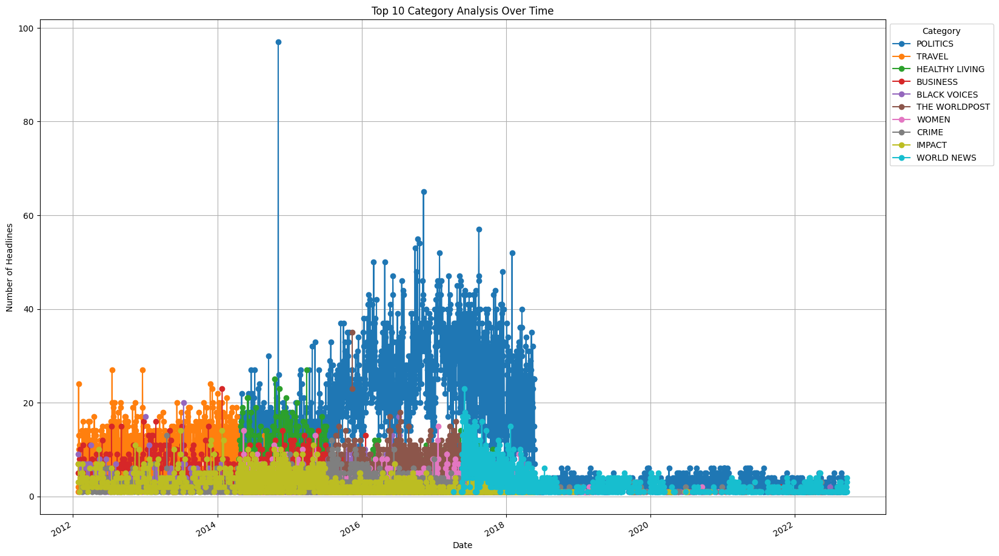

In [60]:
# Identify top 10 categories
top_categories = combined_df['category'].value_counts().head(10).index

# Filter the DataFrame to include only the top 10 categories
cat_df = combined_df[combined_df['category'].isin(top_categories)]

# Create a category order based on frequency
category_order = combined_df['category'].value_counts().loc[top_categories].index

# Plotting the top 10 categories over time
plt.figure(figsize=(18, 12))

# Plot with ordered categories
plot_data = cat_df.groupby(['date', 'category']).size().unstack().reindex(columns=category_order)
plot_data.plot(kind='line', marker='o', ax=plt.gca())

plt.title('Top 10 Category Analysis Over Time')
plt.xlabel('Date')
plt.ylabel('Number of Headlines')
plt.legend(title='Category', loc='upper left', bbox_to_anchor=(1, 1))  # Adjust legend position
plt.grid(True)
plt.show()

In [61]:
nlp = spacy.load("en_core_web_sm")

In [62]:
# Get the current date and time
processing_date = datetime.now().strftime('%Y-%m-%d %H:%M:%S')

In [66]:
import nltk
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


True

In [67]:
# Remove stop words
stop_words = set(stopwords.words('english'))

In [68]:
add_words = {'news','read','story','world','newsbrief','huffpost','short',
            'wrapup'}
# Combine stopwords, negative words, and additional custom stop words
stop_words = stop_words.union(add_words)


# Function to clean text

In [69]:
import pandas as pd
import re
import string
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import PorterStemmer
from nltk.stem import WordNetLemmatizer

# Download required NLTK resources
import nltk
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...


True

In [70]:
# List of specific phrases to remove
phrases_to_remove = [
    'new york city',
    'new york times',
    'rise morning',
    'huffpost rise morning newsbrief',
    'morning newsbrief short wrapup',
    'welcome to the huffPost rise Morning Newsbrief',
    'a short wrap-up of the news to help you start your day',
    'welcome huffpost rise morning newsbrief short wrapup help start day',
    'HuffPost Rise What You Need To Know On',
]

In [71]:
combined_df['Source'].fillna('OtherSources', inplace=True)

In [72]:
news_source_words = combined_df['Source'].unique()
phrases_to_remove.extend(news_source_words)
phrases_to_remove

['new york city',
 'new york times',
 'rise morning',
 'huffpost rise morning newsbrief',
 'morning newsbrief short wrapup',
 'welcome to the huffPost rise Morning Newsbrief',
 'a short wrap-up of the news to help you start your day',
 'welcome huffpost rise morning newsbrief short wrapup help start day',
 'HuffPost Rise What You Need To Know On',
 'HuffPost',
 'Financial Times',
 'BBC',
 'Sun',
 'Mirror',
 'Daily Mail',
 'Independent',
 'Guardian',
 'Telegraph',
 'Manchester Evening News',
 'Sky News',
 'Metro',
 'Daily Express',
 'Times',
 'Liverpool Echo',
 'Birmingham Live',
 'Evening Standard',
 'OtherSources',
 'The New York Times',
 'CNN']

In [73]:
# Function to clean text
def clean_text(text):
    if not isinstance(text, str):
        return ""

    # Contractions expansion
    try:
        text = contractions.fix(text)
    except:
        print(text)

    # 1. Convert text to lowercase
    text = text.lower()

    # 2. Remove URLs
    text = re.sub(r'http\S+|www\S+|https\S+', '', text, flags=re.MULTILINE)

    # 3. Remove HTML tags
    text = re.sub(r'<.*?>', '', text)

    # 4. Remove punctuation
    text = text.translate(str.maketrans('', '', string.punctuation))

    # 5. Remove numbers
    text = re.sub(r'\d+', '', text)
    # 5.0 Remove non-alphanumeric characters (except spaces)
    text = re.sub(r'[^\w\s]', '', text)
    text = re.sub('[\?|$|.|!-/,]',"", text)

    # 5.1. Remove specific phrases
    for phrase in phrases_to_remove:
        text = re.sub(re.escape(phrase.lower()), '', text)

    # 6. Tokenize text
    tokens = word_tokenize(text)

    # 7. Remove stopwords
    tokens = [word for word in tokens if word not in stop_words]

    # 8. Lemmatize words
    lemmatizer = WordNetLemmatizer()
    tokens = [lemmatizer.lemmatize(word) for word in tokens]

    # 9. Remove special characters
    tokens = [re.sub(r'\W+', '', word) for word in tokens]

    # Remove single alphabet characters
    tokens = [word for word in tokens if len(word) > 1 and word.isalpha()]

    # 10. Remove extra whitespace and join tokens back into a single string
    cleaned_text = ' '.join(tokens).strip()

    return cleaned_text

# Combine all news on day Level

In [74]:
combined_df['combined'] = combined_df['headline'] + combined_df['short_description']
combined_df.head()

,headline,category,short_description,date,Source,Unnamed: 0,combined
0,Over 4 Million Americans Roll Up Sleeves For O...,U.S. NEWS,Health experts said it is too early to predict...,2022-09-23 00:00:00,HuffPost,NaN,Over 4 Million Americans Roll Up Sleeves For O...
1,"American Airlines Flyer Charged, Banned For Li...",U.S. NEWS,He was subdued by passengers and crew when he ...,2022-09-23 00:00:00,HuffPost,NaN,"American Airlines Flyer Charged, Banned For Li..."
4,Woman Who Called Cops On Black Bird-Watcher Lo...,U.S. NEWS,Amy Cooper accused investment firm Franklin Te...,2022-09-22 00:00:00,HuffPost,NaN,Woman Who Called Cops On Black Bird-Watcher Lo...
5,Cleaner Was Dead In Belk Bathroom For 4 Days B...,U.S. NEWS,The 63-year-old woman was seen working at the ...,2022-09-22 00:00:00,HuffPost,NaN,Cleaner Was Dead In Belk Bathroom For 4 Days B...
6,Reporter Gets Adorable Surprise From Her Boyfr...,U.S. NEWS,"""Who's that behind you?"" an anchor for New Yor...",2022-09-22 00:00:00,HuffPost,NaN,Reporter Gets Adorable Surprise From Her Boyfr...


In [75]:
combined_df['combined'] = combined_df['combined'].fillna('').astype(str)

In [77]:
# Convert 'Date' to datetime, keeping both date and time
combined_df['date'] = pd.to_datetime(combined_df['date'])

# If you want to keep only the date
combined_df['date'] = pd.to_datetime(combined_df['date']).dt.date


In [78]:
combined_df = combined_df.groupby('date').agg({
    'combined': ' '.join
}).reset_index()
combined_df

,date,combined
0,2012-01-28,Tea Time Beneath The Western Ghats (PHOTOS)As ...
1,2012-01-29,Traveling To The Roaring Twenties (PHOTOS)The ...
2,2012-01-30,Indiana Welcomes Super Bowl Fans With Children...
3,2012-01-31,TSA Supervisor Waits Hours To Report Possible ...
4,2012-02-01,The World Is A ClassroomIs now the time to be ...
...,...,...
4041,2024-09-04,What Happened When a German Car Factory Went A...
4042,2024-09-05,"Modi's Power Keeps Growing, and India Looks Su..."
4043,2024-10-04,Now Hiring: Sophisticated (but Part-Time) Chat...
4044,2024-11-04,Apple Lifts Some Restrictions on iPhone Repair...


# clean_text

In [79]:
# Apply the clean text function to the 'title' column
combined_df['clean_title'] = combined_df['combined'].apply(clean_text)
combined_df.head()

Streaming output truncated to the last 5000 lines.
	A woman whose partner FAKED a vasectomy worried he would think she cheated

	A woman whose partner FAKED a vasectomy worried he would think she cheated
 
	Lidl becomes the latest supermarket to ration vegetables

	Lidl becomes the latest supermarket to ration vegetables
 
	'Let's do it again in Saudi Arabia!' John Fury calls for a REMATCH after Tommy's win over Jake Paul

	'Let's do it again in Saudi Arabia!' John Fury calls for a REMATCH after Tommy's win over Jake Paul
 
	Bird flu does NOT appear to be spreading between humans, officials say

	Bird flu does NOT appear to be spreading between humans, officials say
 
	First woman Commons Speaker Betty Boothroyd dies aged 93

	First woman Commons Speaker Betty Boothroyd dies aged 93
 
	When and where will it snow in the UK this week?

	When and where will it snow in the UK this week?
 
	What the Ofgem price cap means for YOU

	What the Ofgem price cap means for YOU
 
	Andrew Tate makes

,date,combined,clean_title
0,2012-01-28,Tea Time Beneath The Western Ghats (PHOTOS)As ...,tea time beneath western ghat photosas stepped...
1,2012-01-29,Traveling To The Roaring Twenties (PHOTOS)The ...,traveling roaring twenty photosthe fashion fil...
2,2012-01-30,Indiana Welcomes Super Bowl Fans With Children...,indiana welcome super bowl fan childrens postc...
3,2012-01-31,TSA Supervisor Waits Hours To Report Possible ...,tsa supervisor wait hour report possible pipe ...
4,2012-02-01,The World Is A ClassroomIs now the time to be ...,classroomis time devoting precious public fund...


In [80]:
combined_df_clean = combined_df.copy()
combined_df_clean

,date,combined,clean_title
0,2012-01-28,Tea Time Beneath The Western Ghats (PHOTOS)As ...,tea time beneath western ghat photosas stepped...
1,2012-01-29,Traveling To The Roaring Twenties (PHOTOS)The ...,traveling roaring twenty photosthe fashion fil...
2,2012-01-30,Indiana Welcomes Super Bowl Fans With Children...,indiana welcome super bowl fan childrens postc...
3,2012-01-31,TSA Supervisor Waits Hours To Report Possible ...,tsa supervisor wait hour report possible pipe ...
4,2012-02-01,The World Is A ClassroomIs now the time to be ...,classroomis time devoting precious public fund...
...,...,...,...
4041,2024-09-04,What Happened When a German Car Factory Went A...,happened german car factory went electrichow c...
4042,2024-09-05,"Modi's Power Keeps Growing, and India Looks Su...",modis power keep growing india look sure give ...
4043,2024-10-04,Now Hiring: Sophisticated (but Part-Time) Chat...,hiring sophisticated parttime chatbot tutorsch...
4044,2024-11-04,Apple Lifts Some Restrictions on iPhone Repair...,apple lift restriction iphone repairsvar mista...


# Named Entity Recongnition Analysis

In [81]:
comment_combined =''
for each in combined_df_clean['clean_title']:
    comment_combined = comment_combined + " " + each
# print(comment_combined)

In [82]:
len(comment_combined)

16652168

In [83]:
startofdoc = 0
endofdoc = 1000000

df_ner = pd.DataFrame(columns=['Text','Label'])

while startofdoc < len(comment_combined) :
    print(startofdoc, endofdoc)
    doc = nlp(comment_combined[startofdoc:endofdoc])

    for ent in doc.ents:
        df_ner.loc[len(df_ner)]  = [ent.text, ent.label_]
    startofdoc = startofdoc + 1000000 + 1
    endofdoc = endofdoc + 1000000 - 2
    #     break
df_ner.head()

0 1000000
1000001 1999998
2000002 2999996
3000003 3999994
4000004 4999992
5000005 5999990
6000006 6999988
7000007 7999986
8000008 8999984
9000009 9999982
10000010 10999980
11000011 11999978
12000012 12999976
13000013 13999974
14000014 14999972
15000015 15999970
16000016 16999968


,Text,Label
0,russian,NORP
1,russian,NORP
2,rollin justin,PERSON
3,justin,ORG
4,thomas edison,PERSON


In [84]:
df_ner['Label'].unique()

array(['NORP', 'PERSON', 'ORG', 'DATE', 'CARDINAL', 'GPE', 'ORDINAL',
       'TIME', 'LOC', 'EVENT', 'LANGUAGE', 'LAW', 'FAC', 'MONEY',
       'PRODUCT', 'QUANTITY', 'WORK_OF_ART', 'PERCENT'], dtype=object)

In [85]:
for each in df_ner['Label'].unique():
    print(each)
    xorg = df_ner[df_ner['Label'] ==each]
    print(xorg['Text'].value_counts()[:10])
    print("-----"*20)

NORP
Text
american      3266
republican    3022
democrat      1590
russian       1336
muslim         886
british        788
christian      543
chinese        528
french         485
syrian         468
Name: count, dtype: int64
----------------------------------------------------------------------------------------------------
PERSON
Text
donald trump        2292
hillary clinton     1464
clinton              752
bernie               536
putin                484
boris johnson        301
paul                 268
joe biden            247
jeff                 241
elizabeth warren     234
Name: count, dtype: int64
----------------------------------------------------------------------------------------------------
ORG
Text
gop              2693
senate           1246
white house      1209
congress         1003
supreme court     898
fbi               631
un                565
fox               230
united state      230
epa               226
Name: count, dtype: int64
-----------------------------

# Select NER Which is relevant

In [96]:
df_ner_columns = [ 'NORP', 'PERSON', 'ORG','CARDINAL','GPE',
        'ORDINAL','TIME', 'LOC', 'EVENT', 'LAW',  'FAC',
                  'MONEY','PRODUCT', 'QUANTITY', 'PERCENT']

# Word Frequency

In [97]:
word_counter = Counter()
for row in combined_df_clean.to_dict("records"): #converts_to_dictionary
    word_counter.update(row["clean_title"].split()) #tokenization
# df_tf = pd.DataFrame(word_counter.most_common(10))
df_tf = pd.DataFrame(word_counter.most_common())
df_tf.columns = ["term", "frequency"]
df_tf.head(20)

,term,frequency
0,trump,15373
1,new,11381
2,say,9978
3,year,7980
4,one,7821
5,woman,7590
6,people,7474
7,day,7472
8,get,5794
9,said,5732


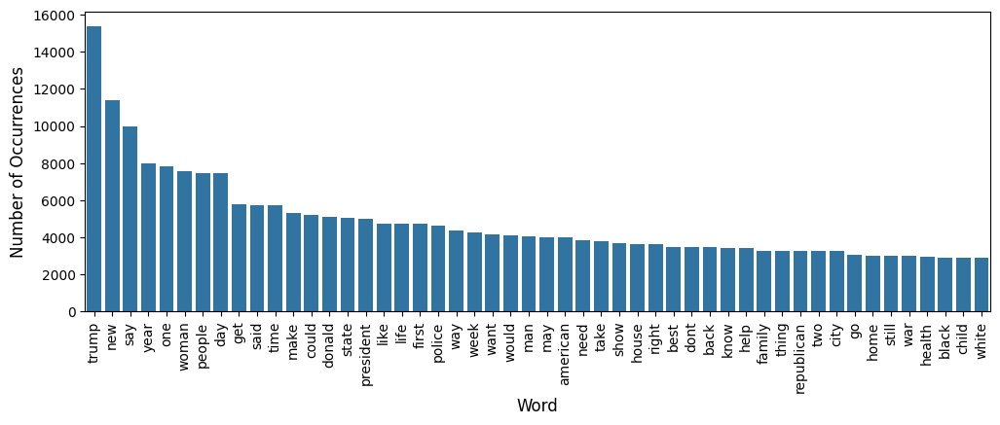

In [98]:
plt.figure(figsize=(12,4))
sns.barplot(data=df_tf[:50], x='term', y='frequency') #plot only the top 10 by slicing the df
plt.ylabel('Number of Occurrences', fontsize=12)
plt.xlabel('Word', fontsize=12)
plt.xticks(rotation=90)
plt.show()

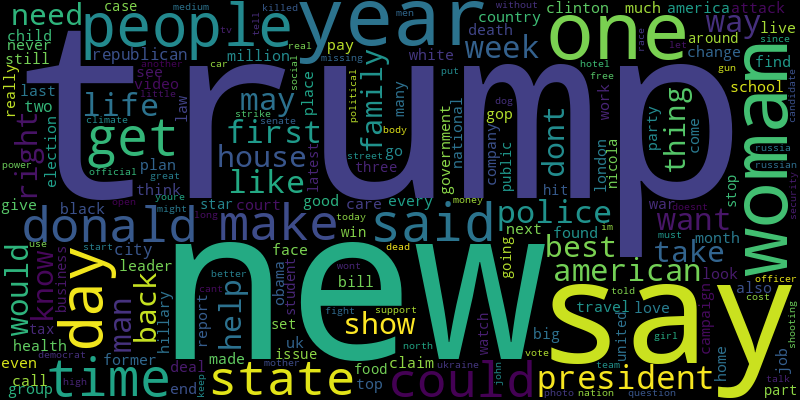

In [99]:
cloud = WordCloud(width=800, height=400)
cloud.generate_from_frequencies(dict(word_counter.most_common(200)))
image = cloud.to_image()
image

In [100]:
documents = [comment.split() for comment in combined_df_clean['clean_title']]

# Tokenization

In [101]:
 #tokenizing_the_words
vocab = corpora.Dictionary(documents) #creating_dictionaries

In [102]:

corpus = [vocab.doc2bow(text) for text in documents] #converts_to_bag-of-words_format(IDandFrequency)
# corpus

In [105]:

num_topics = 20
lda = gensim.models.LdaMulticore(corpus=corpus, id2word=vocab, num_topics=num_topics)
print(lda.print_topics())

In [ ]:
# Alternatively, format topics as sentences
formatted_topics = [f"Topic {idx + 1}: " + " ".join([word for word, _ in lda.show_topic(idx, topn=10)]) for idx in range(num_topics)]
for topic in formatted_topics:
    print(topic)

# Analysis of word associations/correlations

In [106]:
def get_top_n_bigram(corpus, n=None, grams = 2):
    vec = CountVectorizer(ngram_range=(grams, grams), stop_words='english').fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0)
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq[:n]

In [ ]:
for range_val in range(2,7):
    common_words = get_top_n_bigram(combined_df_clean['clean_title'], 10,range_val)
    print("Top 10 Word Association - " + str(range_val) + " grams in All comments")
    counter_val = 0
    for word, freq in common_words:
        print(str(counter_val) + ". '" + word + "' : with Frequency - " + str(freq))
        counter_val = counter_val + 1
    print("-"*40)

Top 10 Word Association - 2 grams in All comments
0. 'donald trump' : with Frequency - 4529
1. 'hillary clinton' : with Frequency - 1565
2. 'white house' : with Frequency - 1408
3. 'supreme court' : with Frequency - 997
4. 'nicola bulley' : with Frequency - 972
5. 'new york' : with Frequency - 955
6. 'health care' : with Frequency - 823
7. 'bernie sander' : with Frequency - 822
8. 'united state' : with Frequency - 698
9. 'climate change' : with Frequency - 645
----------------------------------------
Top 10 Word Association - 3 grams in All comments
0. 'northern ireland protocol' : with Frequency - 194
1. 'help start day' : with Frequency - 193
2. 'welcome help start' : with Frequency - 192
3. 'president donald trump' : with Frequency - 186
4. 'tv live stream' : with Frequency - 170
5. 'time tv live' : with Frequency - 162
6. 'kickoff time tv' : with Frequency - 157
7. 'live stream team' : with Frequency - 152
8. 'stream team hh' : with Frequency - 152
9. 'funniest tweet woman' : with 

In [107]:
import pandas as pd
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
from gensim import corpora
from gensim.models import LdaModel
from sklearn.feature_extraction.text import CountVectorizer

nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')


[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

In [108]:
df = combined_df_clean.copy()
df

,date,combined,clean_title
0,2012-01-28,Tea Time Beneath The Western Ghats (PHOTOS)As ...,tea time beneath western ghat photosas stepped...
1,2012-01-29,Traveling To The Roaring Twenties (PHOTOS)The ...,traveling roaring twenty photosthe fashion fil...
2,2012-01-30,Indiana Welcomes Super Bowl Fans With Children...,indiana welcome super bowl fan childrens postc...
3,2012-01-31,TSA Supervisor Waits Hours To Report Possible ...,tsa supervisor wait hour report possible pipe ...
4,2012-02-01,The World Is A ClassroomIs now the time to be ...,classroomis time devoting precious public fund...
...,...,...,...
4041,2024-09-04,What Happened When a German Car Factory Went A...,happened german car factory went electrichow c...
4042,2024-09-05,"Modi's Power Keeps Growing, and India Looks Su...",modis power keep growing india look sure give ...
4043,2024-10-04,Now Hiring: Sophisticated (but Part-Time) Chat...,hiring sophisticated parttime chatbot tutorsch...
4044,2024-11-04,Apple Lifts Some Restrictions on iPhone Repair...,apple lift restriction iphone repairsvar mista...


# Take Topics as a Feature

In [109]:
df_topic = df.copy()

# Preprocessing Function
def preprocess_news(news):
    lemmatizer = WordNetLemmatizer()
    stop_words = set(stopwords.words('english'))

    # Tokenization
    tokens = word_tokenize(news.lower())

    # Removing stopwords and lemmatization
    tokens = [lemmatizer.lemmatize(word) for word in tokens if word.isalpha() and word not in stop_words]

    return tokens

# Apply preprocessing
df_topic['tokens'] = df_topic['clean_title'].apply(preprocess_news)
df_topic

,date,combined,clean_title,tokens
0,2012-01-28,Tea Time Beneath The Western Ghats (PHOTOS)As ...,tea time beneath western ghat photosas stepped...,"[tea, time, beneath, western, ghat, photosas, ..."
1,2012-01-29,Traveling To The Roaring Twenties (PHOTOS)The ...,traveling roaring twenty photosthe fashion fil...,"[traveling, roaring, twenty, photosthe, fashio..."
2,2012-01-30,Indiana Welcomes Super Bowl Fans With Children...,indiana welcome super bowl fan childrens postc...,"[indiana, welcome, super, bowl, fan, childrens..."
3,2012-01-31,TSA Supervisor Waits Hours To Report Possible ...,tsa supervisor wait hour report possible pipe ...,"[tsa, supervisor, wait, hour, report, possible..."
4,2012-02-01,The World Is A ClassroomIs now the time to be ...,classroomis time devoting precious public fund...,"[classroomis, time, devoting, precious, public..."
...,...,...,...,...
4041,2024-09-04,What Happened When a German Car Factory Went A...,happened german car factory went electrichow c...,"[happened, german, car, factory, went, electri..."
4042,2024-09-05,"Modi's Power Keeps Growing, and India Looks Su...",modis power keep growing india look sure give ...,"[modis, power, keep, growing, india, look, sur..."
4043,2024-10-04,Now Hiring: Sophisticated (but Part-Time) Chat...,hiring sophisticated parttime chatbot tutorsch...,"[hiring, sophisticated, parttime, chatbot, tut..."
4044,2024-11-04,Apple Lifts Some Restrictions on iPhone Repair...,apple lift restriction iphone repairsvar mista...,"[apple, lift, restriction, iphone, repairsvar,..."


# Check Best Topic Number

In [110]:
# Create a dictionary representation of the documents.
dictionary = corpora.Dictionary(df_topic['tokens'])

# Create a corpus: List of lists of (token_id, token_count)
corpus = [dictionary.doc2bow(text) for text in df_topic['tokens']]

In [115]:
no_of_topics = 30

In [116]:
from gensim.models.coherencemodel import CoherenceModel

def compute_coherence_values(dictionary, corpus, texts, limit, start=2, step=1, coherence='c_v', passes=10, iterations=50):
    coherence_values = []
    model_list = []
    for num_topics in range(start, limit, step):
        model = LdaModel(corpus=corpus, id2word=dictionary, num_topics=num_topics,
                         passes=passes, iterations=iterations, random_state=42)
        model_list.append(model)
        coherencemodel = CoherenceModel(model=model, texts=texts, dictionary=dictionary, coherence=coherence)
        coherence_values.append(coherencemodel.get_coherence())
    return model_list, coherence_values

# Running the function
model_list, coherence_values = compute_coherence_values(
    dictionary=dictionary,
    corpus=corpus,
    texts=df_topic['tokens'],
    start=2,
    limit=no_of_topics,
    step=1,
    coherence='c_v',  # You can change this to 'u_mass', 'c_uci', or 'c_npmi'
    passes=10,        # Increase passes if you want more accurate models
    iterations=100    # More iterations can help the model converge better
)


KeyboardInterrupt: 

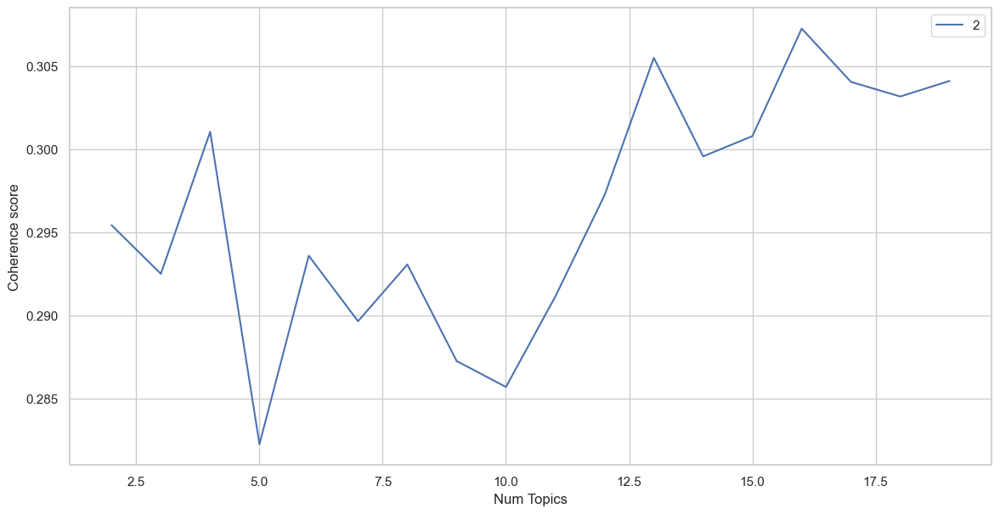

In [ ]:
# Plotting
plt.subplots(figsize=(14, 7))
import matplotlib.pyplot as plt
x = range(2, no_of_topics, 1)
plt.plot(x, coherence_values)
plt.xlabel("Num Topics")
plt.ylabel("Coherence score")
plt.legend(x)
plt.show()

In [ ]:
print(x,coherence_values )

range(2, 20) [0.2954243474870376, 0.2924995042515512, 0.3010479202561392, 0.2822426702542186, 0.2935858717178334, 0.28964498855473725, 0.2930579369263777, 0.28725006970513045, 0.28568963913429524, 0.29112098112162343, 0.297224643496608, 0.3054961281303952, 0.29956392555713096, 0.3007855073548478, 0.3072525198759106, 0.30404646008737507, 0.3031684347523209, 0.304105506916814]


In [ ]:
# Find the number of topics that gives the highest coherence value
max_coherence_value = max(coherence_values)
optimal_num_topics = range(2, 30, 1)[coherence_values.index(max_coherence_value)]

print(f"The optimal number of topics is {optimal_num_topics} with a coherence value of {max_coherence_value:.4f}")


The optimal number of topics is 16 with a coherence value of 0.3073


# Pass the Number of topics as a Parameter

In [117]:
# optimal_num_topics = 16

In [118]:
# Train the LDA model
lda_model = LdaModel(corpus=corpus,
                     id2word=dictionary,
                     num_topics=optimal_num_topics,
                     random_state=42,
                     passes=10,
                    update_every=1,
                    alpha='auto',
                    per_word_topics=True
                    )

# Display topics and their associated words
topics = lda_model.print_topics(num_words=5)
for topic in topics:
    print(f"Topic {topic[0]}: {topic[1]}")

Topic 0: 0.000*"spangled" + 0.000*"christchurch" + 0.000*"trump" + 0.000*"new" + 0.000*"year"
Topic 1: 0.000*"ibizas" + 0.000*"geology" + 0.000*"say" + 0.000*"trump" + 0.000*"new"
Topic 2: 0.000*"mccabe" + 0.000*"carlsons" + 0.000*"abetting" + 0.000*"mccall" + 0.000*"symonds"
Topic 3: 0.001*"kerala" + 0.000*"cafés" + 0.000*"melbourne" + 0.000*"toronto" + 0.000*"buffet"
Topic 4: 0.000*"new" + 0.000*"woman" + 0.000*"trump" + 0.000*"people" + 0.000*"one"
Topic 5: 0.006*"new" + 0.005*"police" + 0.005*"say" + 0.004*"woman" + 0.004*"day"
Topic 6: 0.000*"brecon" + 0.000*"simian" + 0.000*"otherwordly" + 0.000*"perrywhen" + 0.000*"meanderings"
Topic 7: 0.007*"one" + 0.006*"travel" + 0.006*"way" + 0.005*"time" + 0.005*"year"
Topic 8: 0.000*"bautista" + 0.000*"faroe" + 0.000*"new" + 0.000*"trump" + 0.000*"say"
Topic 9: 0.000*"trump" + 0.000*"one" + 0.000*"new" + 0.000*"time" + 0.000*"woman"
Topic 10: 0.026*"price" + 0.022*"insight" + 0.021*"fund" + 0.019*"market" + 0.018*"gilt"
Topic 11: 0.000*"o

In [119]:
# Get the topics from the best LDA model
topics = lda_model.print_topics(-1)

# Function to clean up the topics
def clean_topic(topic):
    # Remove the numeric weights (e.g., '0.007*') using a regular expression
    cleaned_topic = ''.join([word.split("*")[1] for word in topic.split(" + ")])
    cleaned_topic = cleaned_topic.replace('"',' ')
    return cleaned_topic.strip(' ')  # Remove any extra quotation marks

for topic in topics:
    print(f"Topic {topic[0]}: {clean_topic(topic[1])}")


Topic 0: spangled  christchurch  trump  new  year  say  get  week  time  day
Topic 1: ibizas  geology  say  trump  new  day  get  life  time  like
Topic 2: mccabe  carlsons  abetting  mccall  symonds  bondi  strada  invictus  scrapbook  changethere
Topic 3: kerala  cafés  melbourne  toronto  buffet  terra  galápagos  yellowstone  ballooning  lagoon
Topic 4: new  woman  trump  people  one  get  time  year  american  make
Topic 5: new  police  say  woman  day  uk  london  year  north  could
Topic 6: brecon  simian  otherwordly  perrywhen  meanderings  fronti  poshpacker  beachbum  bartenderserver  icelandright
Topic 7: one  travel  way  time  year  best  day  new  life  like
Topic 8: bautista  faroe  new  trump  say  year  make  said  woman  one
Topic 9: trump  one  new  time  woman  day  year  people  say  donald
Topic 10: price  insight  fund  market  gilt  investment  september  value  manager  ldi
Topic 11: one  new  year  like  way  woman  trump  people  day  american
Topic 12: trum

In [120]:
# Assign topic distribution to each day
def get_topic_distribution(text):
    bow = dictionary.doc2bow(text)
    return lda_model.get_document_topics(bow)

df_topic['topic_distribution'] = df_topic['tokens'].apply(get_topic_distribution)

# # Display the topic distribution for each day
# for index, row in df.iterrows():
#     print(f"Date: {row['date']}, Topic Distribution: {row['topic_distribution']}")
df_topic

,date,combined,clean_title,tokens,topic_distribution
0,2012-01-28,Tea Time Beneath The Western Ghats (PHOTOS)As ...,tea time beneath western ghat photosas stepped...,"[tea, time, beneath, western, ghat, photosas, ...","[(5, 0.16224584), (7, 0.38058236), (12, 0.3872..."
1,2012-01-29,Traveling To The Roaring Twenties (PHOTOS)The ...,traveling roaring twenty photosthe fashion fil...,"[traveling, roaring, twenty, photosthe, fashio...","[(7, 0.407283), (12, 0.5542361), (15, 0.034477..."
2,2012-01-30,Indiana Welcomes Super Bowl Fans With Children...,indiana welcome super bowl fan childrens postc...,"[indiana, welcome, super, bowl, fan, childrens...","[(5, 0.15594387), (7, 0.6520815), (12, 0.17172..."
3,2012-01-31,TSA Supervisor Waits Hours To Report Possible ...,tsa supervisor wait hour report possible pipe ...,"[tsa, supervisor, wait, hour, report, possible...","[(3, 0.042138923), (5, 0.09653048), (7, 0.5268..."
4,2012-02-01,The World Is A ClassroomIs now the time to be ...,classroomis time devoting precious public fund...,"[classroomis, time, devoting, precious, public...","[(3, 0.012149282), (5, 0.072084054), (7, 0.707..."
...,...,...,...,...,...
4041,2024-09-04,What Happened When a German Car Factory Went A...,happened german car factory went electrichow c...,"[happened, german, car, factory, went, electri...","[(5, 0.98232293)]"
4042,2024-09-05,"Modi's Power Keeps Growing, and India Looks Su...",modis power keep growing india look sure give ...,"[modis, power, keep, growing, india, look, sur...","[(5, 0.09026715), (7, 0.87865204), (12, 0.0104..."
4043,2024-10-04,Now Hiring: Sophisticated (but Part-Time) Chat...,hiring sophisticated parttime chatbot tutorsch...,"[hiring, sophisticated, parttime, chatbot, tut...","[(5, 0.9572626), (12, 0.012847516), (15, 0.011..."
4044,2024-11-04,Apple Lifts Some Restrictions on iPhone Repair...,apple lift restriction iphone repairsvar mista...,"[apple, lift, restriction, iphone, repairsvar,...","[(15, 0.98517126)]"


In [121]:
from collections import defaultdict

def aggregate_topics_by_date(group):
    topic_sums = defaultdict(float)
    for dist in group['topic_distribution']:
        for topic_id, prob in dist:
            topic_sums[topic_id] += prob
    total = sum(topic_sums.values())
    return {f"topic_{k}": v/total for k, v in topic_sums.items()}

# Group by date and aggregate topics
topic_features = df_topic.groupby('date').apply(aggregate_topics_by_date).apply(pd.Series).reset_index()

print(topic_features)


            date   topic_5   topic_7  topic_12  topic_15   topic_3  topic_10  \
0     2012-01-28  0.162313  0.380739  0.387371  0.069578       NaN       NaN   
1     2012-01-29       NaN  0.408920  0.556464  0.034616       NaN       NaN   
2     2012-01-30  0.156000  0.652317  0.171789  0.019894       NaN       NaN   
3     2012-01-31  0.096686  0.527687  0.333420       NaN  0.042207       NaN   
4     2012-02-01  0.072133  0.708460  0.138297  0.068952  0.012158       NaN   
...          ...       ...       ...       ...       ...       ...       ...   
4041  2024-09-04  1.000000       NaN       NaN       NaN       NaN       NaN   
4042  2024-09-05  0.092173  0.897205  0.010622       NaN       NaN       NaN   
4043  2024-10-04  0.974739       NaN  0.013082  0.012179       NaN       NaN   
4044  2024-11-04       NaN       NaN       NaN  1.000000       NaN       NaN   
4045  2024-12-04       NaN       NaN       NaN  1.000000       NaN       NaN   

      topic_1  topic_2  topic_6  
0    

# Take Featuers as NER

In [122]:
df_ner_columns
df_ner = df_ner[df_ner['Label'].isin(df_ner_columns)]
df_ner = df_ner.rename(columns= {'Text':'entity','Label':'label'})
df_ner

,entity,label
0,russian,NORP
1,russian,NORP
2,rollin justin,PERSON
3,justin,ORG
4,thomas edison,PERSON
...,...,...
197405,million,CARDINAL
197406,munich kingsley coman,PERSON
197407,german,NORP
197408,manchester city,GPE


# Total top NER Features

In [123]:
top_ner = 5

In [124]:
# Group by 'label' and 'entity' to count occurrences
entity_counts = df_ner.groupby(['label', 'entity']).size().reset_index(name='count')

# For each label, get the top 3 entities based on frequency
top_entities = entity_counts.groupby('label').apply(lambda x: x.nlargest(top_ner, 'count')).reset_index(drop=True)

# Convert to a dictionary for easy lookup
top_entities_dict = top_entities.groupby('label')['entity'].apply(list).to_dict()

# Display the top entities for each label
print(top_entities_dict)

{'CARDINAL': ['one', 'two', 'million', 'three', 'six'], 'EVENT': ['vietnam', 'wwii', 'super bowl', 'hurricane katrina', 'iraq war'], 'FAC': ['guantanamo', 'uva', 'north london', 'notre dame', 'nikki haley'], 'GPE': ['london', 'russia', 'america', 'california', 'china'], 'LAW': ['rico', 'camilla wear', 'crown new', 'superfund', 'west ham'], 'LOC': ['europe', 'middle east', 'africa', 'caribbean', 'asia'], 'MONEY': ['mike penny', 'million dollar', 'billion dollar', 'thousand dollar', 'multimillion dollar'], 'NORP': ['american', 'republican', 'democrat', 'russian', 'muslim'], 'ORDINAL': ['first', 'second', 'third', 'fourth', 'fifth'], 'ORG': ['gop', 'senate', 'white house', 'congress', 'supreme court'], 'PERCENT': ['one percent', 'five percent', 'eight percent', 'three percent', 'four percent'], 'PERSON': ['donald trump', 'hillary clinton', 'clinton', 'bernie', 'putin'], 'PRODUCT': ['cole', 'harry', 'bmw', 'datesjustin', 'kalanick'], 'QUANTITY': ['thousand mile', 'gallon', 'hundred mile', 

In [125]:
df_ner_feat = df.copy()
df_ner_feat

,date,combined,clean_title
0,2012-01-28,Tea Time Beneath The Western Ghats (PHOTOS)As ...,tea time beneath western ghat photosas stepped...
1,2012-01-29,Traveling To The Roaring Twenties (PHOTOS)The ...,traveling roaring twenty photosthe fashion fil...
2,2012-01-30,Indiana Welcomes Super Bowl Fans With Children...,indiana welcome super bowl fan childrens postc...
3,2012-01-31,TSA Supervisor Waits Hours To Report Possible ...,tsa supervisor wait hour report possible pipe ...
4,2012-02-01,The World Is A ClassroomIs now the time to be ...,classroomis time devoting precious public fund...
...,...,...,...
4041,2024-09-04,What Happened When a German Car Factory Went A...,happened german car factory went electrichow c...
4042,2024-09-05,"Modi's Power Keeps Growing, and India Looks Su...",modis power keep growing india look sure give ...
4043,2024-10-04,Now Hiring: Sophisticated (but Part-Time) Chat...,hiring sophisticated parttime chatbot tutorsch...
4044,2024-11-04,Apple Lifts Some Restrictions on iPhone Repair...,apple lift restriction iphone repairsvar mista...


In [126]:
# Initialize columns for the top NER entities
for label, entities in top_entities_dict.items():
    for entity in entities:
        df_ner_feat[f'{label}_{entity}'] = df_ner_feat['clean_title'].apply(lambda x: 1 if entity in x else 0)

# Display the DataFrame with new features
df_ner_feat.head()

,date,combined,clean_title,CARDINAL_one,CARDINAL_two,CARDINAL_million,CARDINAL_three,CARDINAL_six,EVENT_vietnam,EVENT_wwii,...,QUANTITY_thousand mile,QUANTITY_gallon,QUANTITY_hundred mile,QUANTITY_mile,QUANTITY_two mile,TIME_morning,TIME_night,TIME_hour,TIME_tonight,TIME_evening
0,2012-01-28,Tea Time Beneath The Western Ghats (PHOTOS)As ...,tea time beneath western ghat photosas stepped...,1,1,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,1
1,2012-01-29,Traveling To The Roaring Twenties (PHOTOS)The ...,traveling roaring twenty photosthe fashion fil...,1,1,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,1
2,2012-01-30,Indiana Welcomes Super Bowl Fans With Children...,indiana welcome super bowl fan childrens postc...,1,1,1,0,1,1,0,...,0,0,0,1,0,0,1,0,0,0
3,2012-01-31,TSA Supervisor Waits Hours To Report Possible ...,tsa supervisor wait hour report possible pipe ...,1,1,0,1,0,0,0,...,0,0,0,0,0,0,1,1,0,0
4,2012-02-01,The World Is A ClassroomIs now the time to be ...,classroomis time devoting precious public fund...,1,1,1,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0


# Event Cluster

In [127]:
df_clust = df.copy()
df_clust

,date,combined,clean_title
0,2012-01-28,Tea Time Beneath The Western Ghats (PHOTOS)As ...,tea time beneath western ghat photosas stepped...
1,2012-01-29,Traveling To The Roaring Twenties (PHOTOS)The ...,traveling roaring twenty photosthe fashion fil...
2,2012-01-30,Indiana Welcomes Super Bowl Fans With Children...,indiana welcome super bowl fan childrens postc...
3,2012-01-31,TSA Supervisor Waits Hours To Report Possible ...,tsa supervisor wait hour report possible pipe ...
4,2012-02-01,The World Is A ClassroomIs now the time to be ...,classroomis time devoting precious public fund...
...,...,...,...
4041,2024-09-04,What Happened When a German Car Factory Went A...,happened german car factory went electrichow c...
4042,2024-09-05,"Modi's Power Keeps Growing, and India Looks Su...",modis power keep growing india look sure give ...
4043,2024-10-04,Now Hiring: Sophisticated (but Part-Time) Chat...,hiring sophisticated parttime chatbot tutorsch...
4044,2024-11-04,Apple Lifts Some Restrictions on iPhone Repair...,apple lift restriction iphone repairsvar mista...


In [128]:
import pandas as pd
import spacy
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.cluster import DBSCAN
import numpy as np

# Function to extract entities and key phrases
def extract_phrases(text):
    doc = nlp(text)
    # Extract named entities and noun chunks (key phrases)
    entities = [ent.text for ent in doc.ents]
    noun_chunks = [chunk.text for chunk in doc.noun_chunks]
    return entities + noun_chunks

# Apply the function to the news articles
df_clust['phrases'] = df_clust['clean_title'].apply(extract_phrases)
df_clust

KeyboardInterrupt: 

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer

# Flatten the list of phrases for vectorization
df_clust['phrases_flat'] = df_clust['phrases'].apply(lambda x: ' '.join(x))

# Vectorize the phrases
vectorizer = CountVectorizer()
X = vectorizer.fit_transform(df_clust['phrases_flat'])


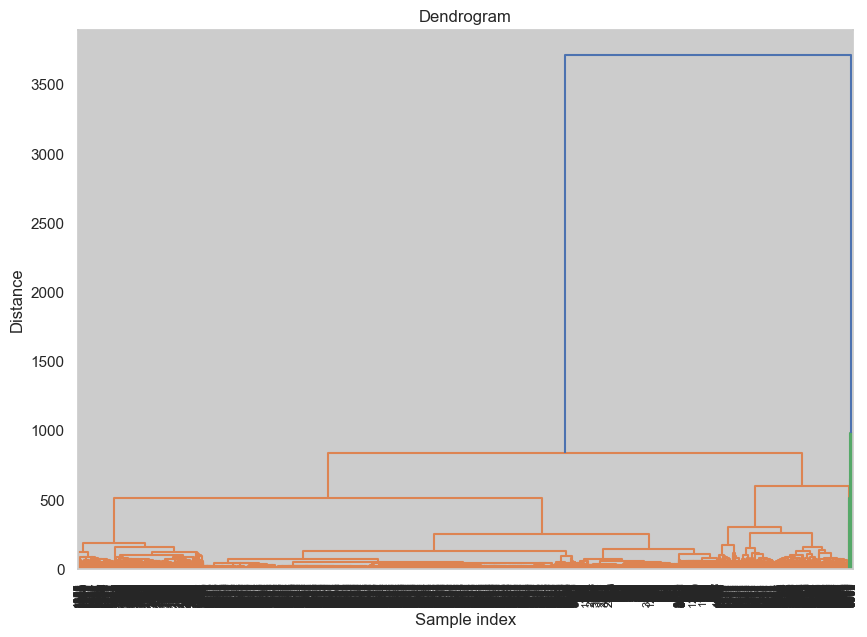

In [ ]:
import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import dendrogram, linkage

# Generate the linkage matrix
Z = linkage(X.toarray(), method='ward')  # You can also try 'average', 'single', 'complete'

# Plot the dendrogram
plt.figure(figsize=(10, 7))
dendrogram(Z, leaf_rotation=90, leaf_font_size=8)
plt.title('Dendrogram')
plt.xlabel('Sample index')
plt.ylabel('Distance')
plt.show()


In [ ]:
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score
import numpy as np

# # Define ranges for hyperparameters
eps_values = [1.0, 5.0, 10, 30, 50]
min_samples_values = [2, 5, 10, 15, 20]

best_eps = best_min_samples = 0
best_score = -1

for eps in eps_values:
    for min_samples in min_samples_values:
#         dbscan = DBSCAN(eps=eps, min_samples=min_samples)
        dbscan = DBSCAN(eps=eps)
        labels = dbscan.fit_predict(X.toarray())

        # Ensure at least two clusters to compute silhouette score
        if len(set(labels)) > 1:
            score = silhouette_score(X.toarray(), labels)

            if score > best_score:
                best_score = score
                best_eps = eps
                best_min_samples = min_samples

print(f"Best eps: {best_eps}, Best min_samples: {best_min_samples} with Silhouette Score: {best_score:.4f}")


Best eps: 50, Best min_samples: 2 with Silhouette Score: 0.8824


In [ ]:
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score
import numpy as np

# # Define ranges for hyperparameters
eps_values = [30, 100,200,500]
min_samples_values = [2, 5, 10]

best_eps = best_min_samples = 0
best_score = -1

for eps in eps_values:
    for min_samples in min_samples_values:
#         dbscan = DBSCAN(eps=eps, min_samples=min_samples)
        dbscan = DBSCAN(eps=eps)
        labels = dbscan.fit_predict(X.toarray())

        # Ensure at least two clusters to compute silhouette score
        if len(set(labels)) > 1:
            score = silhouette_score(X.toarray(), labels)

            if score > best_score:
                best_score = score
                best_eps = eps
                best_min_samples = min_samples

print(f"Best eps: {best_eps}, Best min_samples: {best_min_samples} with Silhouette Score: {best_score:.4f}")


Best eps: 200, Best min_samples: 2 with Silhouette Score: 0.9459


# clustering adjust the DBSCAN eps

In [ ]:
# Apply DBSCAN clustering
dbscan = DBSCAN(eps=best_eps, min_samples=best_min_samples)
df_clust['event_cluster'] = dbscan.fit_predict(X.toarray())

# Label events as significant if they belong to a cluster
df_clust['is_event'] = df_clust['event_cluster'].apply(lambda x: 1 if x != -1 else 0)
df_clust

,date,combined,clean_title,phrases,phrases_flat,event_cluster,is_event
0,2012-01-28,Tea Time Beneath The Western Ghats (PHOTOS)As ...,tea time beneath western ghat photosas stepped...,"[russian, russian, rollin justin, justin, thom...",russian russian rollin justin justin thomas ed...,0,1
1,2012-01-29,Traveling To The Roaring Twenties (PHOTOS)The ...,traveling roaring twenty photosthe fashion fil...,"[twenty, james love, gamein weekly, week, jean...",twenty james love gamein weekly week jean jean...,0,1
2,2012-01-30,Indiana Welcomes Super Bowl Fans With Children...,indiana welcome super bowl fan childrens postc...,"[indiana, new york, new england, two, one, per...",indiana new york new england two one peruvian ...,0,1
3,2012-01-31,TSA Supervisor Waits Hours To Report Possible ...,tsa supervisor wait hour report possible pipe ...,"[hour, monday, one, ben flajnik, photosmonday,...",hour monday one ben flajnik photosmonday night...,0,1
4,2012-02-01,The World Is A ClassroomIs now the time to be ...,classroomis time devoting precious public fund...,"[million, manhattan, spring, two hour, mexican...",million manhattan spring two hour mexican bill...,0,1
...,...,...,...,...,...,...,...
4371,2024-09-04,What Happened When a German Car Factory Went A...,happened german car factory went electrichow c...,"[german, china, russia, putin, happened german...",german china russia putin happened german car ...,0,1
4372,2024-09-05,"Modi's Power Keeps Growing, and India Looks Su...",modis power keep growing india look sure give ...,"[india, modis power, india, moredisabled peopl...",india modis power india moredisabled people book,0,1
4373,2024-10-04,Now Hiring: Sophisticated (but Part-Time) Chat...,hiring sophisticated parttime chatbot tutorsch...,[sophisticated parttime chatbot tutorschampion...,sophisticated parttime chatbot tutorschampions...,0,1
4374,2024-11-04,Apple Lifts Some Restrictions on iPhone Repair...,apple lift restriction iphone repairsvar mista...,"[israel, million, apple lift restriction iphon...",israel million apple lift restriction iphone r...,0,1


In [ ]:
df_clust['is_event'].value_counts()

1    4355
0      21
Name: is_event, dtype: int64

In [ ]:
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score

# Set the number of clusters based on the dendrogram
n_clusters = 2  # Adjust based on your dendrogram observation

# Apply Agglomerative Hierarchical Clustering
hierarchical = AgglomerativeClustering(n_clusters=n_clusters, affinity='euclidean', linkage='ward')
labels = hierarchical.fit_predict(X.toarray())

# Compute the silhouette score to evaluate clustering quality
score = silhouette_score(X.toarray(), labels)
print(f"Hierarchical Clustering with {n_clusters} clusters Silhouette Score: {score:.4f}")

# Add cluster labels to DataFrame
df_clust['event_cluster1'] = labels

Hierarchical Clustering with 2 clusters Silhouette Score: 0.9485


In [ ]:
df_clust['event_cluster1'].value_counts()

1    4357
0      19
Name: event_cluster1, dtype: int64

In [ ]:
df_clust.to_csv('df_clust.csv')

# VADER  Sentiment Analysis

In [ ]:
sia = SentimentIntensityAnalyzer()
def score_vader(text):
    return sia.polarity_scores(text)["compound"]

In [ ]:
print(combined_df_clean['clean_title'].iloc[0])
print(score_vader(combined_df_clean['clean_title'].iloc[0]))
print(combined_df_clean['clean_title'].iloc[1])
print(score_vader(combined_df_clean['clean_title'].iloc[1]))
print(combined_df_clean['clean_title'].iloc[3])
print(score_vader(combined_df_clean['clean_title'].iloc[3]))

tea time beneath western ghat photosas stepped serene plantation followed narrow damp twisty trail thick humid wilderness russian cargo ship dock international space stationgallery space station expedition mission great russian rocket launch photo vote best spaceship robot play catch starring agile justin rollin justin videoimage throw hizook report dlr started rolling justin added faster arm different gear ratio thomas edison voted iconic inventor yous historythat mean job lack fan wake death last year man relentlessly drove apple create aurora borealis caused huge solar storm shimmer norway videoaurora borealis typically seen high northern latitude period high solar activity tinker change worldtinkering handson garagebased tradition making comeback among average american promising change life better several front pregnant displaced double dangerits time step effort ensure woman everywhere decide freely want child mother deliver baby safely service available woman suffered violence to

In [ ]:
combined_df_clean['vader_sentiment'] = combined_df_clean['clean_title'].apply(score_vader)
combined_df_clean.head()

,date,combined,clean_title,vader_sentiment
0,2012-01-28,Tea Time Beneath The Western Ghats (PHOTOS)As ...,tea time beneath western ghat photosas stepped...,0.9946
1,2012-01-29,Traveling To The Roaring Twenties (PHOTOS)The ...,traveling roaring twenty photosthe fashion fil...,0.9951
2,2012-01-30,Indiana Welcomes Super Bowl Fans With Children...,indiana welcome super bowl fan childrens postc...,0.9806
3,2012-01-31,TSA Supervisor Waits Hours To Report Possible ...,tsa supervisor wait hour report possible pipe ...,0.9766
4,2012-02-01,The World Is A ClassroomIs now the time to be ...,classroomis time devoting precious public fund...,0.9977


In [ ]:
!pip install textblob

  Obtaining dependency information for textblob from https://files.pythonhosted.org/packages/02/07/5fd2945356dd839974d3a25de8a142dc37293c21315729a41e775b5f3569/textblob-0.18.0.post0-py3-none-any.whl.metadata
   ---------------------------------------- 0.0/626.3 kB ? eta -:--:--
    --------------------------------------- 10.2/626.3 kB ? eta -:--:--
   - ------------------------------------- 20.5/626.3 kB 330.3 kB/s eta 0:00:02
   --- ----------------------------------- 61.4/626.3 kB 469.7 kB/s eta 0:00:02
   ------ ------------------------------- 112.6/626.3 kB 656.4 kB/s eta 0:00:01
   ------- ------------------------------ 122.9/626.3 kB 654.9 kB/s eta 0:00:01
   ---------- --------------------------- 174.1/626.3 kB 618.3 kB/s eta 0:00:01
   ------------- ------------------------ 225.3/626.3 kB 724.0 kB/s eta 0:00:01
   ---------------- --------------------- 276.5/626.3 kB 776.2 kB/s eta 0:00:01
   ------------------ ------------------- 307.2/626.3 kB 791.9 kB/s eta 0:00:01
   ------

# textblob Sentiment Analysis

In [ ]:
from textblob import TextBlob

def score_textblob(text):
    blob = TextBlob(text)
    return blob.sentiment.polarity  # You can also include subjectivity if needed

combined_df_clean['textblob_sentiment'] = combined_df_clean['clean_title'].apply(score_textblob)


In [ ]:
!pip install tensorflow

^C


# Transformers-Based Models for Sentiment Analysis

In [ ]:
# from transformers import pipeline

# # Initialize sentiment analysis pipeline
# sentiment_pipeline = pipeline('sentiment-analysis')

# def score_transformers(text):
#     result = sentiment_pipeline(text)[0]
#     return result['score'] if result['label'] == 'POSITIVE' else -result['score']

# combined_df_clean['transformers_sentiment'] = combined_df_clean['clean_title'].apply(score_transformers)


In [ ]:
combined_df_clean

,date,combined,clean_title,vader_sentiment,textblob_sentiment
0,2012-01-28,Tea Time Beneath The Western Ghats (PHOTOS)As ...,tea time beneath western ghat photosas stepped...,0.9946,0.129496
1,2012-01-29,Traveling To The Roaring Twenties (PHOTOS)The ...,traveling roaring twenty photosthe fashion fil...,0.9951,0.026796
2,2012-01-30,Indiana Welcomes Super Bowl Fans With Children...,indiana welcome super bowl fan childrens postc...,0.9806,0.136525
3,2012-01-31,TSA Supervisor Waits Hours To Report Possible ...,tsa supervisor wait hour report possible pipe ...,0.9766,0.102778
4,2012-02-01,The World Is A ClassroomIs now the time to be ...,classroomis time devoting precious public fund...,0.9977,0.332493
...,...,...,...,...,...
4371,2024-09-04,What Happened When a German Car Factory Went A...,happened german car factory went electrichow c...,-0.8807,-0.150000
4372,2024-09-05,"Modi's Power Keeps Growing, and India Looks Su...",modis power keep growing india look sure give ...,0.6597,0.477778
4373,2024-10-04,Now Hiring: Sophisticated (but Part-Time) Chat...,hiring sophisticated parttime chatbot tutorsch...,0.8393,0.500000
4374,2024-11-04,Apple Lifts Some Restrictions on iPhone Repair...,apple lift restriction iphone repairsvar mista...,0.6486,0.700000


  Obtaining dependency information for tensorflow from https://files.pythonhosted.org/packages/ed/b6/62345568cd07de5d9254fcf64d7e44aacbb6abde11ea953b3cb320e58d19/tensorflow-2.17.0-cp311-cp311-win_amd64.whl.metadata
  Obtaining dependency information for tensorflow-intel==2.17.0 from https://files.pythonhosted.org/packages/66/03/5c447feceb72f5a38ac2aa79d306fa5b5772f982c2b480c1329c7e382900/tensorflow_intel-2.17.0-cp311-cp311-win_amd64.whl.metadata
  Obtaining dependency information for astunparse>=1.6.0 from https://files.pythonhosted.org/packages/2b/03/13dde6512ad7b4557eb792fbcf0c653af6076b81e5941d36ec61f7ce6028/astunparse-1.6.3-py2.py3-none-any.whl.metadata
  Obtaining dependency information for flatbuffers>=24.3.25 from https://files.pythonhosted.org/packages/41/f0/7e988a019bc54b2dbd0ad4182ef2d53488bb02e58694cd79d61369e85900/flatbuffers-24.3.25-py2.py3-none-any.whl.metadata
  Obtaining dependency information for gast!=0.5.0,!=0.5.1,!=0.5.2,>=0.2.1 from https://files.pythonhosted.org/p

In [ ]:
df_clean = combined_df_clean.copy()

In [ ]:
df_clean = df_clean[['date','vader_sentiment','textblob_sentiment']]
df_clean = df_clean.merge(df_clust[['date','is_event']], on ='date')
df_clean = df_clean.merge(topic_features, on ='date')
df_clean = df_clean.merge(df_ner_feat, on ='date')
df_clean.drop(columns=['combined','clean_title'],inplace=True)
df_clean.fillna(0,inplace=True)
df_clean

,date,vader_sentiment,textblob_sentiment,is_event,topic_12,topic_14,topic_15,topic_4,topic_5,topic_1,...,QUANTITY_thousand mile,QUANTITY_gallon,QUANTITY_hundred mile,QUANTITY_mile,QUANTITY_two mile,TIME_morning,TIME_night,TIME_hour,TIME_tonight,TIME_evening
0,2012-01-28,0.9946,0.129496,1,0.534414,0.336033,0.129553,0.0,0.000000,0.0,...,0,0,0,1,0,0,0,0,0,1
1,2012-01-29,0.9951,0.026796,1,0.433312,0.537105,0.029583,0.0,0.000000,0.0,...,0,0,0,0,0,0,1,0,0,1
2,2012-01-30,0.9806,0.136525,1,0.669137,0.222382,0.108482,0.0,0.000000,0.0,...,0,0,0,1,0,0,1,0,0,0
3,2012-01-31,0.9766,0.102778,1,0.572719,0.368841,0.058440,0.0,0.000000,0.0,...,0,0,0,0,0,0,1,1,0,0
4,2012-02-01,0.9977,0.332493,1,0.728204,0.205685,0.066111,0.0,0.000000,0.0,...,0,0,0,0,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4371,2024-09-04,-0.8807,-0.150000,1,0.000000,0.633391,0.366609,0.0,0.000000,0.0,...,0,0,0,0,0,0,0,0,0,0
4372,2024-09-05,0.6597,0.477778,1,0.572521,0.139108,0.000000,0.0,0.288372,0.0,...,0,0,0,0,0,0,0,0,0,0
4373,2024-10-04,0.8393,0.500000,1,0.000000,0.092120,0.000000,0.0,0.907880,0.0,...,0,0,0,0,0,0,0,0,0,0
4374,2024-11-04,0.6486,0.700000,1,0.000000,0.107711,0.862693,0.0,0.000000,0.0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
df_clean.to_csv('df_clean_NEW.csv')

  Obtaining dependency information for tensorflow from https://files.pythonhosted.org/packages/ed/b6/62345568cd07de5d9254fcf64d7e44aacbb6abde11ea953b3cb320e58d19/tensorflow-2.17.0-cp311-cp311-win_amd64.whl.metadata
  Using cached tensorflow-2.17.0-cp311-cp311-win_amd64.whl.metadata (3.2 kB)
  Obtaining dependency information for tensorflow-intel==2.17.0 from https://files.pythonhosted.org/packages/66/03/5c447feceb72f5a38ac2aa79d306fa5b5772f982c2b480c1329c7e382900/tensorflow_intel-2.17.0-cp311-cp311-win_amd64.whl.metadata
  Using cached tensorflow_intel-2.17.0-cp311-cp311-win_amd64.whl.metadata (5.0 kB)
  Obtaining dependency information for astunparse>=1.6.0 from https://files.pythonhosted.org/packages/2b/03/13dde6512ad7b4557eb792fbcf0c653af6076b81e5941d36ec61f7ce6028/astunparse-1.6.3-py2.py3-none-any.whl.metadata
  Using cached astunparse-1.6.3-py2.py3-none-any.whl.metadata (4.4 kB)
  Obtaining dependency information for flatbuffers>=24.3.25 from https://files.pythonhosted.org/package

# Stocks Data

In [2]:
df_clean =pd.read_csv('df_clean_NEW.csv')
df_clean.drop(columns=['Unnamed: 0'],inplace=True)
df_clean

,date,vader_sentiment,textblob_sentiment,is_event,topic_12,topic_14,topic_15,topic_4,topic_5,topic_1,...,QUANTITY_thousand mile,QUANTITY_gallon,QUANTITY_hundred mile,QUANTITY_mile,QUANTITY_two mile,TIME_morning,TIME_night,TIME_hour,TIME_tonight,TIME_evening
0,28/01/2012,0.9946,0.129496,1,0.534414,0.336033,0.129553,0.0,0.000000,0.0,...,0,0,0,1,0,0,0,0,0,1
1,29/01/2012,0.9951,0.026796,1,0.433312,0.537105,0.029583,0.0,0.000000,0.0,...,0,0,0,0,0,0,1,0,0,1
2,30/01/2012,0.9806,0.136525,1,0.669137,0.222382,0.108482,0.0,0.000000,0.0,...,0,0,0,1,0,0,1,0,0,0
3,31/01/2012,0.9766,0.102778,1,0.572719,0.368841,0.058440,0.0,0.000000,0.0,...,0,0,0,0,0,0,1,1,0,0
4,01/02/2012,0.9977,0.332493,1,0.728204,0.205685,0.066111,0.0,0.000000,0.0,...,0,0,0,0,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4371,04/09/2024,-0.8807,-0.150000,1,0.000000,0.633391,0.366609,0.0,0.000000,0.0,...,0,0,0,0,0,0,0,0,0,0
4372,05/09/2024,0.6597,0.477778,1,0.572521,0.139108,0.000000,0.0,0.288372,0.0,...,0,0,0,0,0,0,0,0,0,0
4373,04/10/2024,0.8393,0.500000,1,0.000000,0.092120,0.000000,0.0,0.907880,0.0,...,0,0,0,0,0,0,0,0,0,0
4374,04/11/2024,0.6486,0.700000,1,0.000000,0.107711,0.862693,0.0,0.000000,0.0,...,0,0,0,0,0,0,0,0,0,0


In [3]:
stocks_df = pd.read_csv(r"FTSE 100 Historical Results Price Data.csv")
stocks_df.dropna(inplace=True)
stocks_df

,Date,Price,Open,High,Low,Vol.,Change %
0,30/08/2024,"8,376.63","8,379.64","8,414.37","8,363.74",1.08B,-0.04%
1,29/08/2024,"8,379.64","8,343.85","8,392.40","8,336.58",590.01M,0.43%
2,28/08/2024,"8,343.85","8,345.46","8,362.74","8,322.28",608.50M,-0.02%
3,27/08/2024,"8,345.46","8,327.78","8,400.43","8,327.78",772.31M,0.21%
4,23/08/2024,"8,327.78","8,288.00","8,331.90","8,288.00",614.51M,0.48%
...,...,...,...,...,...,...,...
3194,09/01/2012,"5,612.26","5,649.68","5,673.82","5,604.62",785.65M,-0.66%
3195,06/01/2012,"5,649.68","5,624.26","5,682.78","5,623.36",705.02M,0.45%
3196,05/01/2012,"5,624.26","5,668.45","5,689.33","5,614.38",794.28M,-0.78%
3197,04/01/2012,"5,668.45","5,699.91","5,719.83","5,646.36",696.94M,-0.55%


In [4]:
# Convert 'Date' to datetime
stocks_df['Date'] = pd.to_datetime(stocks_df['Date'], format='%d/%m/%Y')

In [5]:
# Create a full date range from the min to max date in the DataFrame
full_date_range = pd.date_range(start=stocks_df['Date'].min(), end=stocks_df['Date'].max())
full_date_range

DatetimeIndex(['2012-01-03', '2012-01-04', '2012-01-05', '2012-01-06',
               '2012-01-07', '2012-01-08', '2012-01-09', '2012-01-10',
               '2012-01-11', '2012-01-12',
               ...
               '2024-08-21', '2024-08-22', '2024-08-23', '2024-08-24',
               '2024-08-25', '2024-08-26', '2024-08-27', '2024-08-28',
               '2024-08-29', '2024-08-30'],
              dtype='datetime64[ns]', length=4624, freq='D')

In [6]:
# Create a DataFrame with the full date range
full_dates_df = pd.DataFrame(full_date_range, columns=['Date'])
full_dates_df

,Date
0,2012-01-03
1,2012-01-04
2,2012-01-05
3,2012-01-06
4,2012-01-07
...,...
4619,2024-08-26
4620,2024-08-27
4621,2024-08-28
4622,2024-08-29


In [7]:
# Merge the full date range DataFrame with the original data
stocks_df = pd.merge(full_dates_df, stocks_df, on='Date', how='left')
stocks_df

,Date,Price,Open,High,Low,Vol.,Change %
0,2012-01-03,"5,699.91","5,572.28","5,699.91","5,572.28",778.53M,2.29%
1,2012-01-04,"5,668.45","5,699.91","5,719.83","5,646.36",696.94M,-0.55%
2,2012-01-05,"5,624.26","5,668.45","5,689.33","5,614.38",794.28M,-0.78%
3,2012-01-06,"5,649.68","5,624.26","5,682.78","5,623.36",705.02M,0.45%
4,2012-01-07,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...
4619,2024-08-26,NaN,NaN,NaN,NaN,NaN,NaN
4620,2024-08-27,"8,345.46","8,327.78","8,400.43","8,327.78",772.31M,0.21%
4621,2024-08-28,"8,343.85","8,345.46","8,362.74","8,322.28",608.50M,-0.02%
4622,2024-08-29,"8,379.64","8,343.85","8,392.40","8,336.58",590.01M,0.43%


# # Forward fill the missing values

In [8]:

stocks_df.ffill(inplace=True)
stocks_df

,Date,Price,Open,High,Low,Vol.,Change %
0,2012-01-03,"5,699.91","5,572.28","5,699.91","5,572.28",778.53M,2.29%
1,2012-01-04,"5,668.45","5,699.91","5,719.83","5,646.36",696.94M,-0.55%
2,2012-01-05,"5,624.26","5,668.45","5,689.33","5,614.38",794.28M,-0.78%
3,2012-01-06,"5,649.68","5,624.26","5,682.78","5,623.36",705.02M,0.45%
4,2012-01-07,"5,649.68","5,624.26","5,682.78","5,623.36",705.02M,0.45%
...,...,...,...,...,...,...,...
4619,2024-08-26,"8,327.78","8,288.00","8,331.90","8,288.00",614.51M,0.48%
4620,2024-08-27,"8,345.46","8,327.78","8,400.43","8,327.78",772.31M,0.21%
4621,2024-08-28,"8,343.85","8,345.46","8,362.74","8,322.28",608.50M,-0.02%
4622,2024-08-29,"8,379.64","8,343.85","8,392.40","8,336.58",590.01M,0.43%


# Pre-process data

In [9]:
# Convert Date to datetime
stocks_df['Date'] = pd.to_datetime(stocks_df['Date'], format='%d/%m/%Y')

# Remove commas from numeric columns and convert to float
for column in ['Price', 'Open', 'High', 'Low']:
    stocks_df[column] = stocks_df[column].str.replace(',', '').astype(float)

In [10]:
# Convert Vol. to numeric
def convert_volume(vol_str):
    if isinstance(vol_str, str):
        vol_str = vol_str.upper()  # Ensure consistency in case
        if 'M' in vol_str:
            return float(vol_str.replace('M', '').replace(',', '')) * 1_000_000
        elif 'B' in vol_str:
            return float(vol_str.replace('B', '').replace(',', '')) * 1_000_000_000
        else:
            return float(vol_str.replace(',', ''))
    else:
        return vol_str

stocks_df['Vol.'] = stocks_df['Vol.'].apply(convert_volume)

In [11]:
# Convert Change % to numeric
stocks_df['Change %'] = stocks_df['Change %'].str.replace('%', '').astype(float)
stocks_df

,Date,Price,Open,High,Low,Vol.,Change %
0,2012-01-03,5699.91,5572.28,5699.91,5572.28,7.785300e+08,2.29
1,2012-01-04,5668.45,5699.91,5719.83,5646.36,6.969400e+08,-0.55
2,2012-01-05,5624.26,5668.45,5689.33,5614.38,7.942800e+08,-0.78
3,2012-01-06,5649.68,5624.26,5682.78,5623.36,7.050200e+08,0.45
4,2012-01-07,5649.68,5624.26,5682.78,5623.36,7.050200e+08,0.45
...,...,...,...,...,...,...,...
4619,2024-08-26,8327.78,8288.00,8331.90,8288.00,6.145100e+08,0.48
4620,2024-08-27,8345.46,8327.78,8400.43,8327.78,7.723100e+08,0.21
4621,2024-08-28,8343.85,8345.46,8362.74,8322.28,6.085000e+08,-0.02
4622,2024-08-29,8379.64,8343.85,8392.40,8336.58,5.900100e+08,0.43


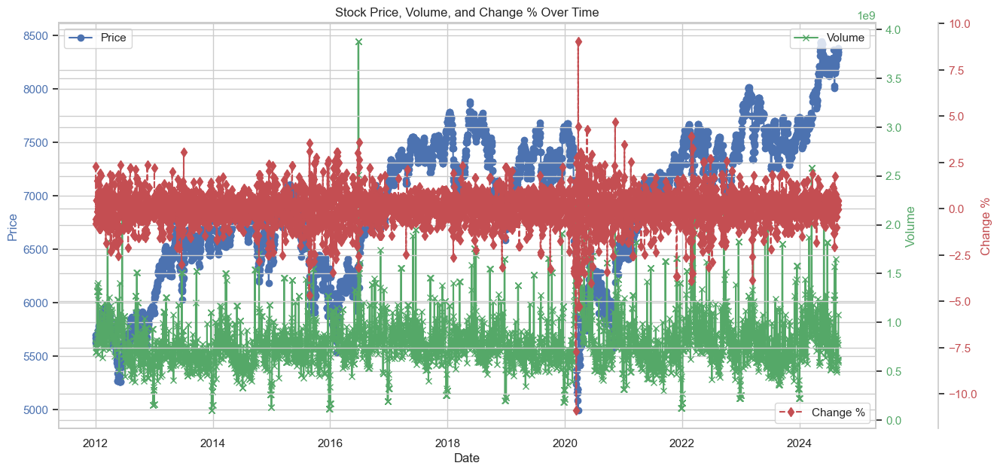

In [12]:
import matplotlib.pyplot as plt
import seaborn as sns

# Ensure that the seaborn style is applied for better aesthetics
sns.set(style="whitegrid")

# Create a figure and axis objects
fig, ax1 = plt.subplots(figsize=(14, 7))

# Plot the closing price
ax1.plot(stocks_df['Date'], stocks_df['Price'], color='b', marker='o', label='Price')
ax1.set_xlabel('Date')
ax1.set_ylabel('Price', color='b')
ax1.tick_params(axis='y', labelcolor='b')

# Create a twin axis to plot volume
ax2 = ax1.twinx()
ax2.plot(stocks_df['Date'], stocks_df['Vol.'], color='g', marker='x', label='Volume')
ax2.set_ylabel('Volume', color='g')
ax2.tick_params(axis='y', labelcolor='g')

# Create another twin axis to plot percentage change
ax3 = ax1.twinx()
ax3.spines['right'].set_position(('outward', 60))  # Offset the third axis
ax3.plot(stocks_df['Date'], stocks_df['Change %'], color='r', marker='d', linestyle='--', label='Change %')
ax3.set_ylabel('Change %', color='r')
ax3.tick_params(axis='y', labelcolor='r')

# Set the title
plt.title('Stock Price, Volume, and Change % Over Time')

# Show legends for each axis
ax1.legend(loc='upper left')
ax2.legend(loc='upper right')
ax3.legend(loc='lower right')

# Show grid for better readability
ax1.grid(True)

# Display the plot
plt.show()


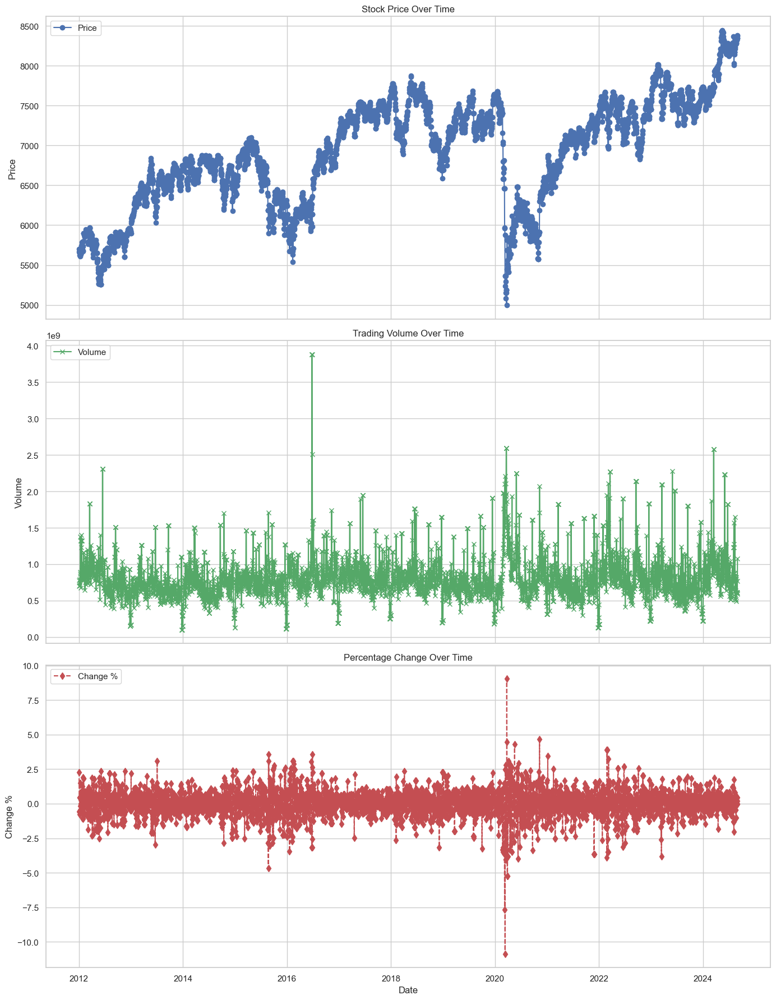

In [13]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set the style for the plots
sns.set(style="whitegrid")

# Create a figure with 3 subplots, arranged vertically
fig, axs = plt.subplots(3, 1, figsize=(14, 18), sharex=True)

# Plot the Price
axs[0].plot(stocks_df['Date'], stocks_df['Price'], color='b', marker='o', linestyle='-', label='Price')
axs[0].set_ylabel('Price')
axs[0].set_title('Stock Price Over Time')
axs[0].legend(loc='upper left')
axs[0].grid(True)

# Plot the Volume
axs[1].plot(stocks_df['Date'], stocks_df['Vol.'], color='g', marker='x', linestyle='-', label='Volume')
axs[1].set_ylabel('Volume')
axs[1].set_title('Trading Volume Over Time')
axs[1].legend(loc='upper left')
axs[1].grid(True)

# Plot the Change %
axs[2].plot(stocks_df['Date'], stocks_df['Change %'], color='r', marker='d', linestyle='--', label='Change %')
axs[2].set_ylabel('Change %')
axs[2].set_title('Percentage Change Over Time')
axs[2].legend(loc='upper left')
axs[2].grid(True)

# Set the x-axis label for the bottom plot
axs[2].set_xlabel('Date')

# Adjust the layout to avoid overlapping labels
plt.tight_layout()

# Show the plots
plt.show()


In [14]:
stocks_grouped_df = stocks_df.groupby('Date').mean().reset_index()
stocks_grouped_df = stocks_grouped_df.rename(columns={'Date':'date'})
stocks_grouped_df

,date,Price,Open,High,Low,Vol.,Change %
0,2012-01-03,5699.91,5572.28,5699.91,5572.28,7.785300e+08,2.29
1,2012-01-04,5668.45,5699.91,5719.83,5646.36,6.969400e+08,-0.55
2,2012-01-05,5624.26,5668.45,5689.33,5614.38,7.942800e+08,-0.78
3,2012-01-06,5649.68,5624.26,5682.78,5623.36,7.050200e+08,0.45
4,2012-01-07,5649.68,5624.26,5682.78,5623.36,7.050200e+08,0.45
...,...,...,...,...,...,...,...
4619,2024-08-26,8327.78,8288.00,8331.90,8288.00,6.145100e+08,0.48
4620,2024-08-27,8345.46,8327.78,8400.43,8327.78,7.723100e+08,0.21
4621,2024-08-28,8343.85,8345.46,8362.74,8322.28,6.085000e+08,-0.02
4622,2024-08-29,8379.64,8343.85,8392.40,8336.58,5.900100e+08,0.43


In [15]:
stocks_grouped_df['Vol.'].max()/1000000, stocks_grouped_df['Vol.'].min()/1000000

(3880.0, 101.67)

In [16]:
stocks_grouped_df['Vol.'] = stocks_grouped_df['Vol.']/1000000

In [17]:
df_clean.columns

Index(['date', 'vader_sentiment', 'textblob_sentiment', 'is_event', 'topic_12',
       'topic_14', 'topic_15', 'topic_4', 'topic_5', 'topic_1', 'topic_8',
       'topic_7', 'topic_10', 'topic_6', 'topic_9', 'topic_3', 'topic_0',
       'CARDINAL_one', 'CARDINAL_two', 'CARDINAL_million', 'CARDINAL_three',
       'CARDINAL_six', 'EVENT_vietnam', 'EVENT_wwii', 'EVENT_super bowl',
       'EVENT_hurricane katrina', 'EVENT_iraq war', 'FAC_guantanamo',
       'FAC_uva', 'FAC_notre dame', 'FAC_north london', 'FAC_nikki haley',
       'GPE_london', 'GPE_russia', 'GPE_america', 'GPE_california',
       'GPE_china', 'LAW_rico', 'LAW_camilla wear', 'LAW_crown new',
       'LAW_superfund', 'LAW_west ham', 'LOC_europe', 'LOC_middle east',
       'LOC_africa', 'LOC_caribbean', 'LOC_asia', 'MONEY_mike penny',
       'MONEY_million dollar', 'MONEY_billion dollar', 'MONEY_thousand dollar',
       'MONEY_every penny', 'NORP_american', 'NORP_republican',
       'NORP_democrat', 'NORP_russian', 'NORP_musli

In [18]:
df_clean['date'] = pd.to_datetime(df_clean['date'])

C:\Users\PRAGYA\AppData\Local\Temp\ipykernel_23736\4103588557.py:1: UserWarning: Parsing dates in DD/MM/YYYY format when dayfirst=False (the default) was specified. This may lead to inconsistently parsed dates! Specify a format to ensure consistent parsing.
  df_clean['date'] = pd.to_datetime(df_clean['date'])


In [19]:
# Convert 'Date' and 'date' to datetime
stocks_grouped_df['date'] = pd.to_datetime(stocks_grouped_df['date'], format='%d/%m/%Y')
df_clean['date'] = pd.to_datetime(df_clean['date'], format='%d/%m/%Y')

# Combine Stocks Data & News Data

In [20]:
# Merge DataFrames on the date column
merged_df = pd.merge(stocks_grouped_df, df_clean, on='date', how='left')
merged_df

,date,Price,Open,High,Low,Vol.,Change %,vader_sentiment,textblob_sentiment,is_event,...,QUANTITY_thousand mile,QUANTITY_gallon,QUANTITY_hundred mile,QUANTITY_mile,QUANTITY_two mile,TIME_morning,TIME_night,TIME_hour,TIME_tonight,TIME_evening
0,2012-01-03,5699.91,5572.28,5699.91,5572.28,778.53,2.29,0.9945,0.102829,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
1,2012-01-04,5668.45,5699.91,5719.83,5646.36,696.94,-0.55,0.9915,0.125633,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0
2,2012-01-05,5624.26,5668.45,5689.33,5614.38,794.28,-0.78,0.9828,0.100445,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
3,2012-01-06,5649.68,5624.26,5682.78,5623.36,705.02,0.45,0.9969,0.285534,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,2012-01-07,5649.68,5624.26,5682.78,5623.36,705.02,0.45,0.9968,0.056445,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4949,2024-08-26,8327.78,8288.00,8331.90,8288.00,614.51,0.48,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4950,2024-08-27,8345.46,8327.78,8400.43,8327.78,772.31,0.21,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4951,2024-08-28,8343.85,8345.46,8362.74,8322.28,608.50,-0.02,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4952,2024-08-29,8379.64,8343.85,8392.40,8336.58,590.01,0.43,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [21]:
merged_df.ffill(inplace=True)
merged_df

,date,Price,Open,High,Low,Vol.,Change %,vader_sentiment,textblob_sentiment,is_event,...,QUANTITY_thousand mile,QUANTITY_gallon,QUANTITY_hundred mile,QUANTITY_mile,QUANTITY_two mile,TIME_morning,TIME_night,TIME_hour,TIME_tonight,TIME_evening
0,2012-01-03,5699.91,5572.28,5699.91,5572.28,778.53,2.29,0.9945,0.102829,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
1,2012-01-04,5668.45,5699.91,5719.83,5646.36,696.94,-0.55,0.9915,0.125633,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0
2,2012-01-05,5624.26,5668.45,5689.33,5614.38,794.28,-0.78,0.9828,0.100445,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
3,2012-01-06,5649.68,5624.26,5682.78,5623.36,705.02,0.45,0.9969,0.285534,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,2012-01-07,5649.68,5624.26,5682.78,5623.36,705.02,0.45,0.9968,0.056445,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4949,2024-08-26,8327.78,8288.00,8331.90,8288.00,614.51,0.48,0.6597,0.477778,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4950,2024-08-27,8345.46,8327.78,8400.43,8327.78,772.31,0.21,0.6597,0.477778,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4951,2024-08-28,8343.85,8345.46,8362.74,8322.28,608.50,-0.02,0.6597,0.477778,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4952,2024-08-29,8379.64,8343.85,8392.40,8336.58,590.01,0.43,0.6597,0.477778,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [22]:
merged_df = merged_df.fillna(merged_df.mean(numeric_only=True))
merged_df

,date,Price,Open,High,Low,Vol.,Change %,vader_sentiment,textblob_sentiment,is_event,...,QUANTITY_thousand mile,QUANTITY_gallon,QUANTITY_hundred mile,QUANTITY_mile,QUANTITY_two mile,TIME_morning,TIME_night,TIME_hour,TIME_tonight,TIME_evening
0,2012-01-03,5699.91,5572.28,5699.91,5572.28,778.53,2.29,0.9945,0.102829,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
1,2012-01-04,5668.45,5699.91,5719.83,5646.36,696.94,-0.55,0.9915,0.125633,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0
2,2012-01-05,5624.26,5668.45,5689.33,5614.38,794.28,-0.78,0.9828,0.100445,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
3,2012-01-06,5649.68,5624.26,5682.78,5623.36,705.02,0.45,0.9969,0.285534,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,2012-01-07,5649.68,5624.26,5682.78,5623.36,705.02,0.45,0.9968,0.056445,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4949,2024-08-26,8327.78,8288.00,8331.90,8288.00,614.51,0.48,0.6597,0.477778,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4950,2024-08-27,8345.46,8327.78,8400.43,8327.78,772.31,0.21,0.6597,0.477778,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4951,2024-08-28,8343.85,8345.46,8362.74,8322.28,608.50,-0.02,0.6597,0.477778,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4952,2024-08-29,8379.64,8343.85,8392.40,8336.58,590.01,0.43,0.6597,0.477778,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [23]:
merged_df_org = merged_df.copy()

# ACF & PCF

Processing column: Price


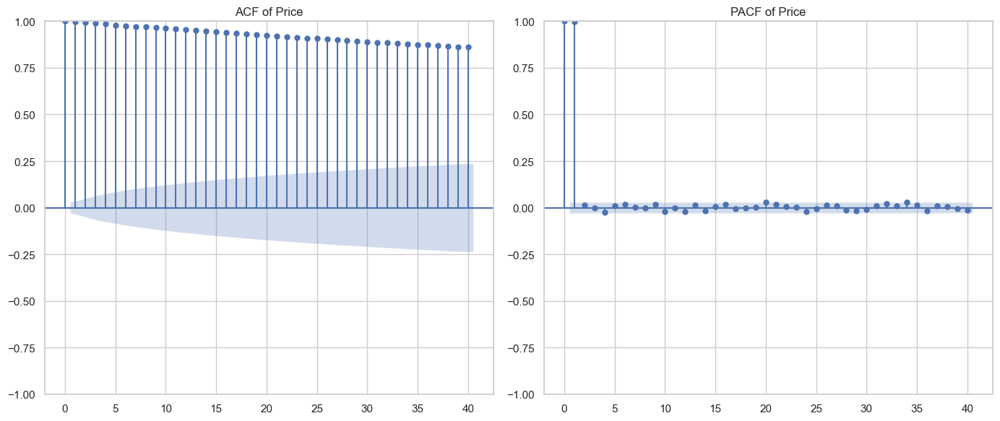

Processing column: Open


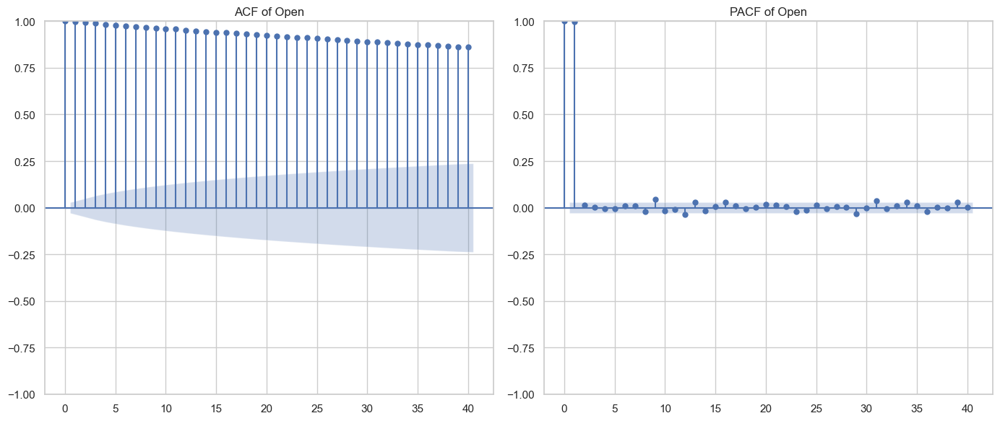

Processing column: High


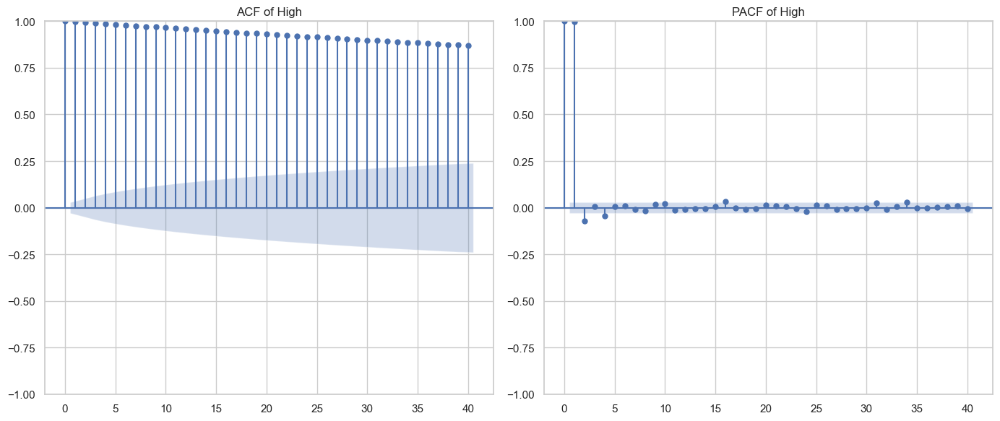

Processing column: Low


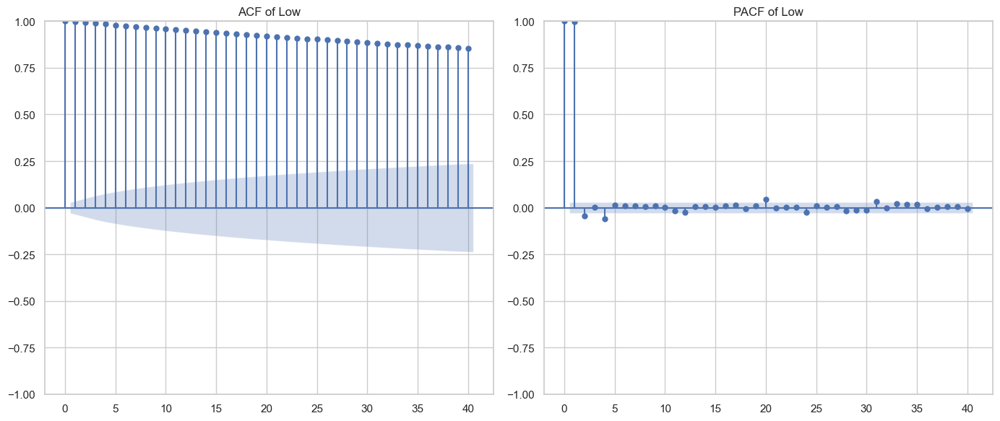

Processing column: Vol.


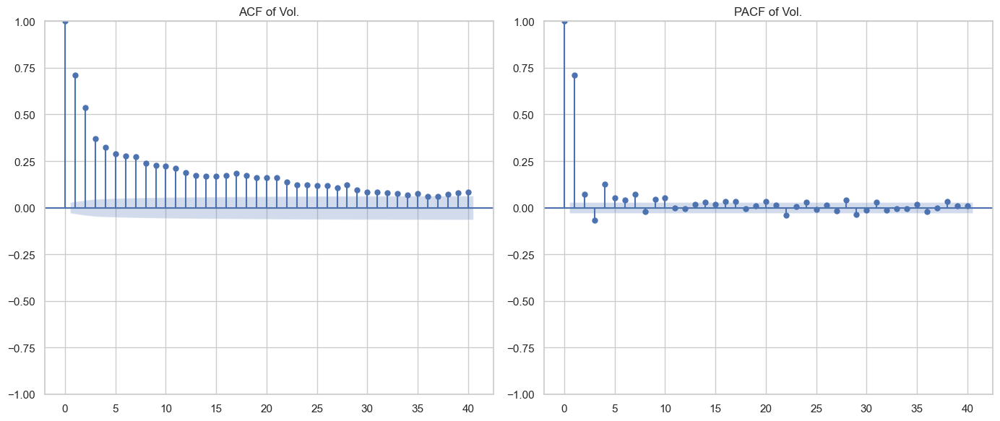

Processing column: Change %


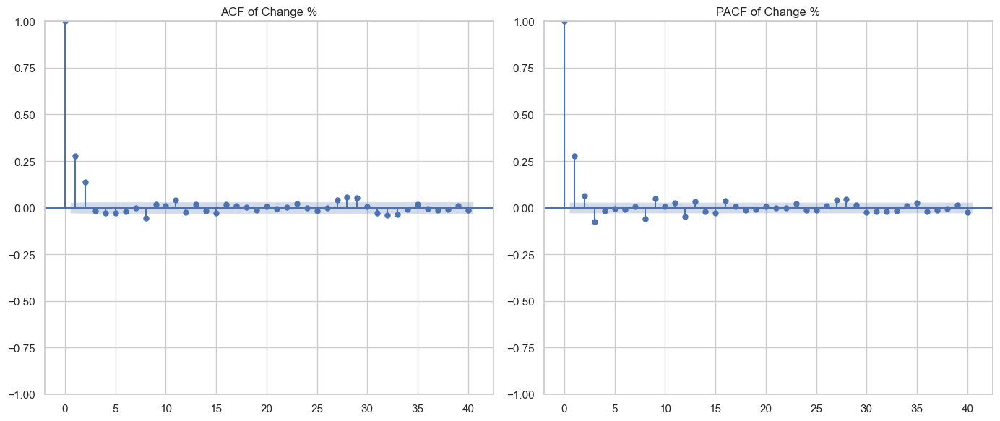

Processing column: vader_sentiment


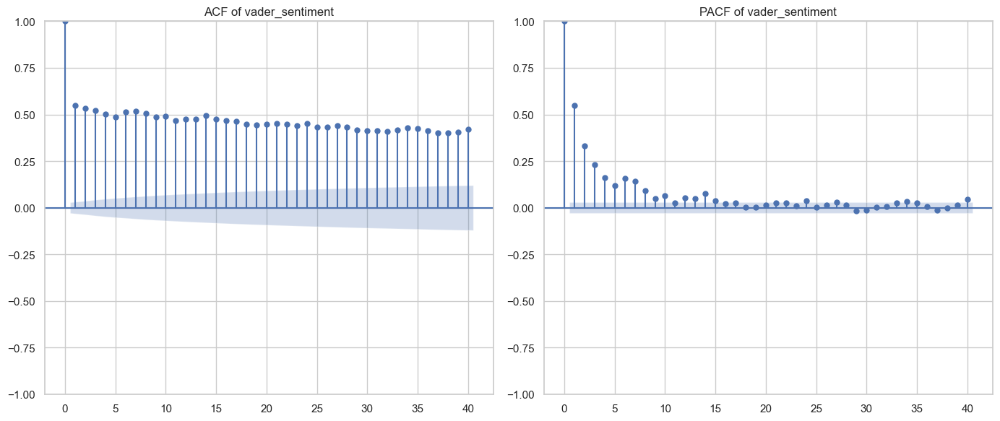

Processing column: textblob_sentiment


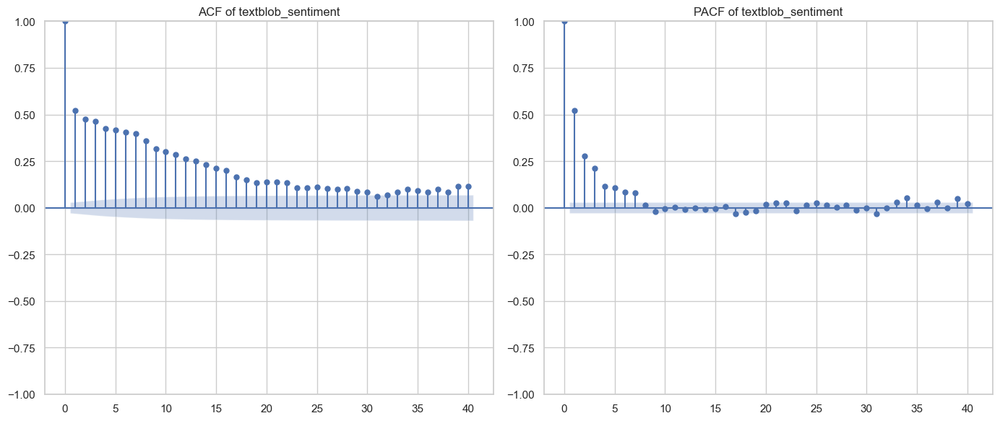

Processing column: is_event


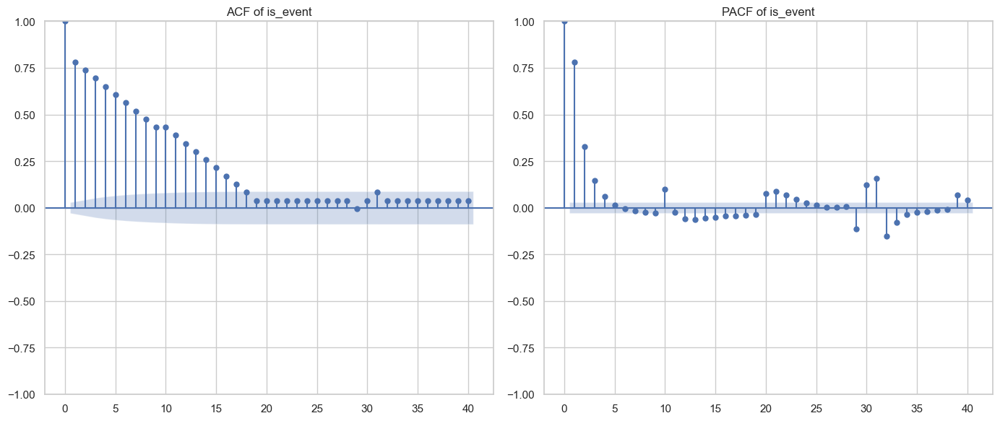

Processing column: topic_12


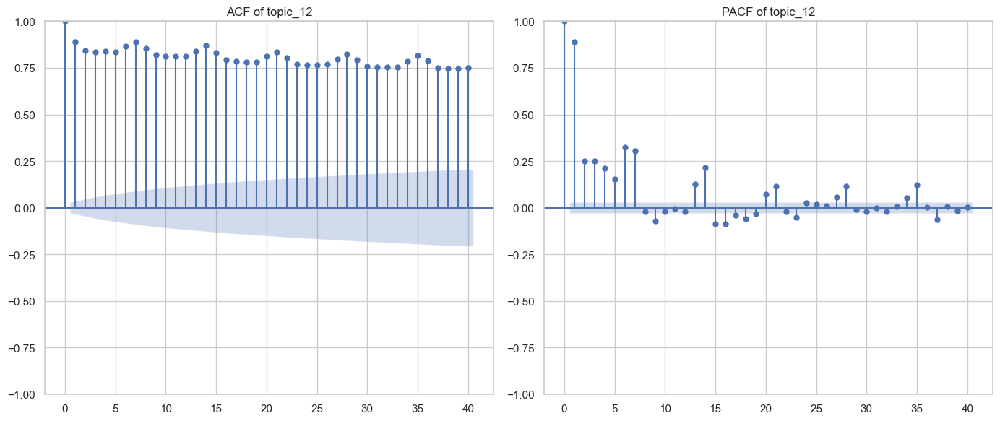

Processing column: topic_14


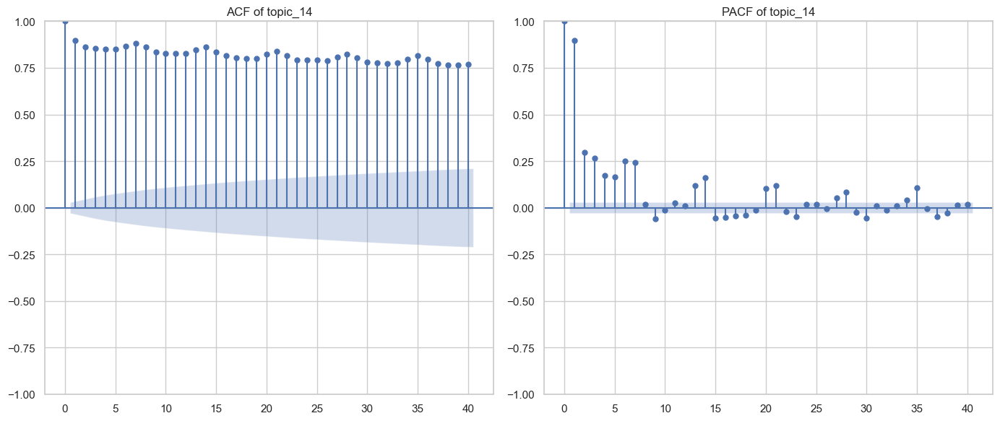

Processing column: topic_15


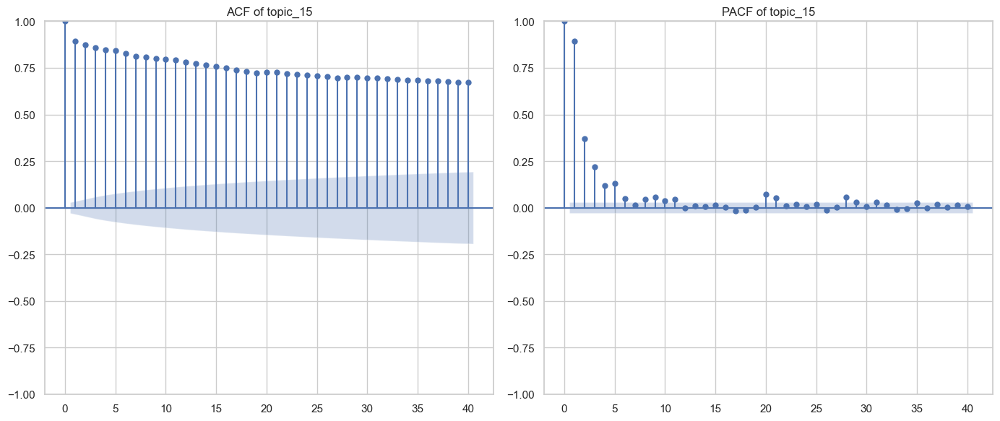

Processing column: topic_4


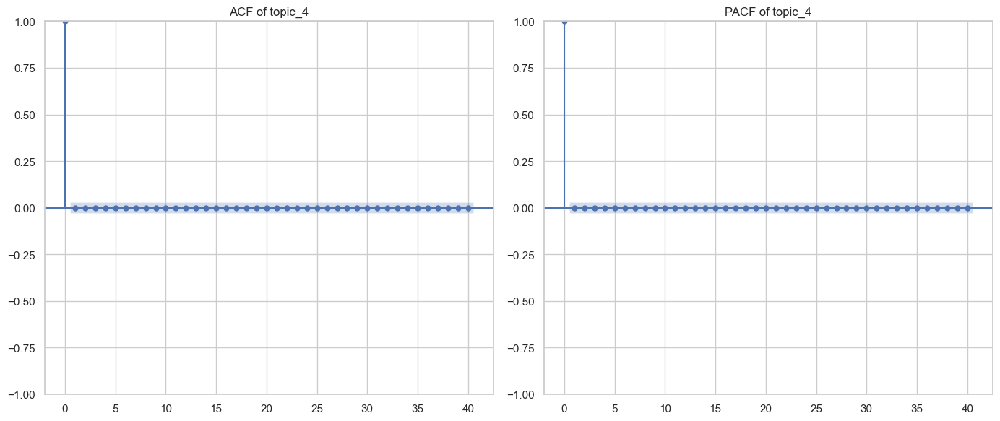

Processing column: topic_5


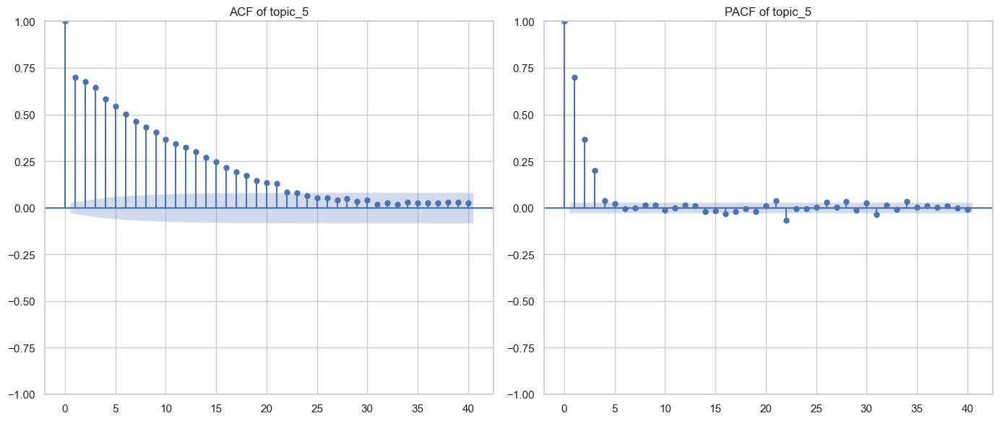

Processing column: topic_1


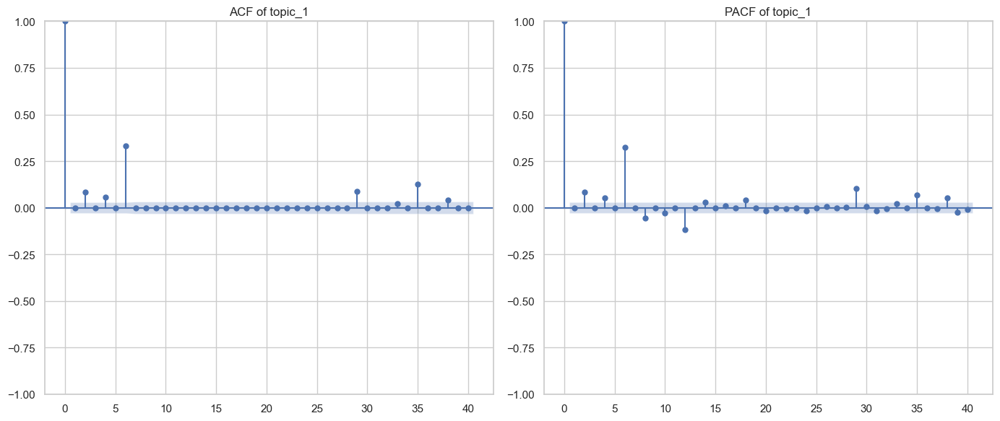

Processing column: topic_8


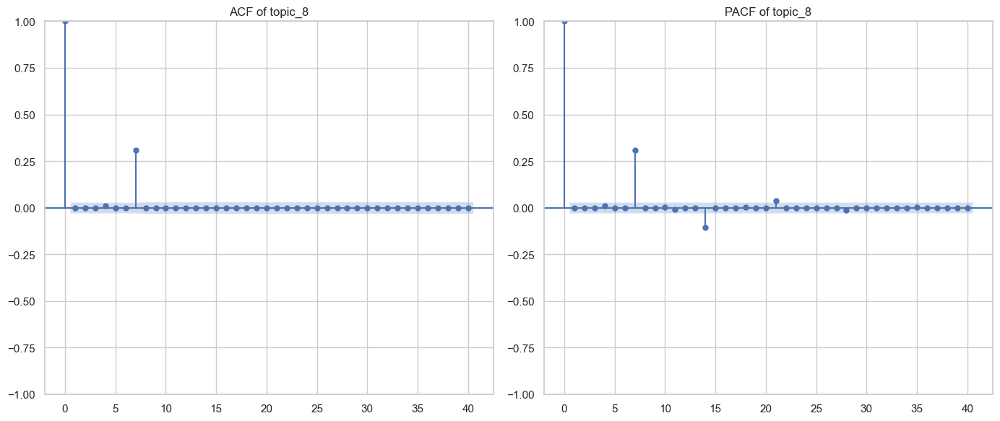

Processing column: topic_7


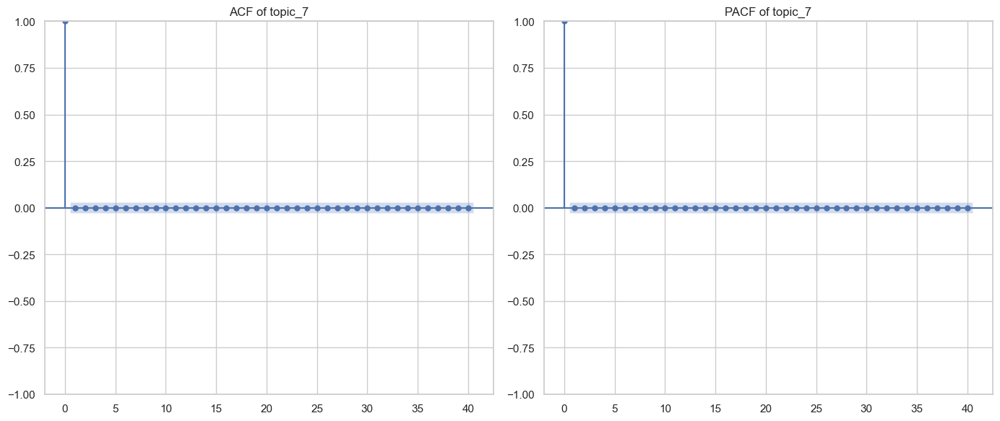

Processing column: topic_10


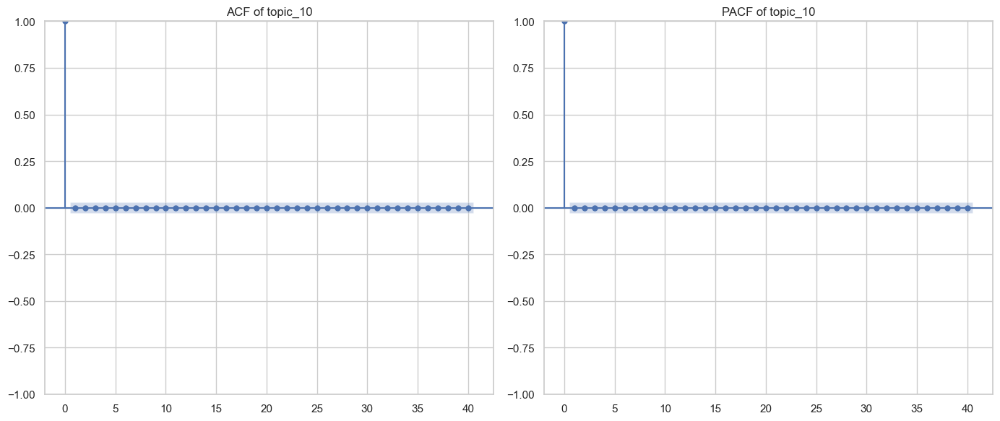

Processing column: topic_6


C:\Users\PRAGYA\anaconda3\Lib\site-packages\statsmodels\regression\linear_model.py:1489: ValueWarning: Matrix is singular. Using pinv.
  warnings.warn("Matrix is singular. Using pinv.", ValueWarning)


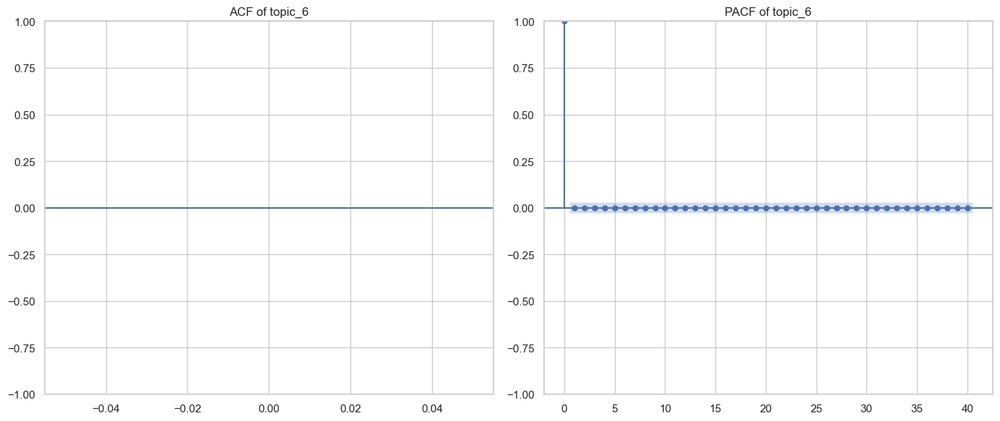

Processing column: topic_9


C:\Users\PRAGYA\anaconda3\Lib\site-packages\statsmodels\regression\linear_model.py:1489: ValueWarning: Matrix is singular. Using pinv.
  warnings.warn("Matrix is singular. Using pinv.", ValueWarning)


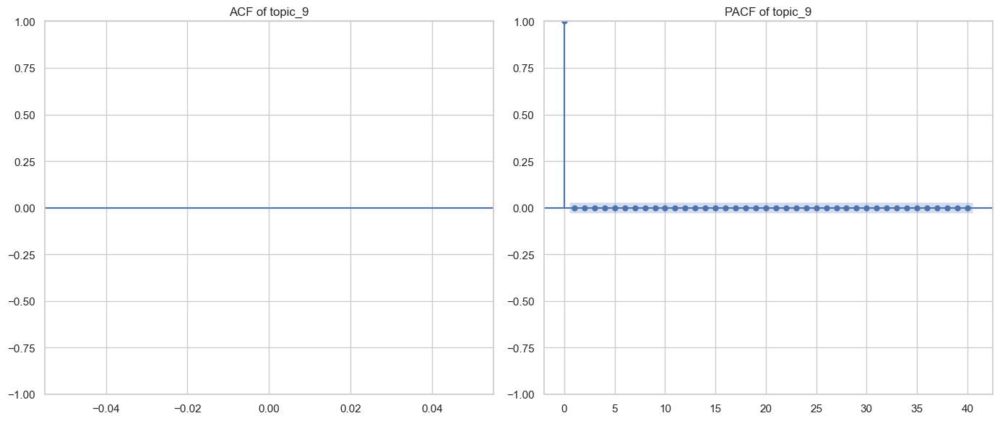

Processing column: topic_3


C:\Users\PRAGYA\anaconda3\Lib\site-packages\statsmodels\regression\linear_model.py:1489: ValueWarning: Matrix is singular. Using pinv.
  warnings.warn("Matrix is singular. Using pinv.", ValueWarning)


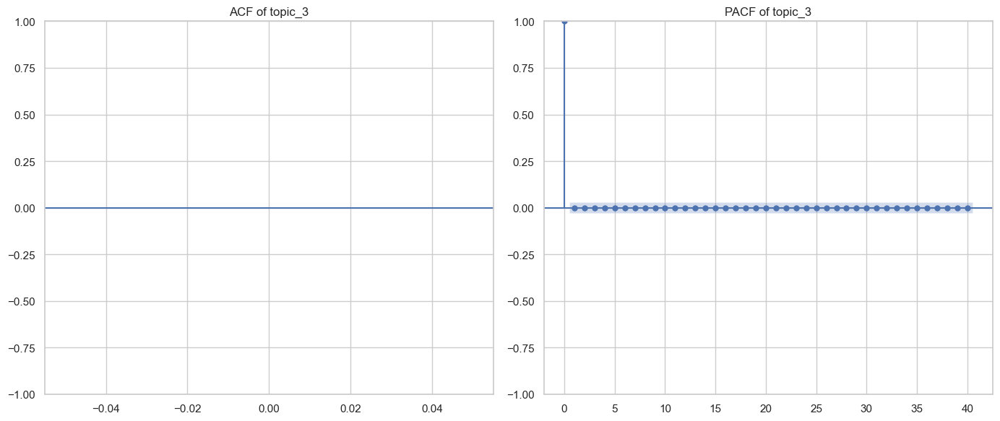

Processing column: topic_0


C:\Users\PRAGYA\anaconda3\Lib\site-packages\statsmodels\regression\linear_model.py:1489: ValueWarning: Matrix is singular. Using pinv.
  warnings.warn("Matrix is singular. Using pinv.", ValueWarning)


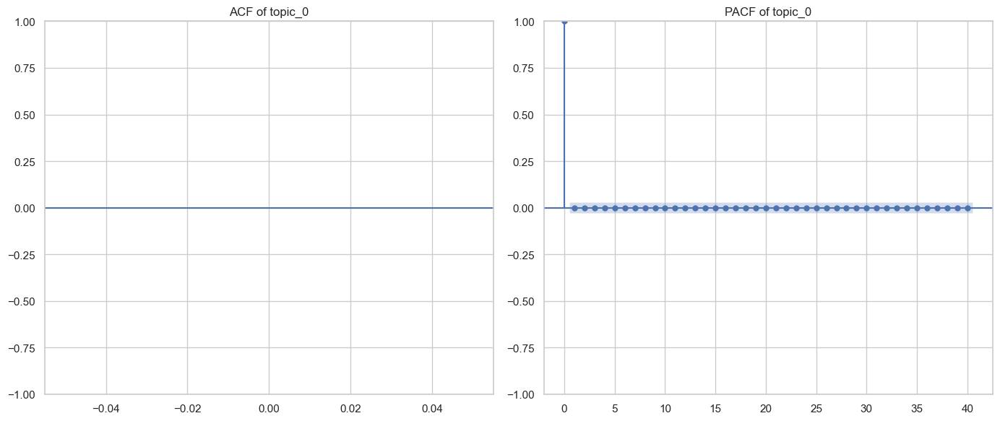

Processing column: CARDINAL_one


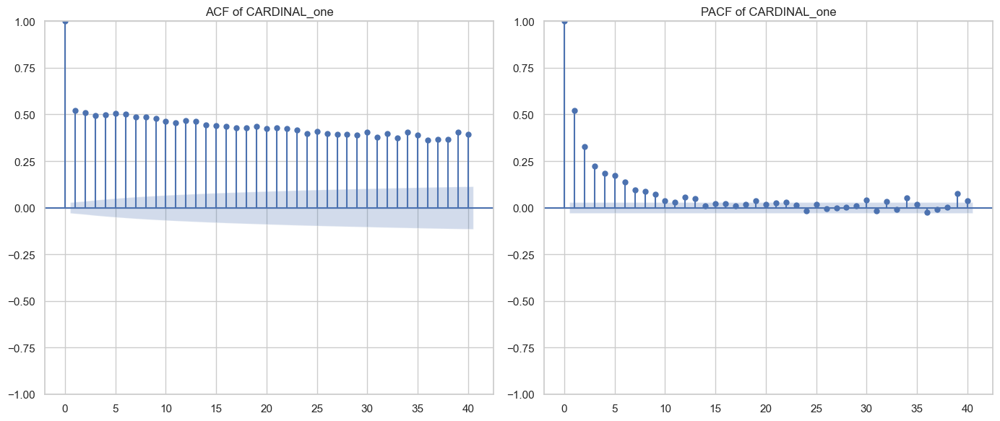

Processing column: CARDINAL_two


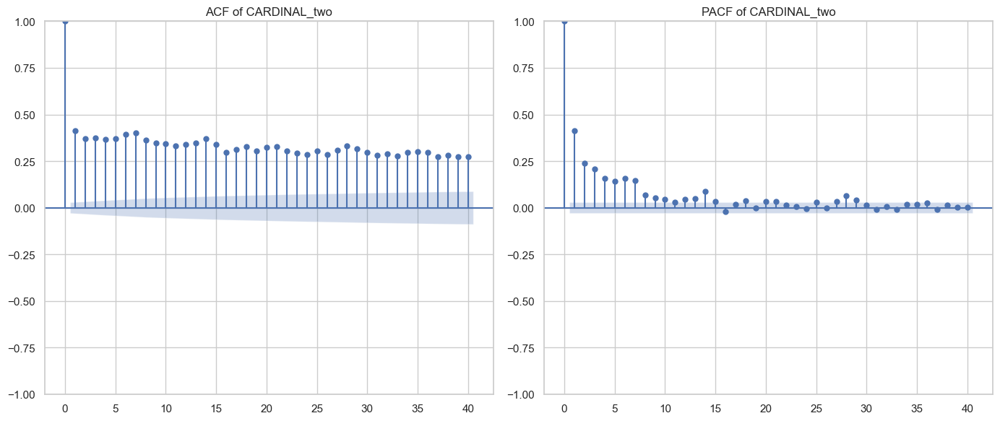

Processing column: CARDINAL_million


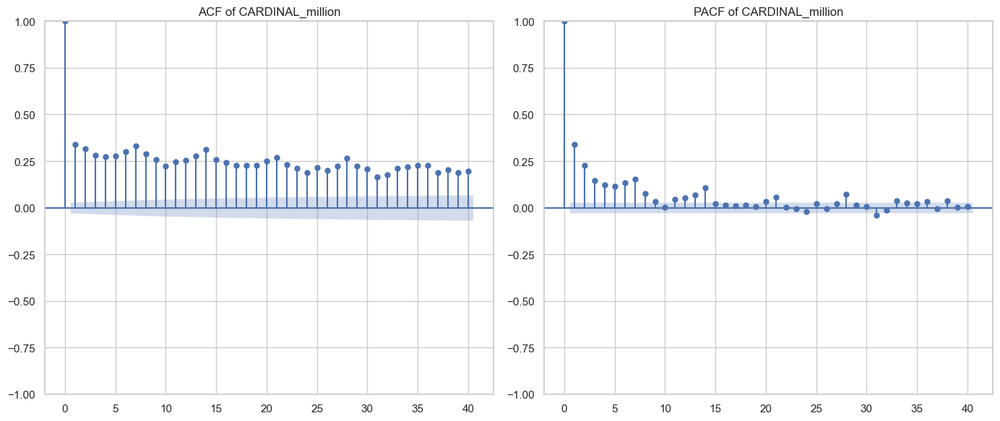

Processing column: CARDINAL_three


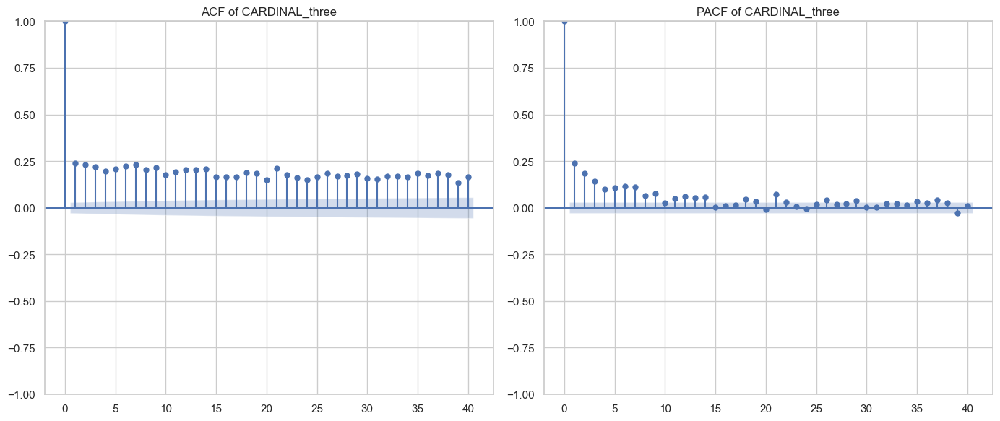

Processing column: CARDINAL_six


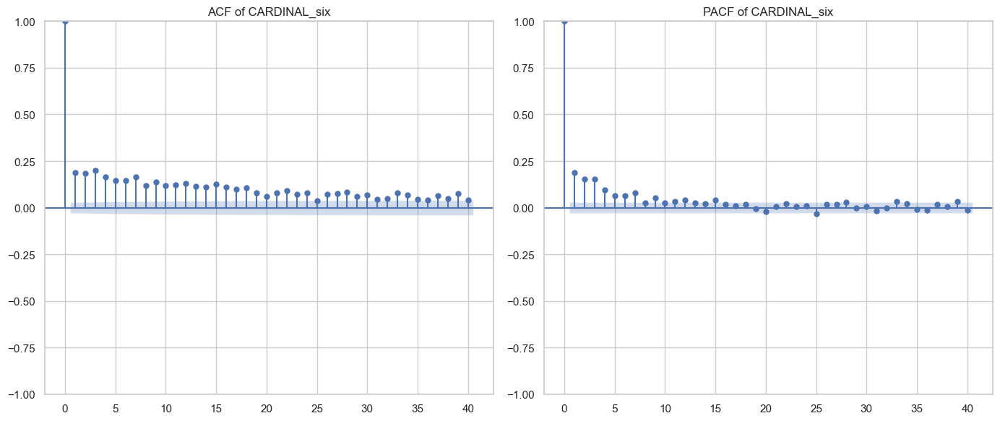

Processing column: EVENT_vietnam


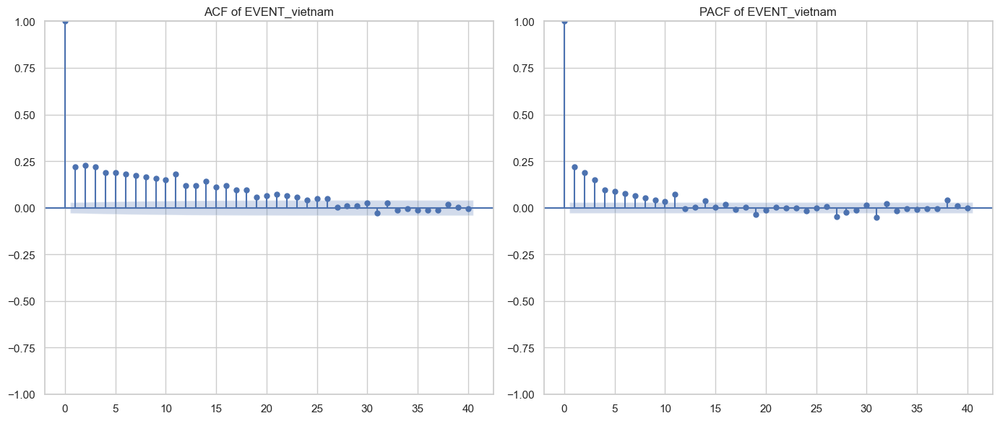

Processing column: EVENT_wwii


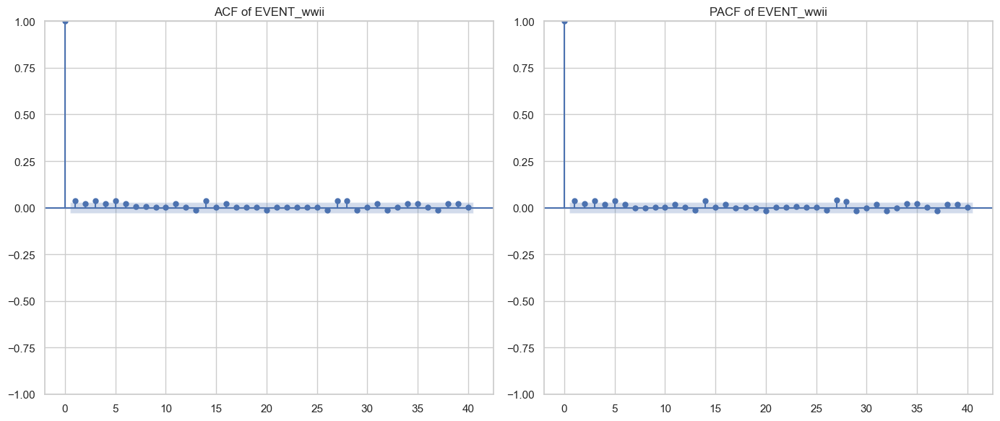

Processing column: EVENT_super bowl


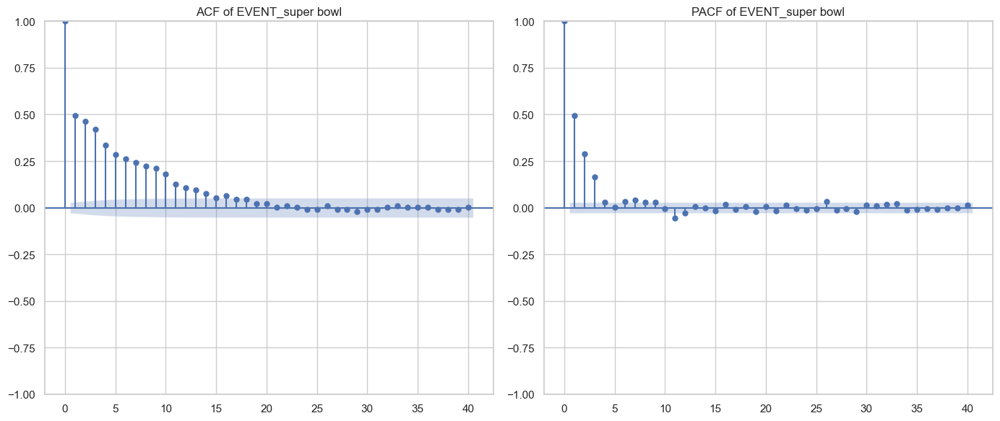

Processing column: EVENT_hurricane katrina


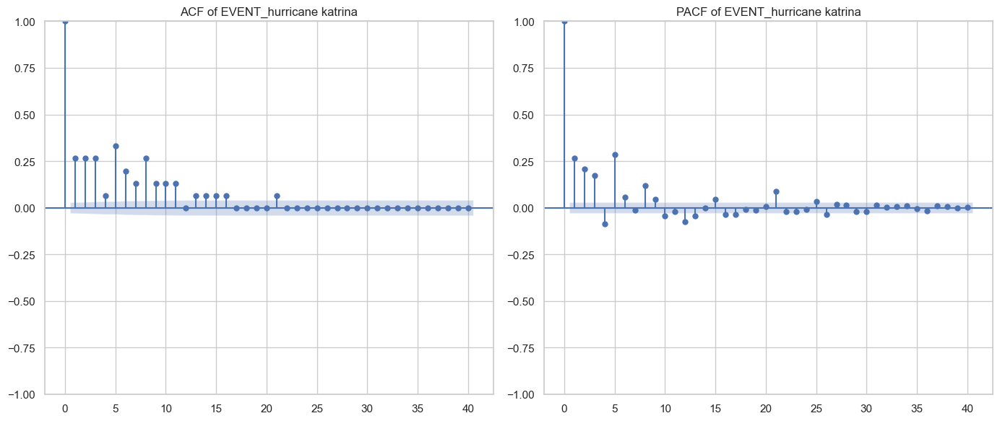

Processing column: EVENT_iraq war


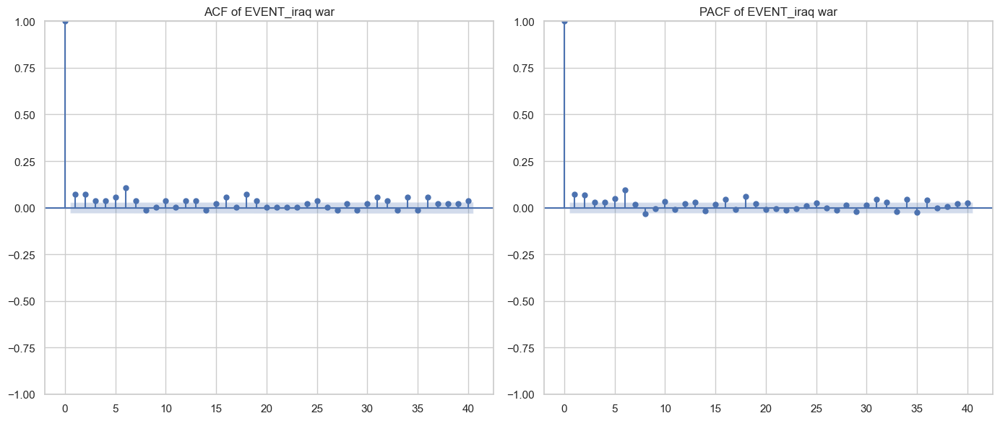

Processing column: FAC_guantanamo


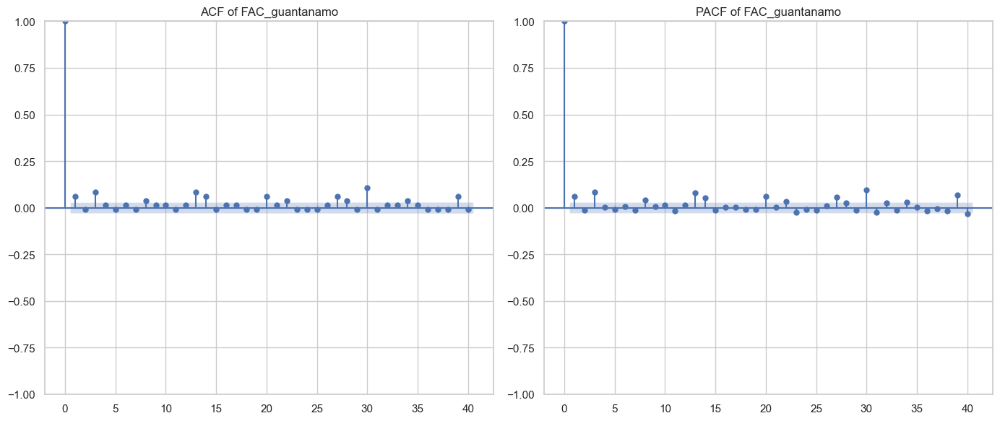

Processing column: FAC_uva


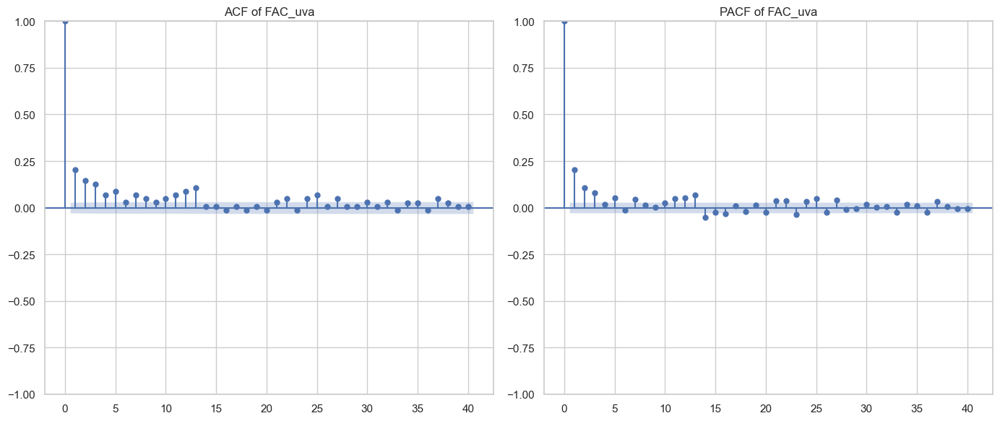

Processing column: FAC_notre dame


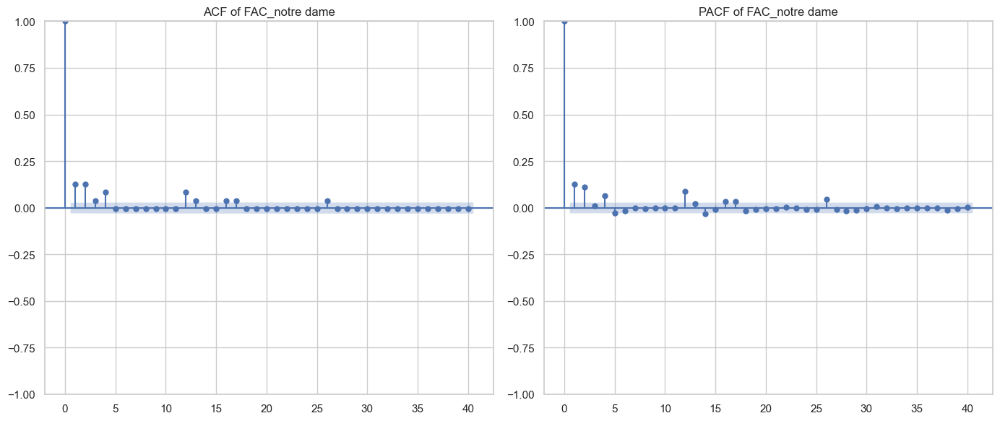

Processing column: FAC_north london


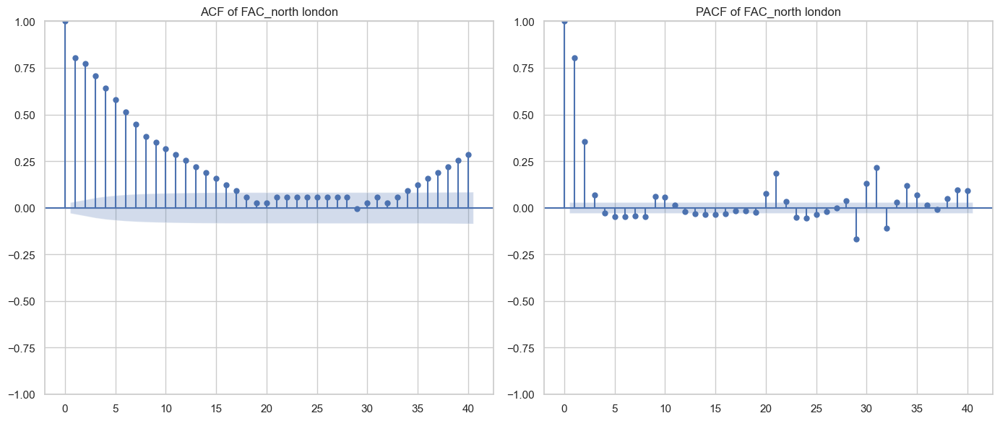

Processing column: FAC_nikki haley


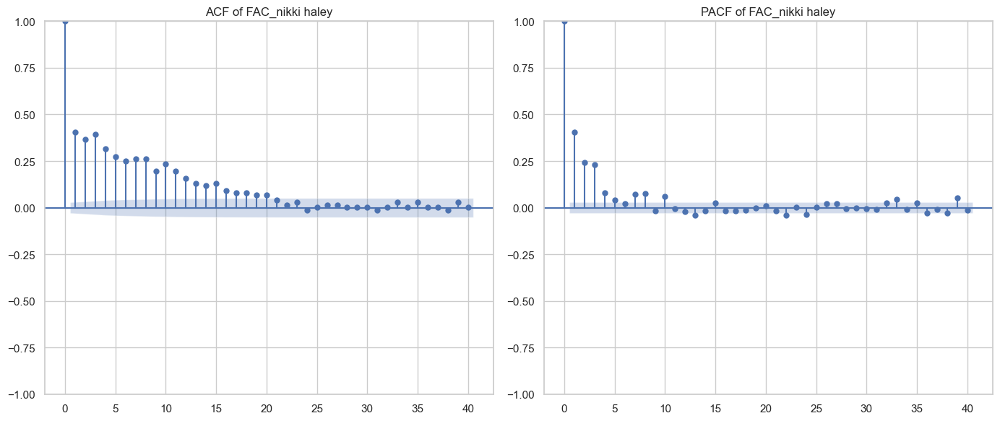

Processing column: GPE_london


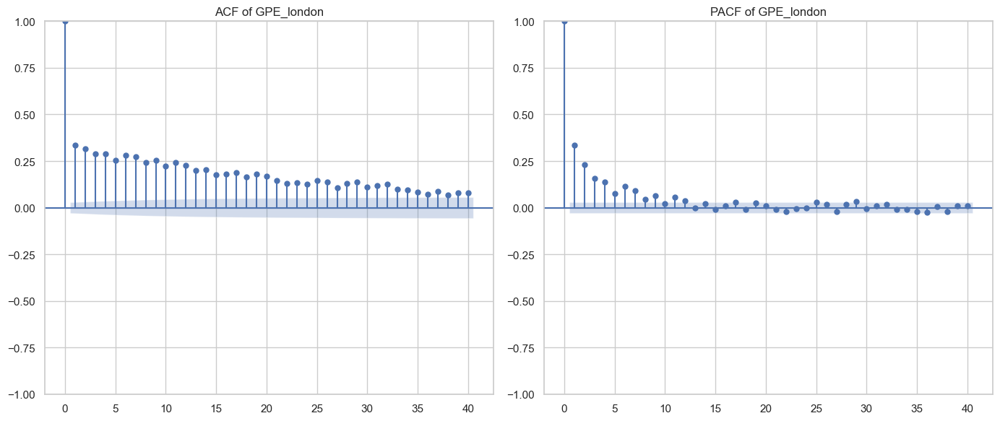

Processing column: GPE_russia


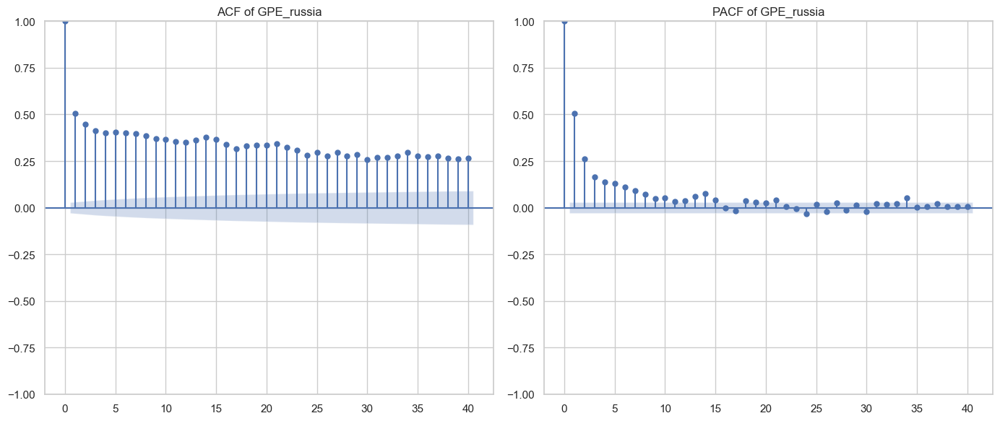

Processing column: GPE_america


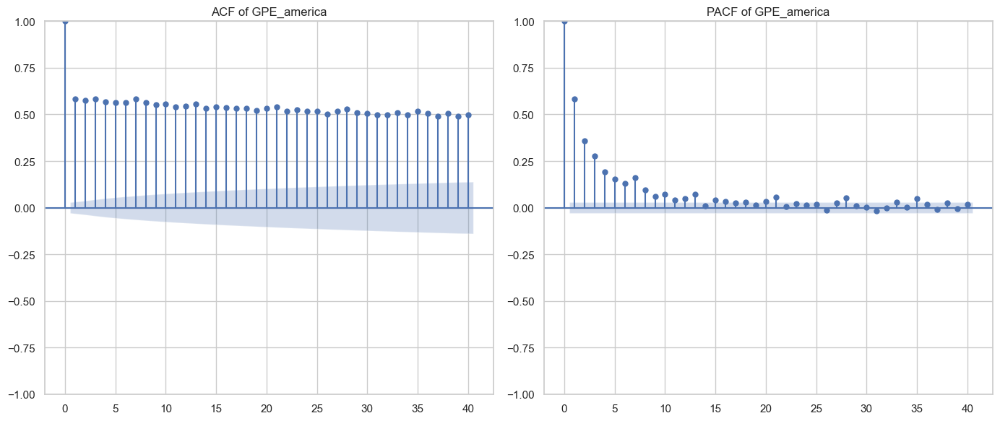

Processing column: GPE_california


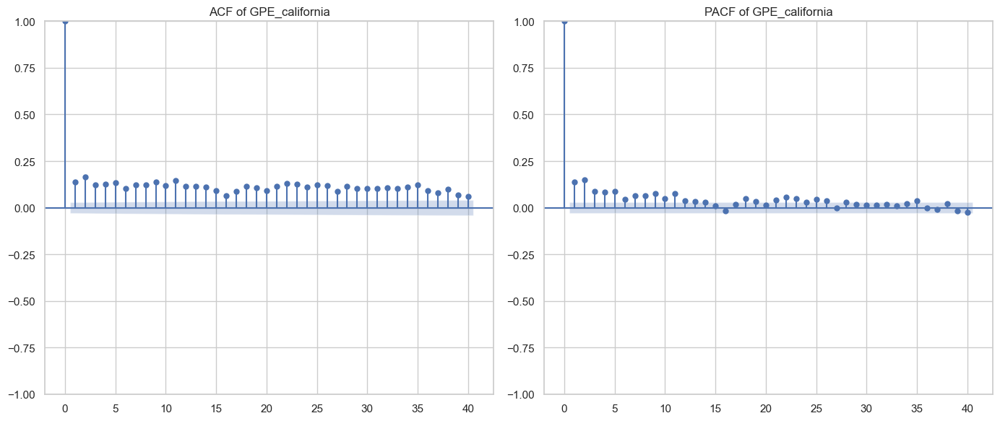

Processing column: GPE_china


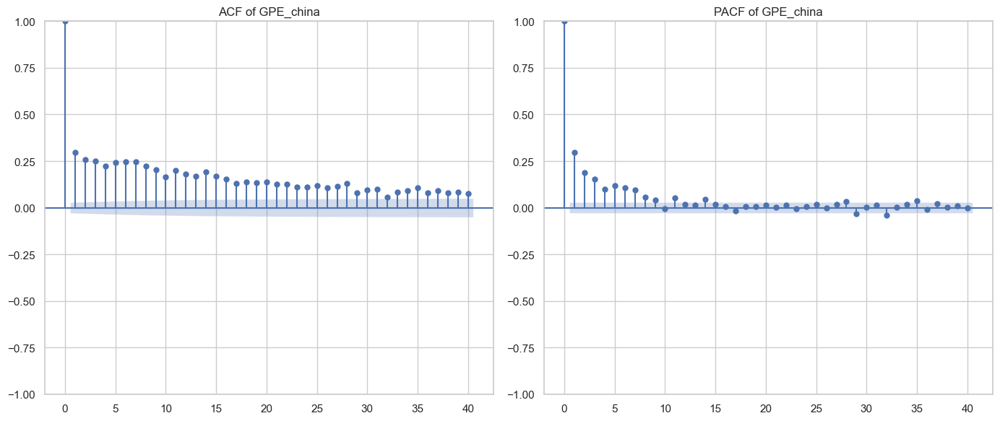

Processing column: LAW_rico


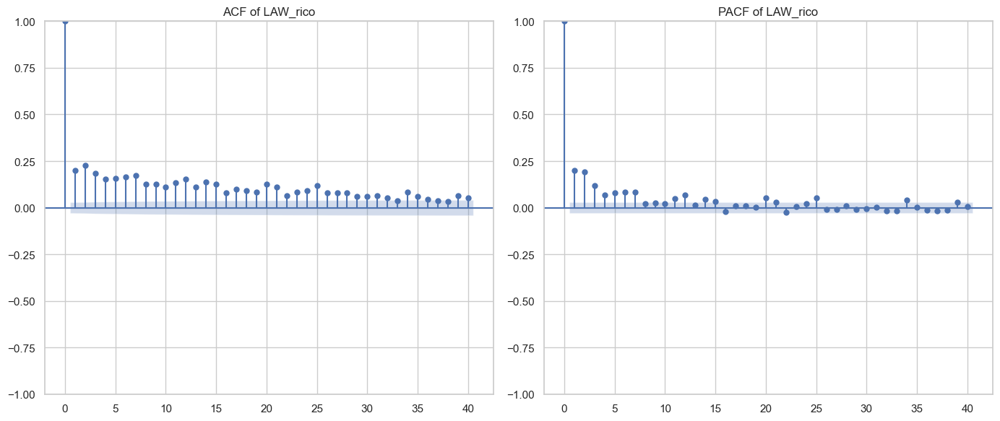

Processing column: LAW_camilla wear


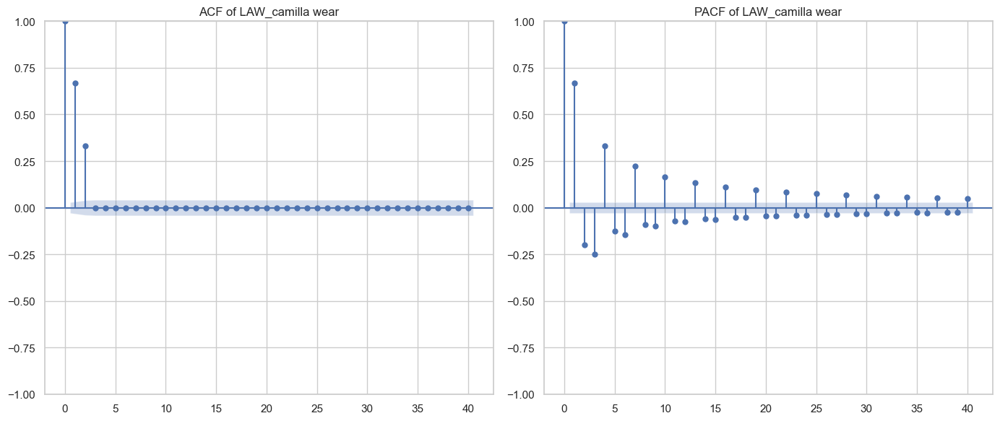

Processing column: LAW_crown new


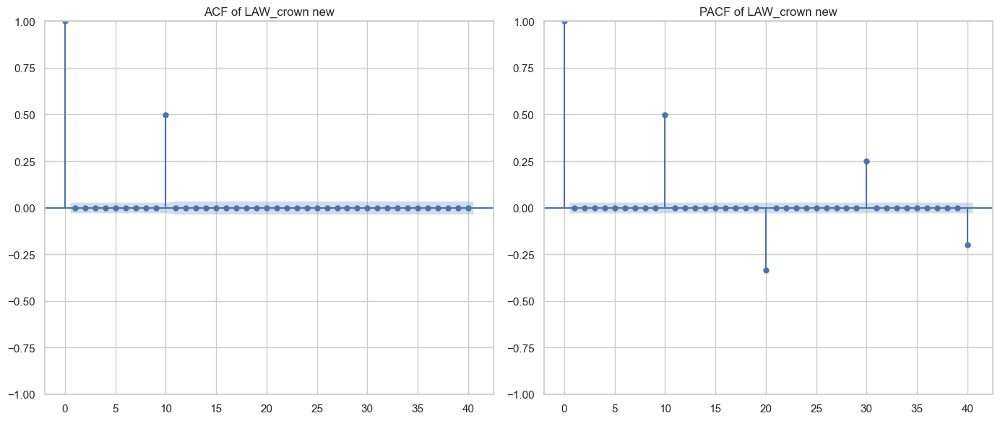

Processing column: LAW_superfund


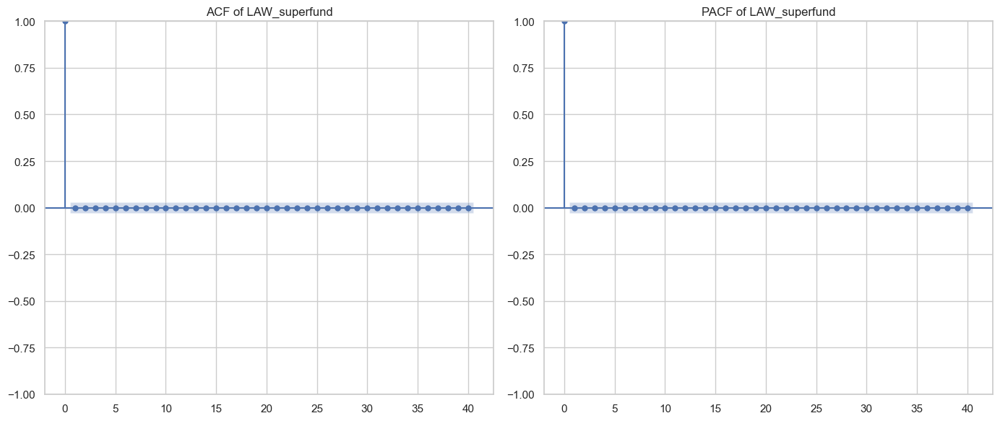

Processing column: LAW_west ham


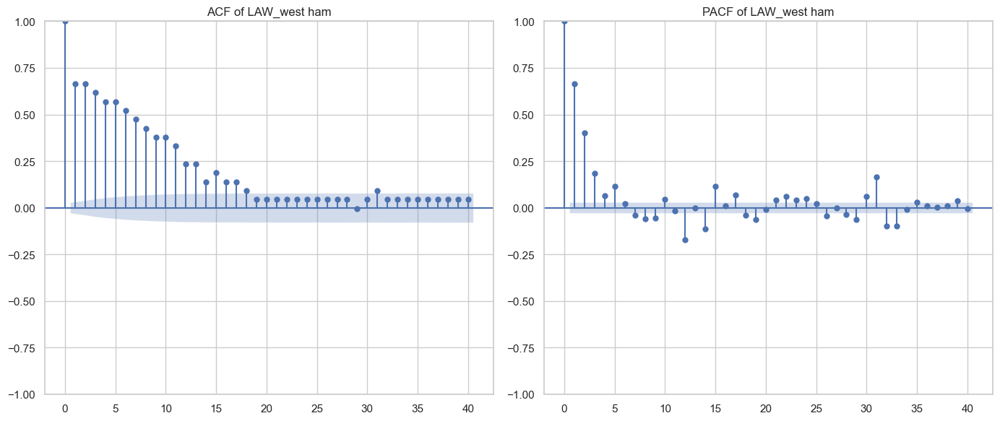

Processing column: LOC_europe


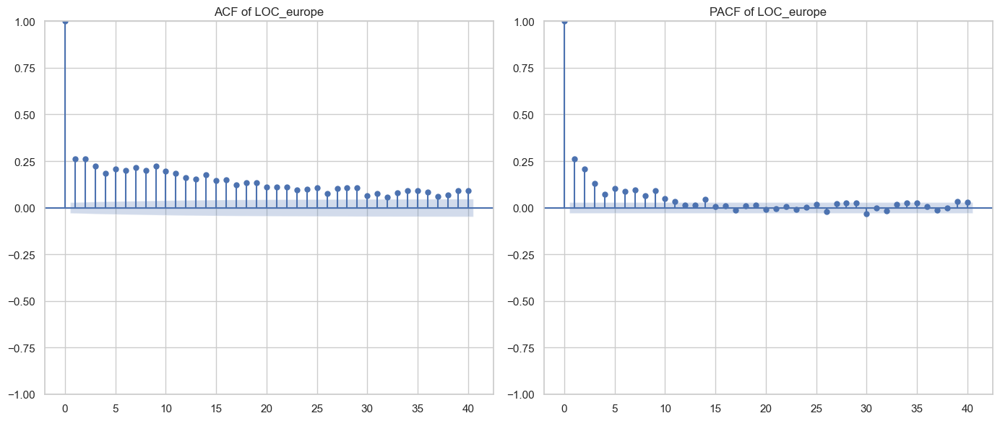

Processing column: LOC_middle east


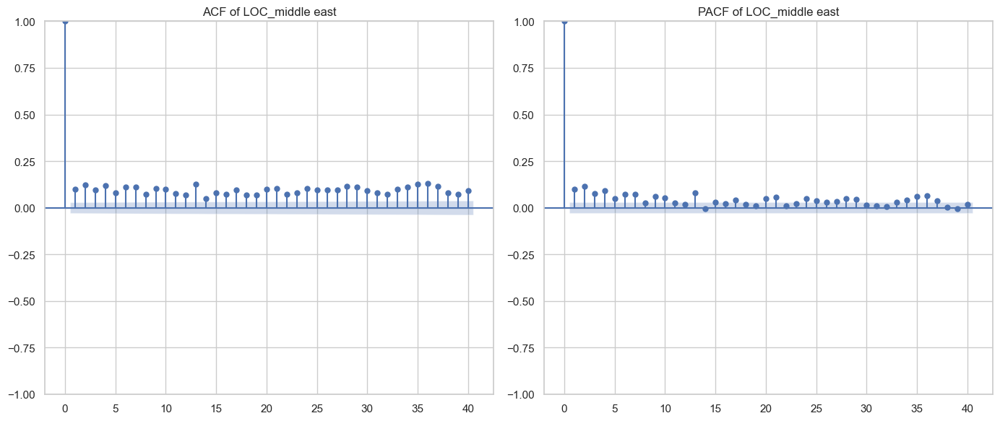

Processing column: LOC_africa


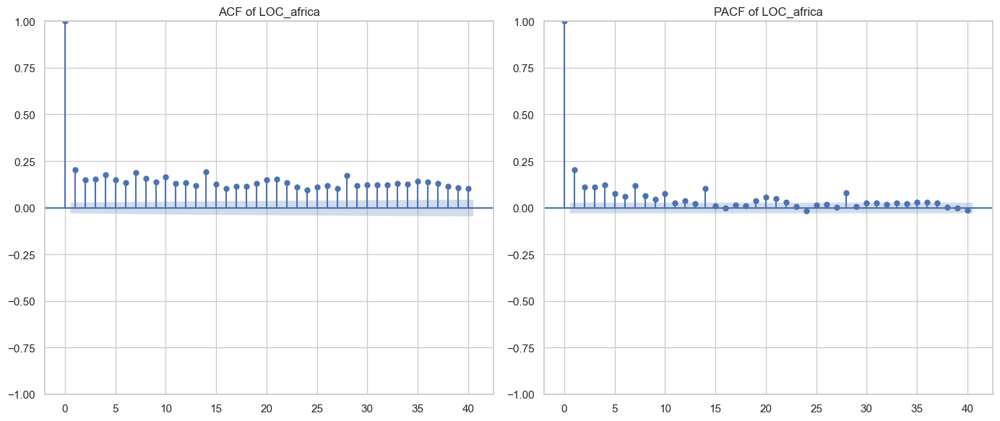

Processing column: LOC_caribbean


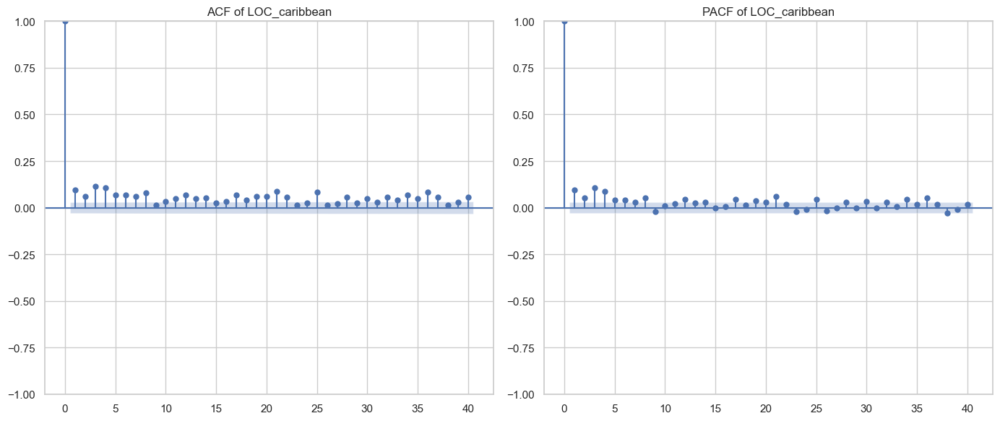

Processing column: LOC_asia


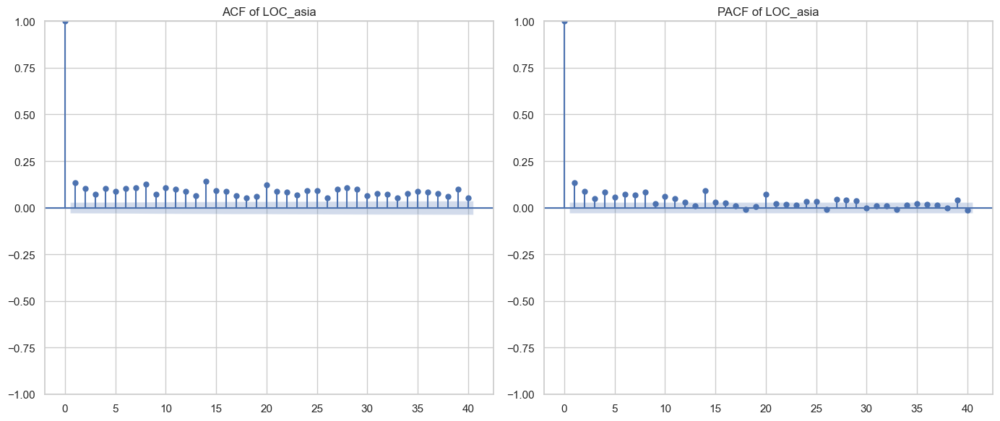

Processing column: MONEY_mike penny


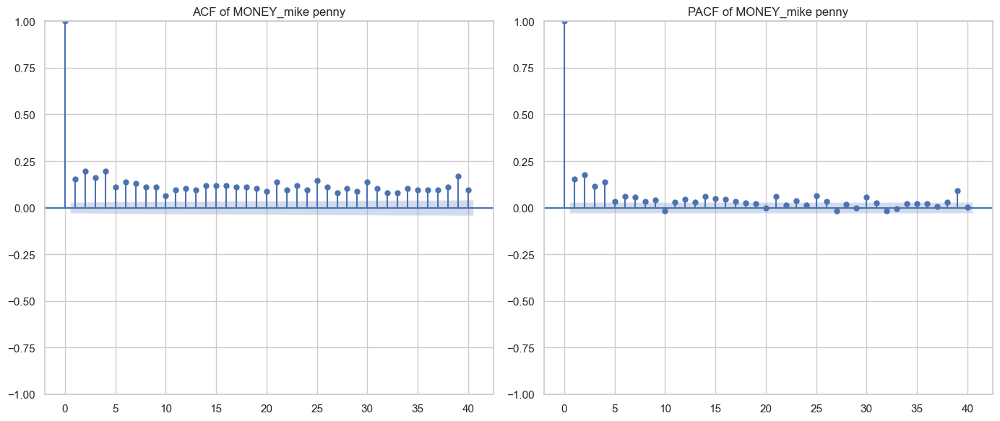

Processing column: MONEY_million dollar


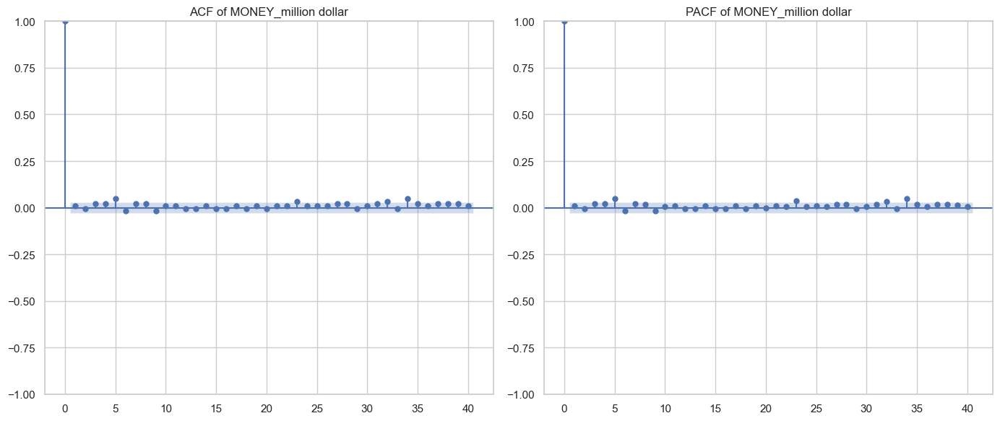

Processing column: MONEY_billion dollar


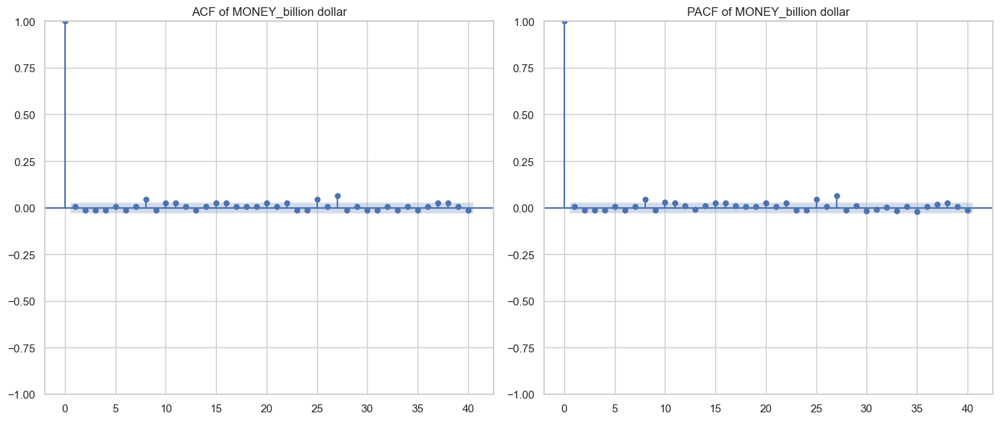

Processing column: MONEY_thousand dollar


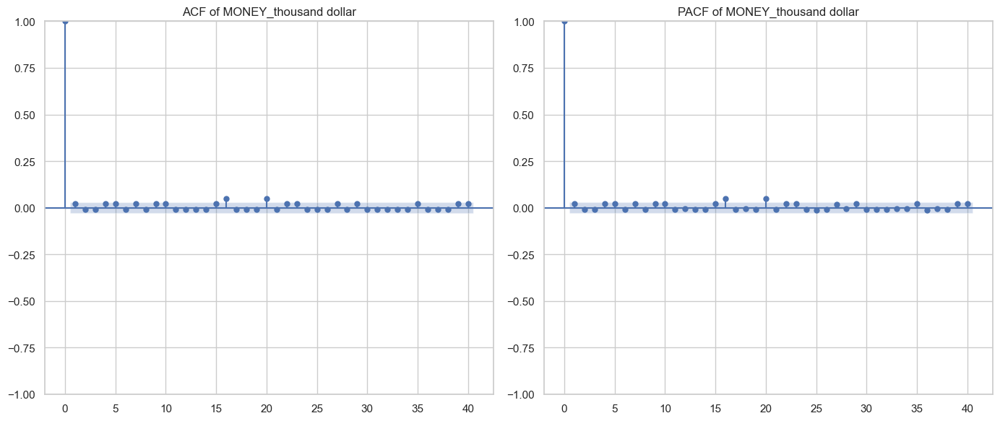

Processing column: MONEY_every penny


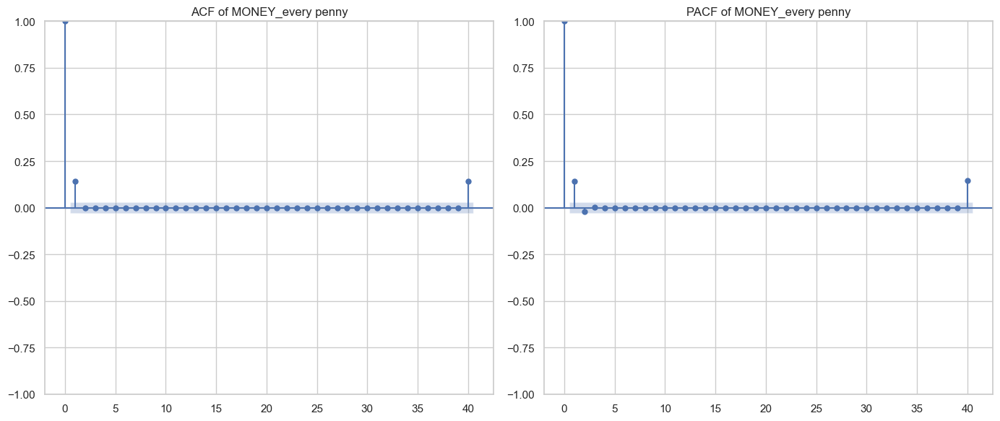

Processing column: NORP_american


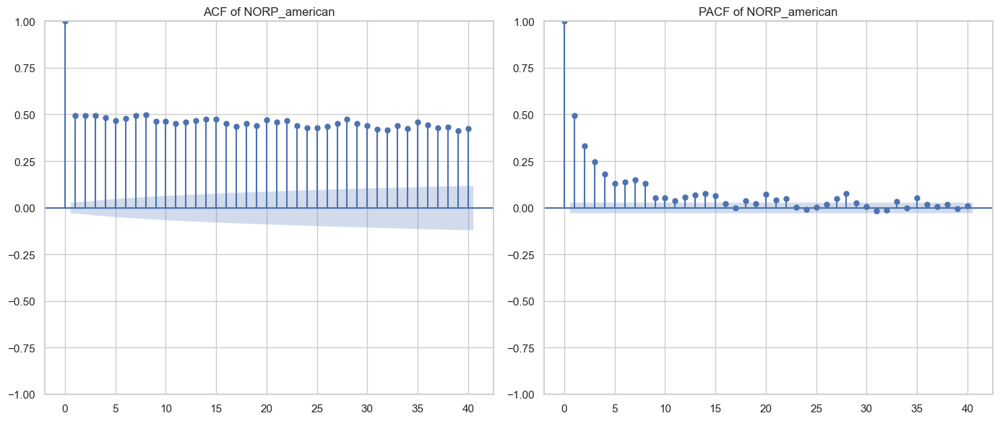

Processing column: NORP_republican


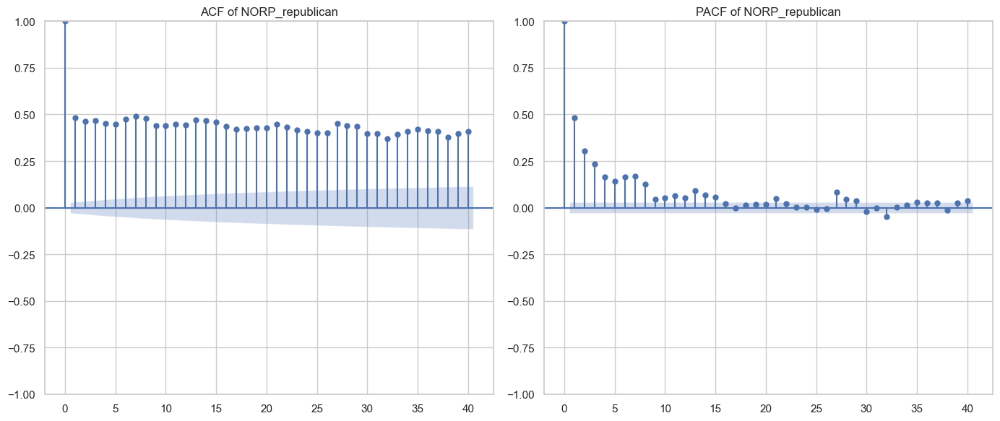

Processing column: NORP_democrat


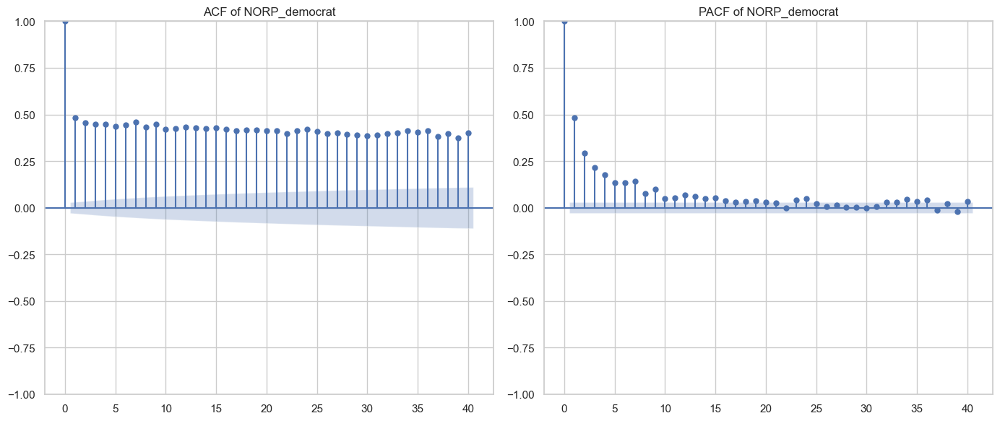

Processing column: NORP_russian


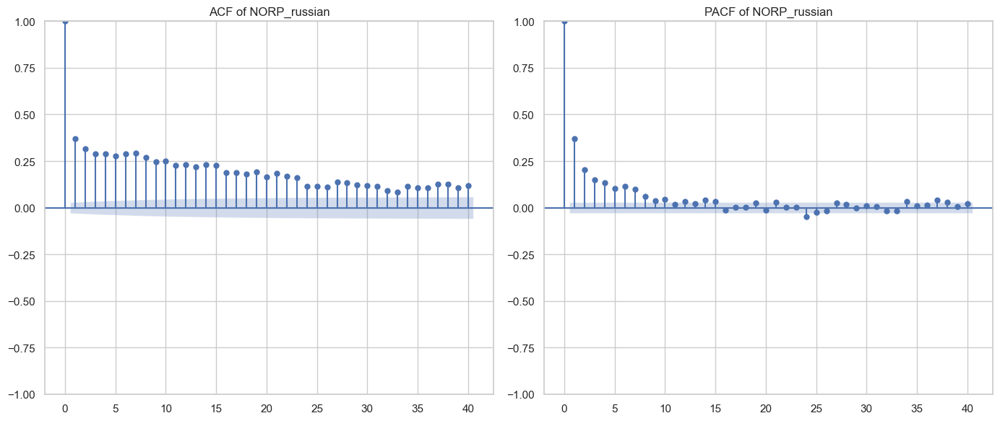

Processing column: NORP_muslim


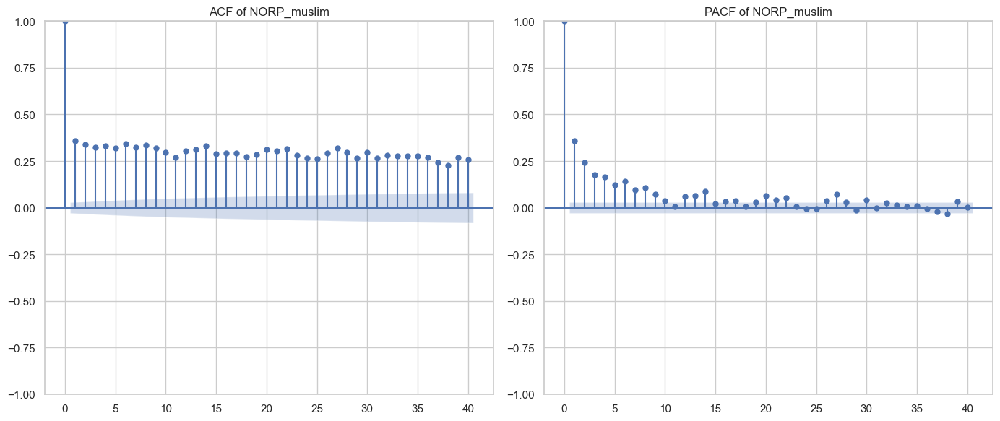

Processing column: ORDINAL_first


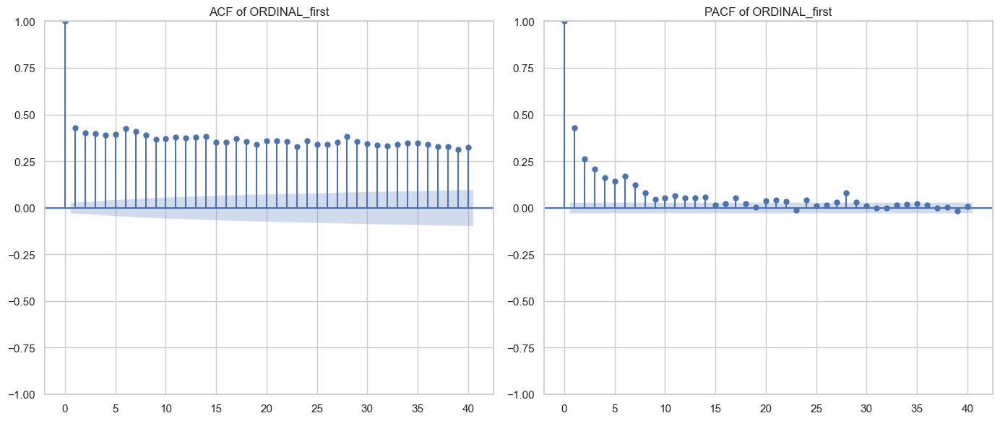

Processing column: ORDINAL_second


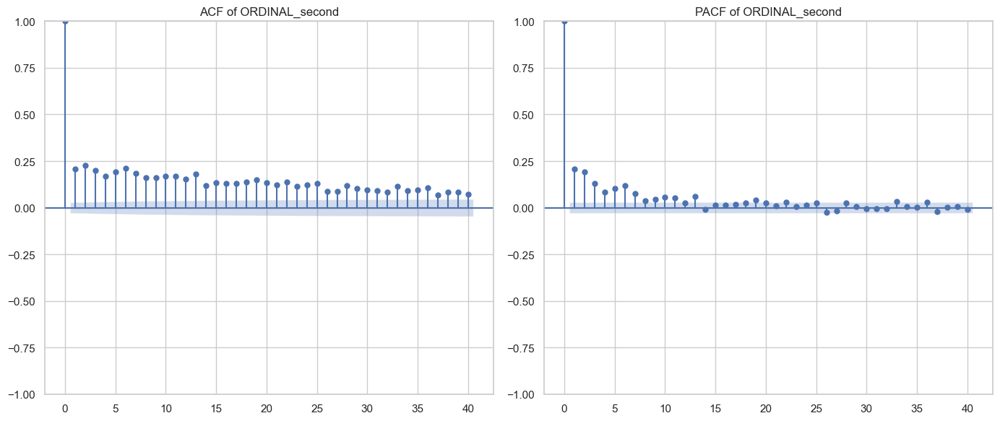

Processing column: ORDINAL_third


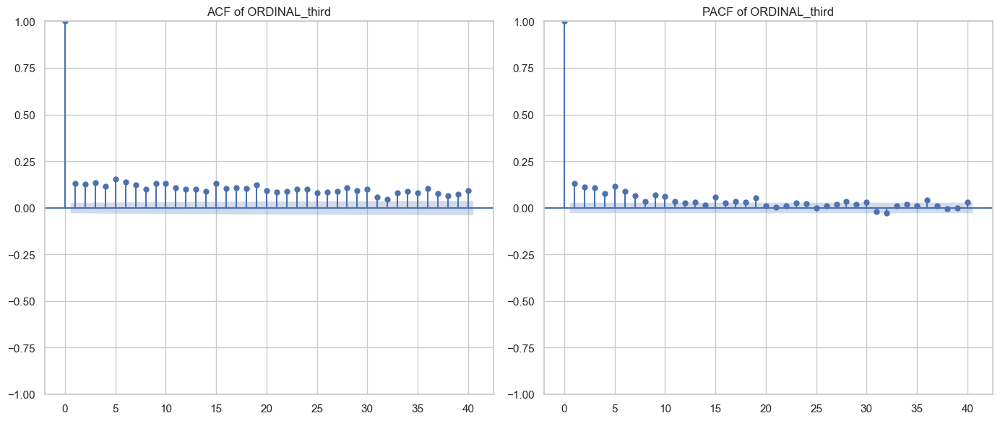

Processing column: ORDINAL_fourth


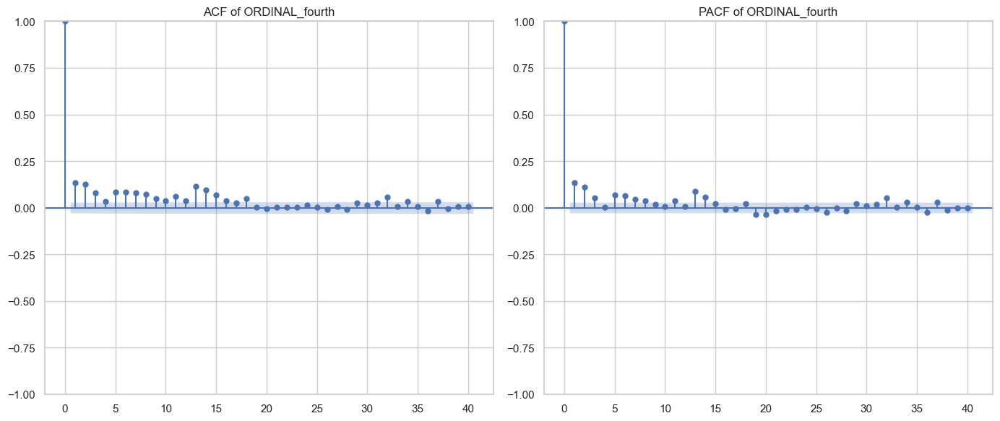

Processing column: ORDINAL_fifth


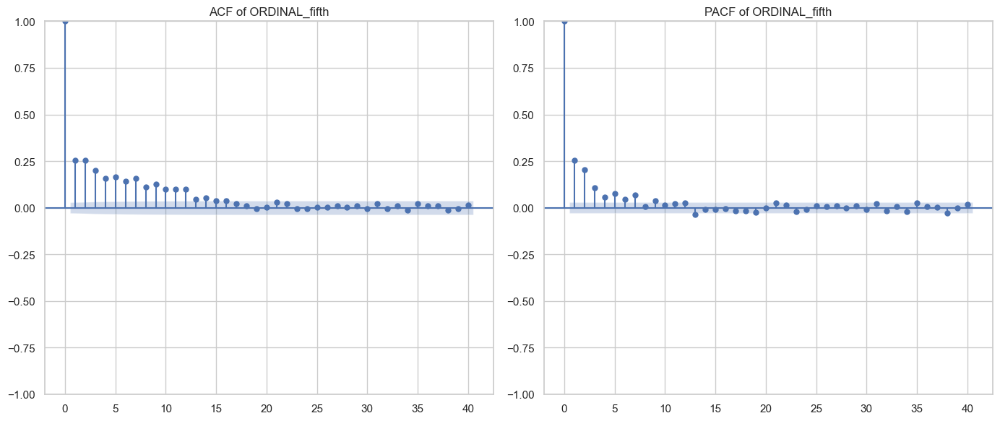

Processing column: ORG_gop


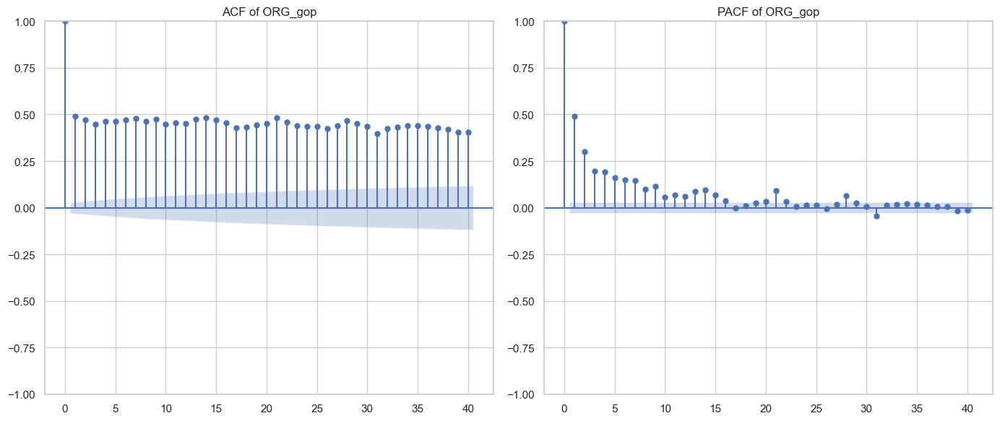

Processing column: ORG_senate


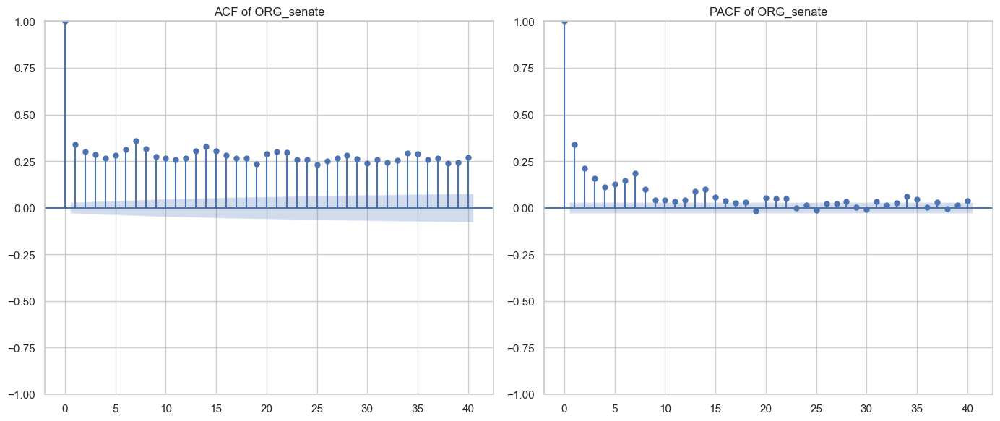

Processing column: ORG_white house


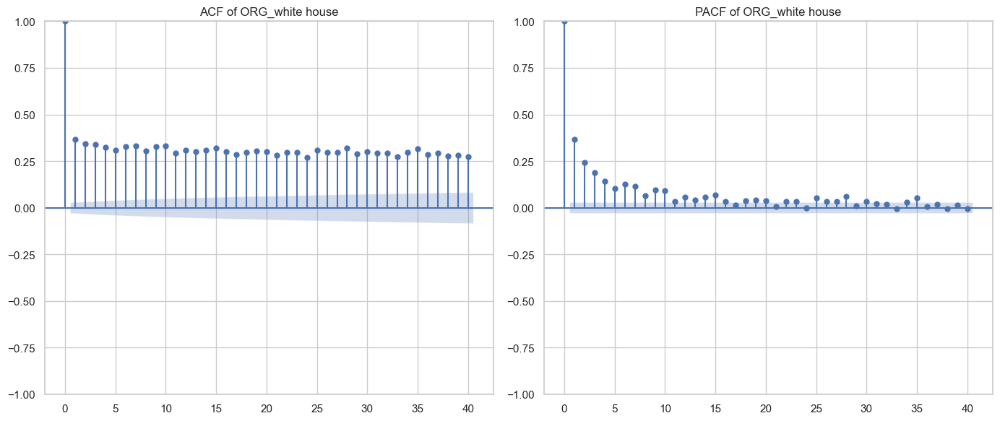

Processing column: ORG_congress


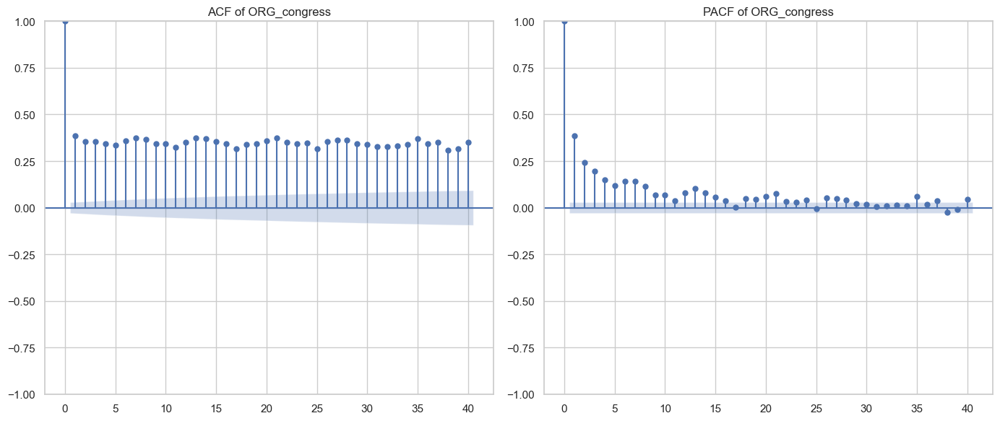

Processing column: ORG_supreme court


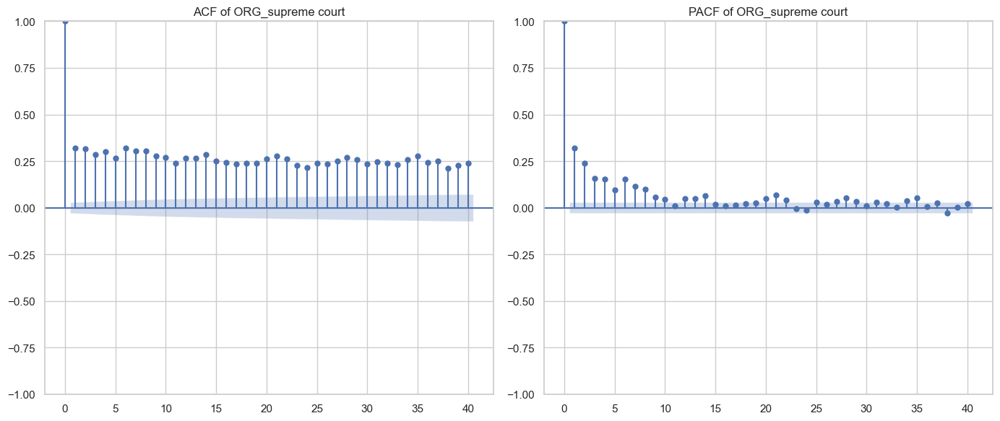

Processing column: PERCENT_one percent


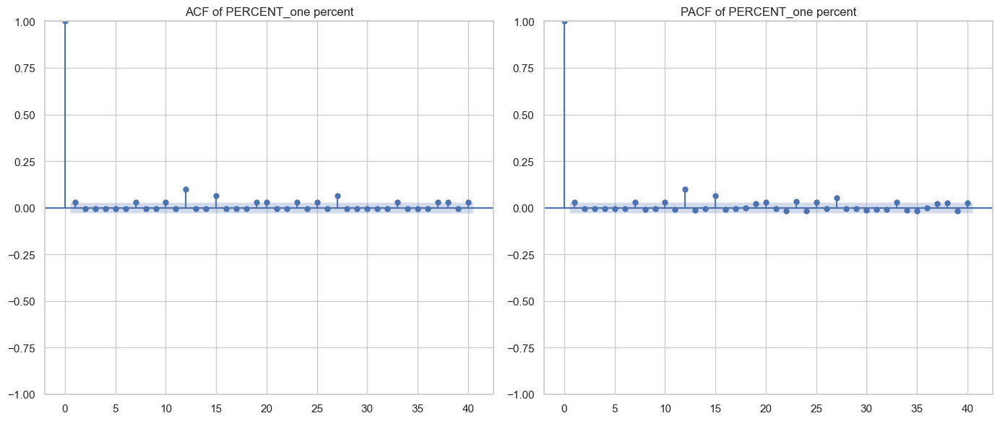

Processing column: PERCENT_five percent


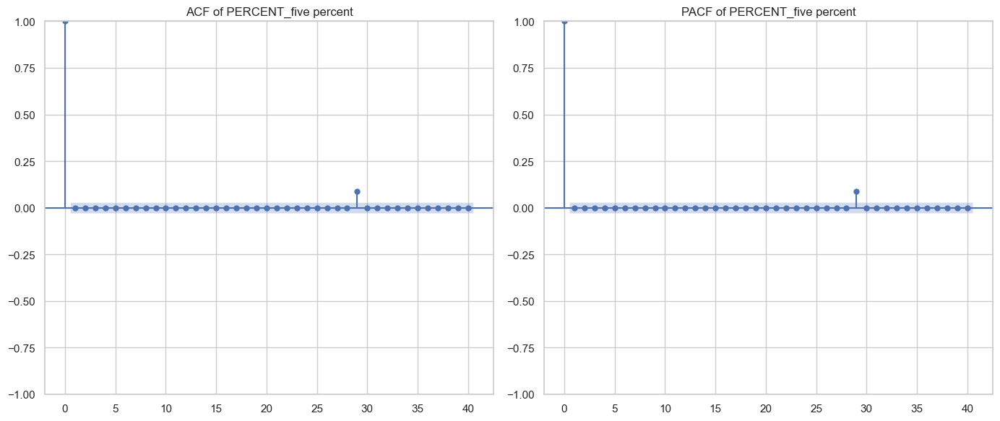

Processing column: PERCENT_eight percent


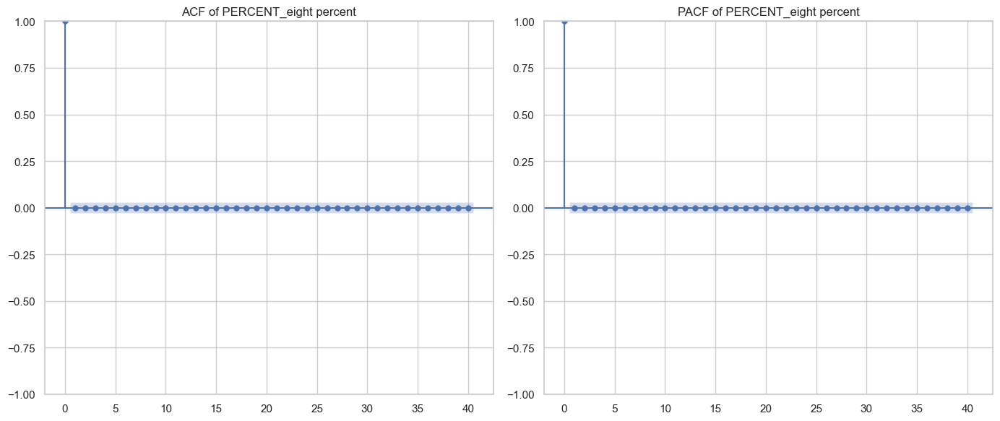

Processing column: PERCENT_three percent


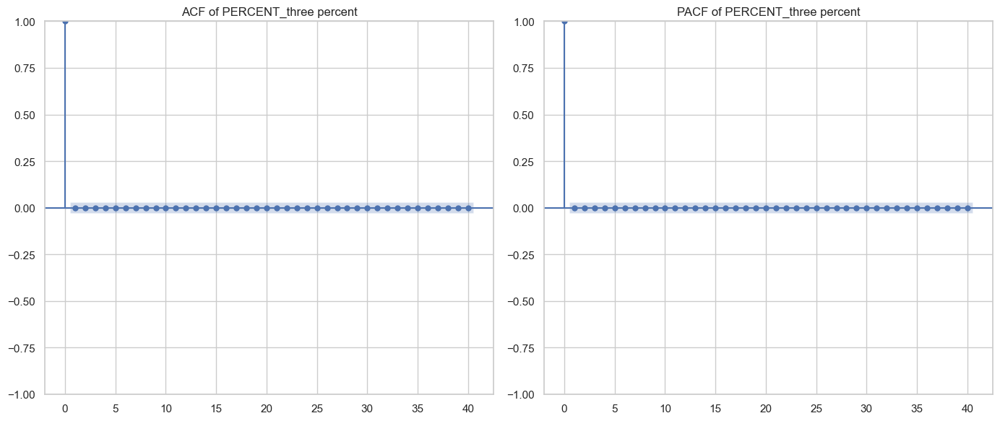

Processing column: PERCENT_four percent


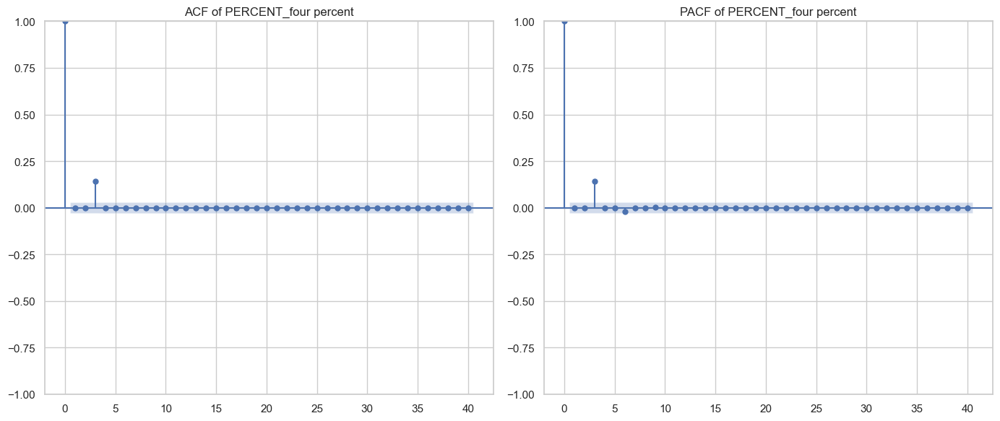

Processing column: PERSON_donald trump


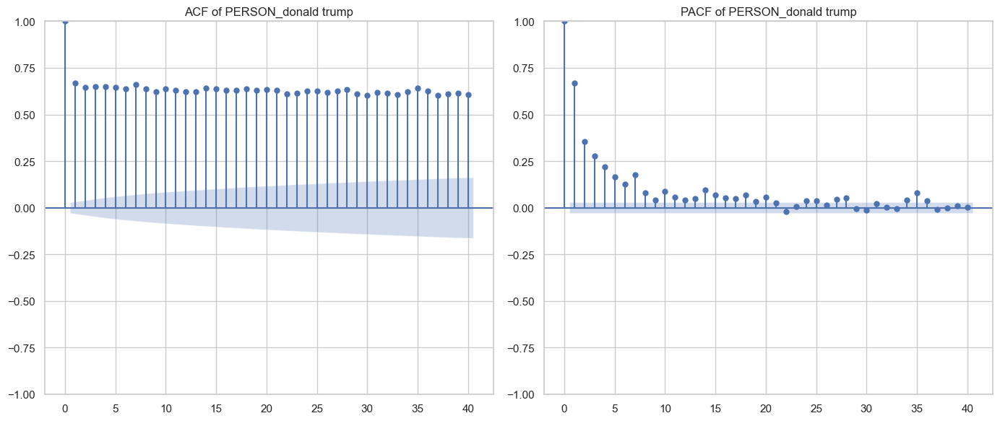

Processing column: PERSON_hillary clinton


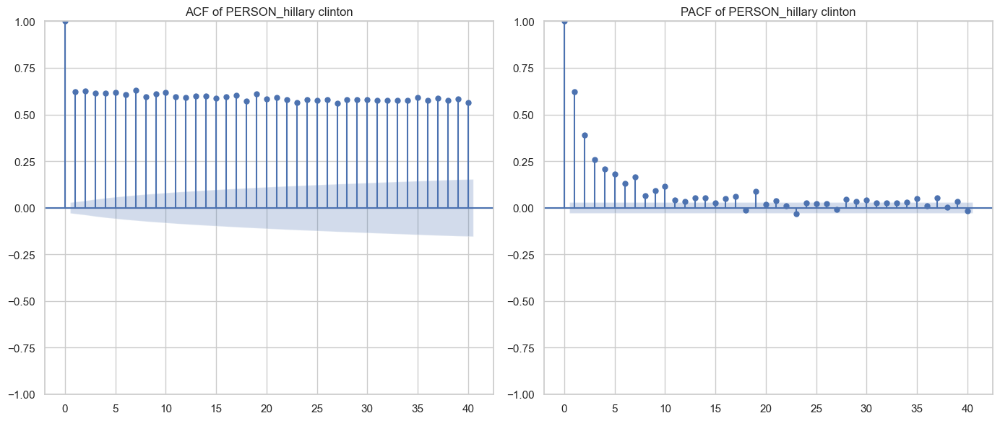

Processing column: PERSON_clinton


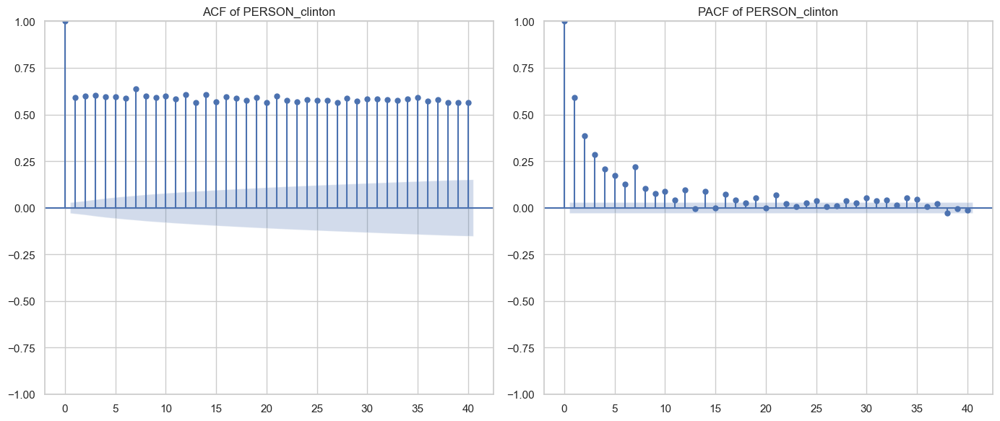

Processing column: PERSON_bernie


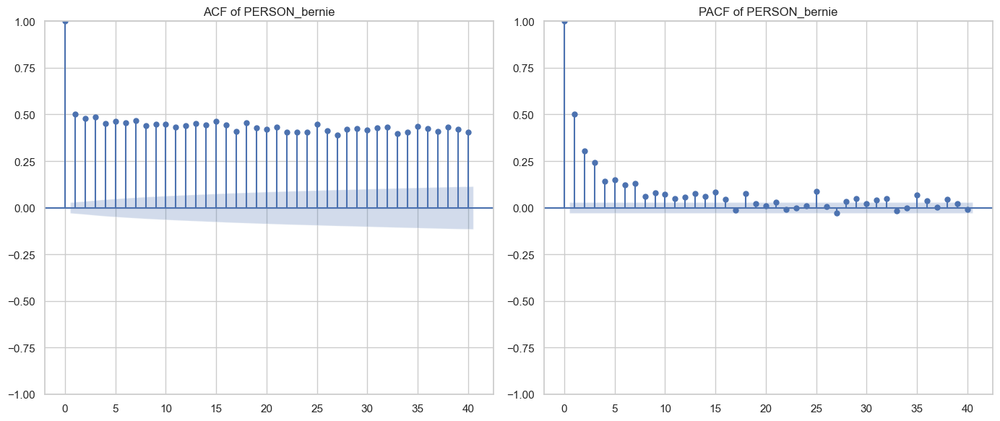

Processing column: PERSON_putin


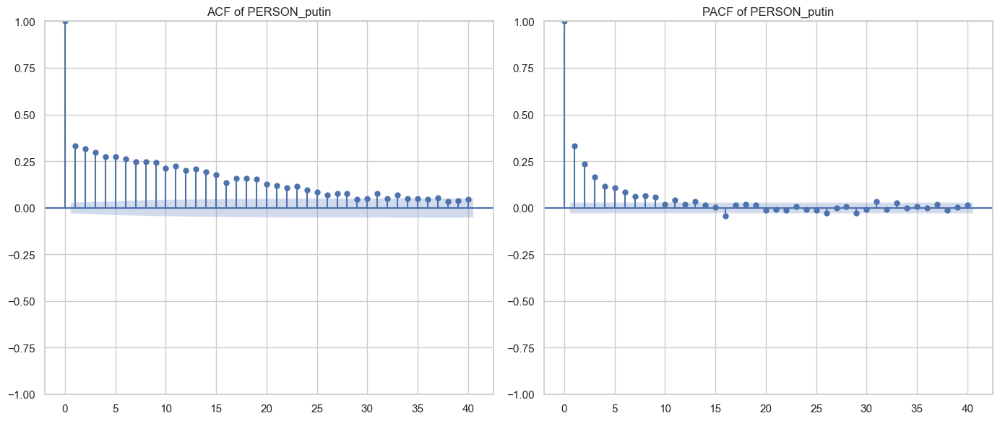

Processing column: PRODUCT_cole


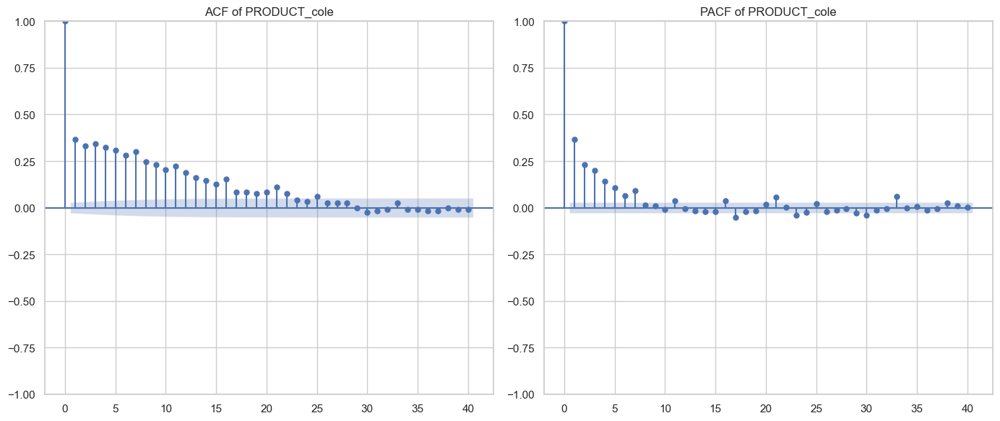

Processing column: PRODUCT_harry


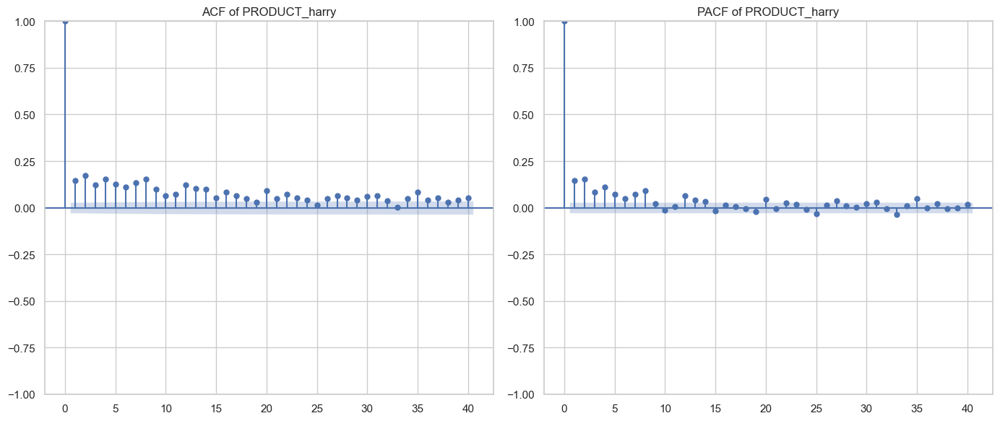

Processing column: PRODUCT_bmw


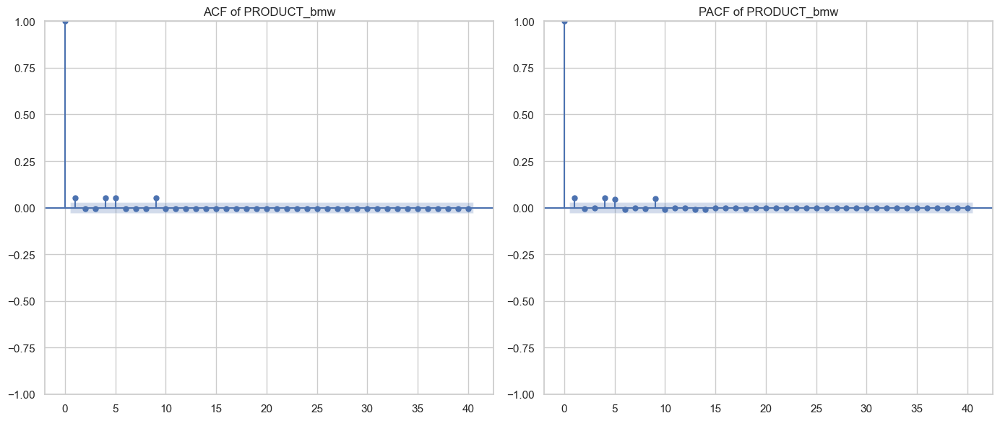

Processing column: PRODUCT_datesjustin


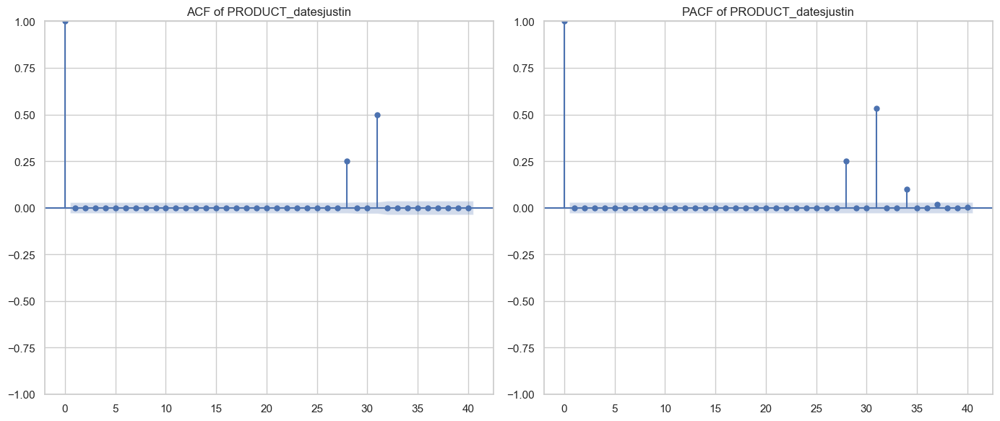

Processing column: PRODUCT_kalanick


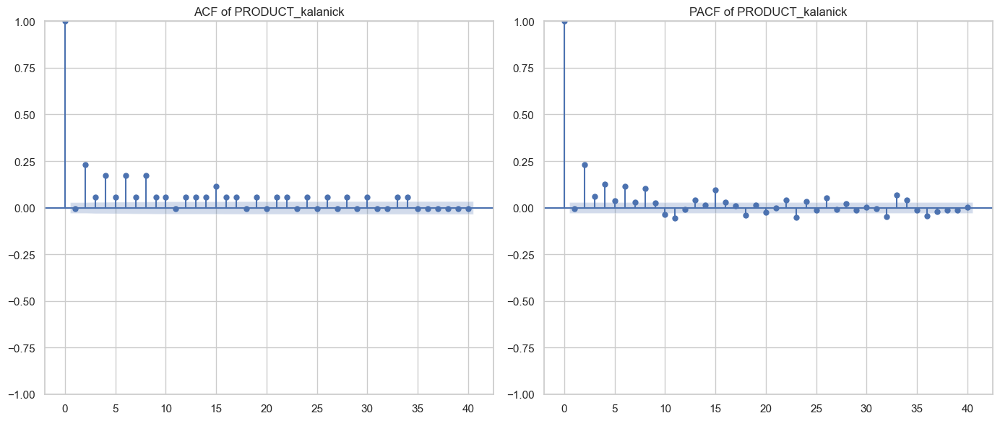

Processing column: QUANTITY_thousand mile


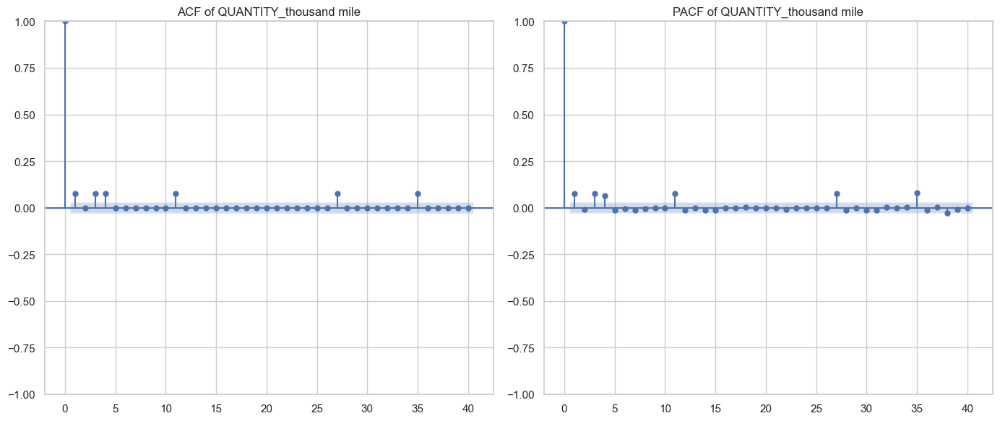

Processing column: QUANTITY_gallon


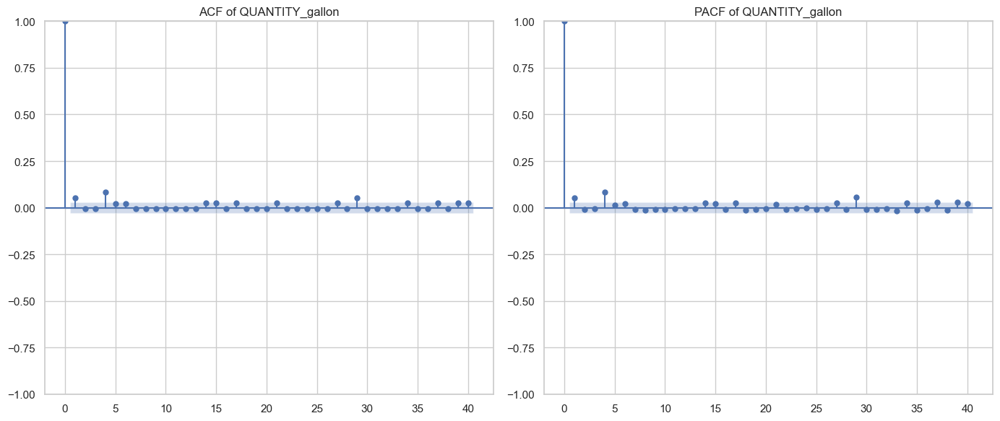

Processing column: QUANTITY_hundred mile


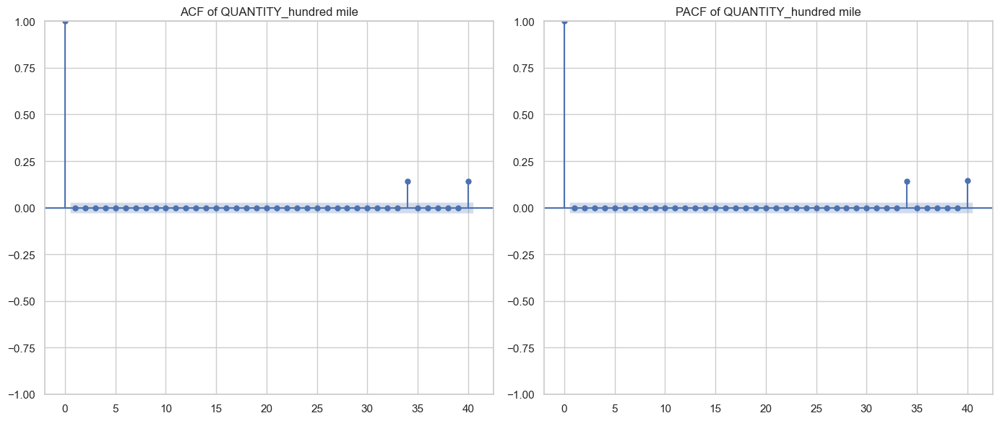

Processing column: QUANTITY_mile


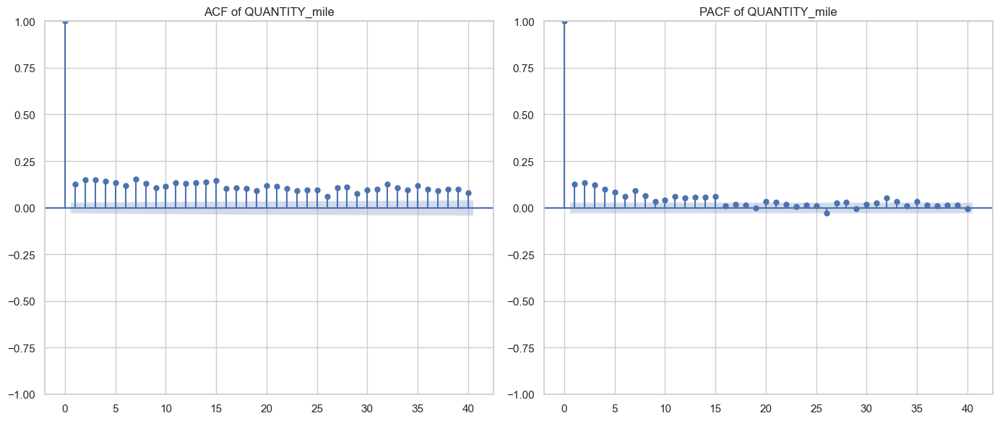

Processing column: QUANTITY_two mile


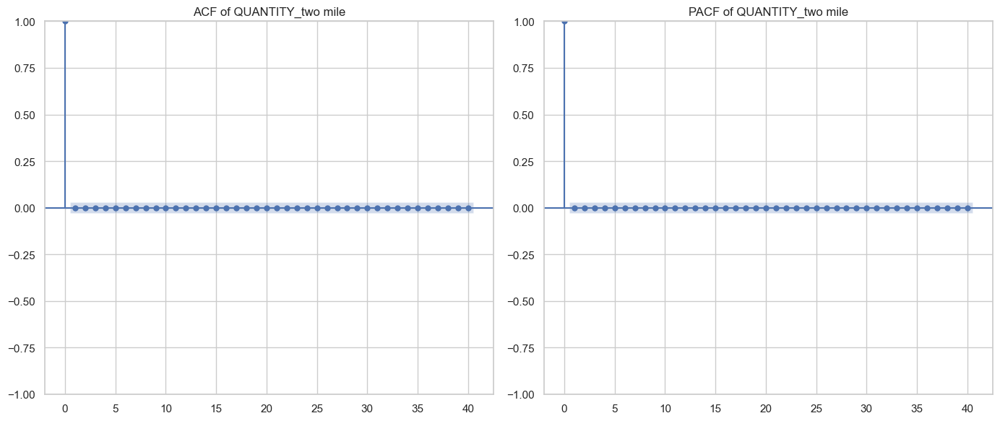

Processing column: TIME_morning


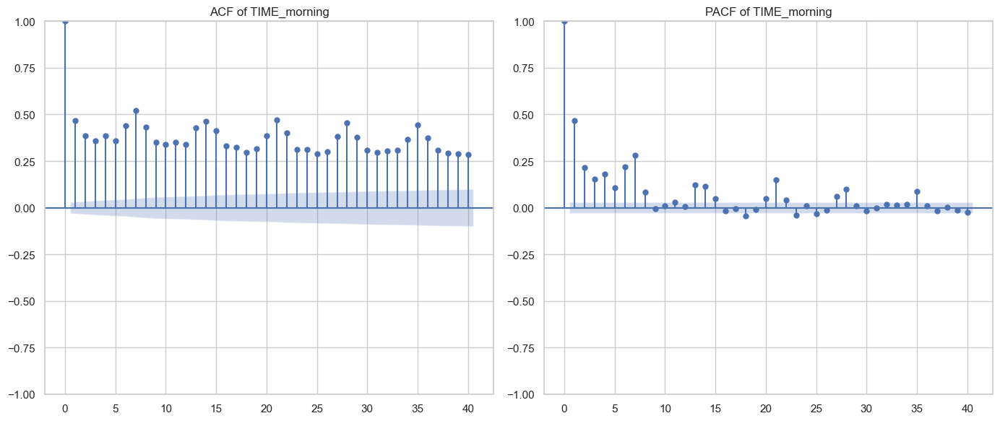

Processing column: TIME_night


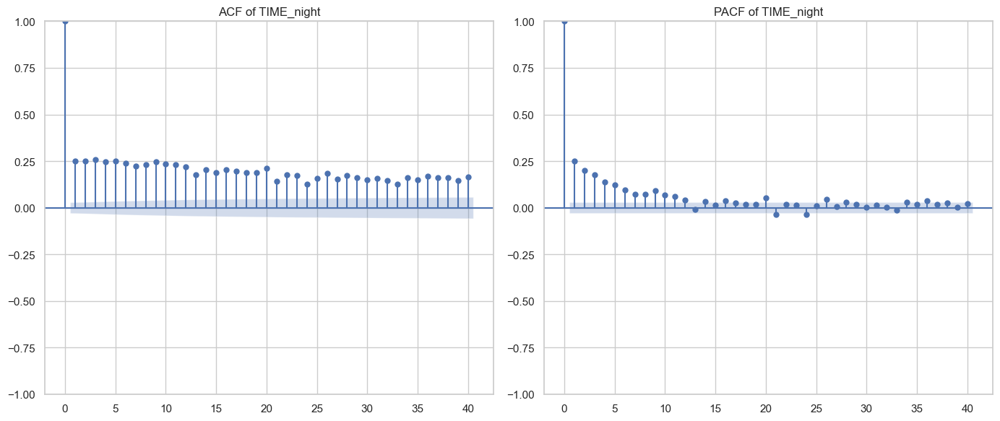

Processing column: TIME_hour


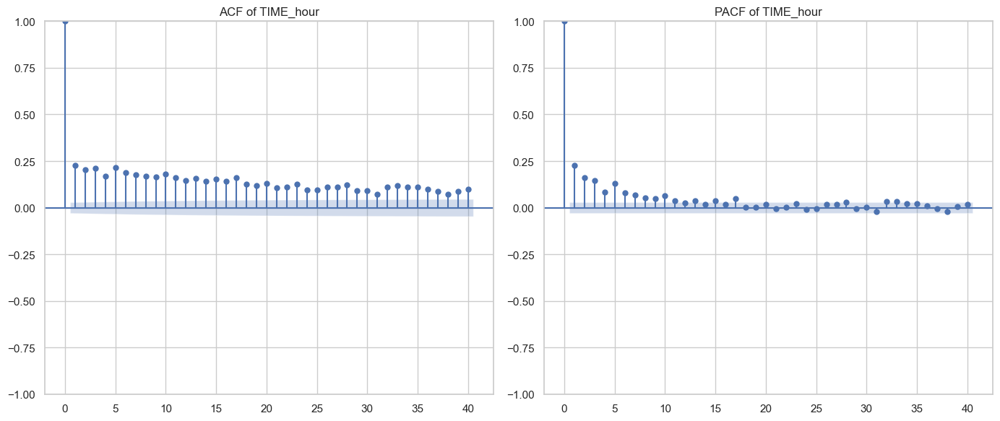

Processing column: TIME_tonight


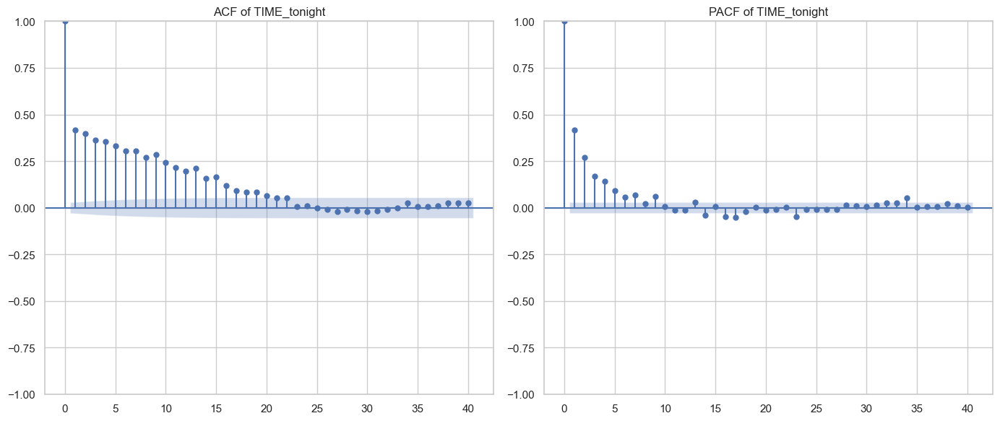

Processing column: TIME_evening


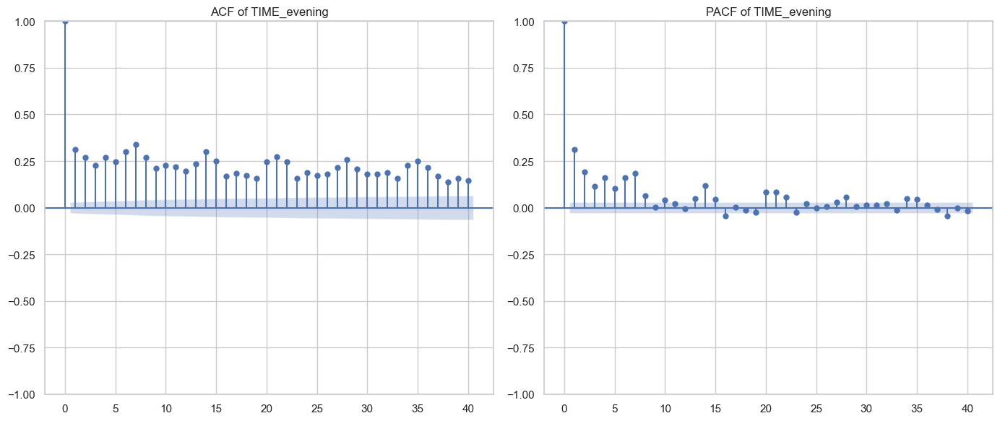

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

merged_df['time_index'] = merged_df['date']

merged_df.drop(columns=['date'],inplace=True)
# Convert 'Date' to index
merged_df.set_index('time_index', inplace=True)

# Iterate through numerical columns
numerical_columns = merged_df.select_dtypes(include=['float64', 'int64']).columns

for column in numerical_columns:
    print(f"Processing column: {column}")

    # Extract time series data
    time_series = merged_df[column]

    # Plot ACF
    plt.figure(figsize=(14, 6))
    plt.subplot(1, 2, 1)
    plot_acf(time_series, ax=plt.gca(), lags=40)
    plt.title(f'ACF of {column}')

    # Plot PACF
    plt.subplot(1, 2, 2)
    plot_pacf(time_series, ax=plt.gca(), lags=40)
    plt.title(f'PACF of {column}')

    # Show plots
    plt.tight_layout()
    plt.show()


In [24]:
# Merge DataFrames on the date column
merged_df = pd.merge(stocks_grouped_df, df_clean, on='date', how='inner')
merged_df.columns

Index(['date', 'Price', 'Open', 'High', 'Low', 'Vol.', 'Change %',
       'vader_sentiment', 'textblob_sentiment', 'is_event', 'topic_12',
       'topic_14', 'topic_15', 'topic_4', 'topic_5', 'topic_1', 'topic_8',
       'topic_7', 'topic_10', 'topic_6', 'topic_9', 'topic_3', 'topic_0',
       'CARDINAL_one', 'CARDINAL_two', 'CARDINAL_million', 'CARDINAL_three',
       'CARDINAL_six', 'EVENT_vietnam', 'EVENT_wwii', 'EVENT_super bowl',
       'EVENT_hurricane katrina', 'EVENT_iraq war', 'FAC_guantanamo',
       'FAC_uva', 'FAC_notre dame', 'FAC_north london', 'FAC_nikki haley',
       'GPE_london', 'GPE_russia', 'GPE_america', 'GPE_california',
       'GPE_china', 'LAW_rico', 'LAW_camilla wear', 'LAW_crown new',
       'LAW_superfund', 'LAW_west ham', 'LOC_europe', 'LOC_middle east',
       'LOC_africa', 'LOC_caribbean', 'LOC_asia', 'MONEY_mike penny',
       'MONEY_million dollar', 'MONEY_billion dollar', 'MONEY_thousand dollar',
       'MONEY_every penny', 'NORP_american', 'NORP_repub

# Feature Engineering

Feature Selection First, Then Rolling Window
Scenario: You have a large number of features, and you want to reduce dimensionality or identify the most relevant features before applying the rolling window.
Advantages:
Efficiency: Reduces the computational load when applying rolling windows, especially if your feature set is large.

# create_time_features

In [25]:
def create_time_features(df: pd.DataFrame) -> pd.DataFrame:
    df['date'] = pd.to_datetime(df['date'])
    df['quarter'] = df['date'].dt.quarter
    df['month'] = df['date'].dt.month
    df['year'] = df['date'].dt.year
    df['week'] = df['date'].dt.isocalendar().week
    df['dayofweek'] = df['date'].dt.dayofweek
    return df

In [26]:
# Create time features
merged_df = create_time_features(merged_df)
merged_df

,date,Price,Open,High,Low,Vol.,Change %,vader_sentiment,textblob_sentiment,is_event,...,TIME_morning,TIME_night,TIME_hour,TIME_tonight,TIME_evening,quarter,month,year,week,dayofweek
0,2012-01-03,5699.91,5572.28,5699.91,5572.28,778.53,2.29,0.9945,0.102829,1,...,0,1,0,0,0,1,1,2012,1,1
1,2012-01-04,5668.45,5699.91,5719.83,5646.36,696.94,-0.55,0.9915,0.125633,1,...,0,1,1,0,0,1,1,2012,1,2
2,2012-01-05,5624.26,5668.45,5689.33,5614.38,794.28,-0.78,0.9828,0.100445,1,...,0,1,0,0,0,1,1,2012,1,3
3,2012-01-06,5649.68,5624.26,5682.78,5623.36,705.02,0.45,0.9969,0.285534,1,...,0,0,0,0,0,1,1,2012,1,4
4,2012-01-07,5649.68,5624.26,5682.78,5623.36,705.02,0.45,0.9968,0.056445,1,...,0,1,0,0,0,1,1,2012,1,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4370,2024-04-23,8044.81,8023.87,8076.52,8021.67,933.44,0.26,-0.8860,-0.237500,1,...,0,0,0,0,0,2,4,2024,17,1
4371,2024-04-24,8040.38,8044.81,8092.20,8031.79,1240.00,-0.06,0.1531,0.068182,1,...,0,0,0,0,0,2,4,2024,17,2
4372,2024-04-25,8078.86,8040.38,8105.59,8030.05,1120.00,0.48,-0.9621,-0.013163,1,...,0,0,0,0,0,2,4,2024,17,3
4373,2024-04-26,8139.83,8078.86,8146.79,8078.86,801.60,0.75,0.0000,0.200000,1,...,0,0,0,0,0,2,4,2024,17,4


In [27]:
merged_df['time_index'] = merged_df['date']
# merged_df.drop(columns=['date'],inplace=True)
# Convert 'Date' to index
merged_df.set_index('time_index', inplace=True)
merged_df

,date,Price,Open,High,Low,Vol.,Change %,vader_sentiment,textblob_sentiment,is_event,...,TIME_morning,TIME_night,TIME_hour,TIME_tonight,TIME_evening,quarter,month,year,week,dayofweek
time_index,,,,,,,,,,,,,,,,,,,,,
2012-01-03,2012-01-03,5699.91,5572.28,5699.91,5572.28,778.53,2.29,0.9945,0.102829,1,...,0,1,0,0,0,1,1,2012,1,1
2012-01-04,2012-01-04,5668.45,5699.91,5719.83,5646.36,696.94,-0.55,0.9915,0.125633,1,...,0,1,1,0,0,1,1,2012,1,2
2012-01-05,2012-01-05,5624.26,5668.45,5689.33,5614.38,794.28,-0.78,0.9828,0.100445,1,...,0,1,0,0,0,1,1,2012,1,3
2012-01-06,2012-01-06,5649.68,5624.26,5682.78,5623.36,705.02,0.45,0.9969,0.285534,1,...,0,0,0,0,0,1,1,2012,1,4
2012-01-07,2012-01-07,5649.68,5624.26,5682.78,5623.36,705.02,0.45,0.9968,0.056445,1,...,0,1,0,0,0,1,1,2012,1,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-04-23,2024-04-23,8044.81,8023.87,8076.52,8021.67,933.44,0.26,-0.8860,-0.237500,1,...,0,0,0,0,0,2,4,2024,17,1
2024-04-24,2024-04-24,8040.38,8044.81,8092.20,8031.79,1240.00,-0.06,0.1531,0.068182,1,...,0,0,0,0,0,2,4,2024,17,2
2024-04-25,2024-04-25,8078.86,8040.38,8105.59,8030.05,1120.00,0.48,-0.9621,-0.013163,1,...,0,0,0,0,0,2,4,2024,17,3


In [28]:
feat_df = merged_df.drop(columns=['date'])

In [29]:
print(f'Length of feat {len(feat_df.columns)}')

Length of feat 102


# Feature Engineering for Regressor Models
For regressor models, you can use a broader range of features:

Original Features: Like Price, Volume, High, Low, etc.
Lagged Features: Similar to time series models, but potentially using more lags and other transformations.
Sentiment Features: Features derived from text analysis (e.g., vader_sentiment, textblob_sentiment).
Categorical Features: Such as is_event, day_of_week, quarter, etc.
Interaction Features: Features created by combining other features (e.g., Price * Volume).

In [30]:
feat_df['Price_Volume'] = feat_df['Price'] * feat_df['Vol.']
feat_df['Open_High_Low'] = feat_df['High'] + feat_df['Low'] + feat_df['Open']
feat_df['Price_Range'] = feat_df['High'] - feat_df['Low']
feat_df['Price_Per_Volume'] = feat_df['Price'] / feat_df['Vol.']
feat_df['High_Low_Ratio'] = feat_df['High'] / feat_df['Low']
feat_df['Change_Volume'] = feat_df['Change %'] * feat_df['Vol.']
feat_df['Change_High'] = feat_df['Change %'] * feat_df['High']
feat_df['Change_Low'] = feat_df['Change %'] * feat_df['Low']
feat_df

,Price,Open,High,Low,Vol.,Change %,vader_sentiment,textblob_sentiment,is_event,topic_12,...,week,dayofweek,Price_Volume,Open_High_Low,Price_Range,Price_Per_Volume,High_Low_Ratio,Change_Volume,Change_High,Change_Low
time_index,,,,,,,,,,,,,,,,,,,,,
2012-01-03,5699.91,5572.28,5699.91,5572.28,778.53,2.29,0.9945,0.102829,1,0.781810,...,1,1,4.437551e+06,16844.47,127.63,7.321375,1.022904,1782.8337,13052.7939,12760.5212
2012-01-04,5668.45,5699.91,5719.83,5646.36,696.94,-0.55,0.9915,0.125633,1,0.460062,...,1,2,3.950570e+06,17066.10,73.47,8.133340,1.013012,-383.3170,-3145.9065,-3105.4980
2012-01-05,5624.26,5668.45,5689.33,5614.38,794.28,-0.78,0.9828,0.100445,1,0.591257,...,1,3,4.467237e+06,16972.16,74.95,7.080954,1.013350,-619.5384,-4437.6774,-4379.2164
2012-01-06,5649.68,5624.26,5682.78,5623.36,705.02,0.45,0.9969,0.285534,1,0.658004,...,1,4,3.983137e+06,16930.40,59.42,8.013503,1.010567,317.2590,2557.2510,2530.5120
2012-01-07,5649.68,5624.26,5682.78,5623.36,705.02,0.45,0.9968,0.056445,1,0.418784,...,1,5,3.983137e+06,16930.40,59.42,8.013503,1.010567,317.2590,2557.2510,2530.5120
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-04-23,8044.81,8023.87,8076.52,8021.67,933.44,0.26,-0.8860,-0.237500,1,0.000000,...,17,1,7.509347e+06,24122.06,54.85,8.618454,1.006838,242.6944,2099.8952,2085.6342
2024-04-24,8040.38,8044.81,8092.20,8031.79,1240.00,-0.06,0.1531,0.068182,1,0.000000,...,17,2,9.970071e+06,24168.80,60.41,6.484177,1.007521,-74.4000,-485.5320,-481.9074
2024-04-25,8078.86,8040.38,8105.59,8030.05,1120.00,0.48,-0.9621,-0.013163,1,0.000000,...,17,3,9.048323e+06,24176.02,75.54,7.213268,1.009407,537.6000,3890.6832,3854.4240


In [31]:
feat_df_copy = feat_df.copy()

A correlation matrix measures the linear relationship between pairs of variables (features). For time series forecasting, especially when dealing with multivariate data (like stock prices combined with news sentiment), it helps identify which features have a strong linear relationship with the target variable (e.g., future stock prices).

# ADF Test: Best for ensuring the stationarity of your time series data, which is crucial for certain types of forecasting models.
Correlation Matrix: Best for selecting relevant features when working with multivariate time series data, especially when combining stock prices with other indicators like sentiment.

In [32]:
from statsmodels.tsa.stattools import adfuller
def adf_test(series):
    result = adfuller(series.dropna(), autolag='AIC')
    return result[1]

The ADF test is used to check for stationarity in a time series. Stationarity is a crucial property in time series forecasting, particularly for models like ARIMA, where non-stationary data can lead to poor model performance.

In [33]:
selected_features = []
# Iterate through each column in the DataFrame
for column in feat_df.columns:
    # Check if the column is constant
    if feat_df[column].nunique() > 1:
        p_value = adf_test(feat_df[column])
        if p_value < 0.05:  # Assuming 5% significance level
            selected_features.append(column)
    else:
        print(f"Skipping constant column: {column}")

selected_features

['Vol.',
 'Change %',
 'vader_sentiment',
 'textblob_sentiment',
 'is_event',
 'topic_15',
 'topic_4',
 'topic_1',
 'topic_8',
 'topic_7',
 'topic_10',
 'topic_6',
 'topic_9',
 'topic_3',
 'topic_0',
 'CARDINAL_two',
 'CARDINAL_million',
 'CARDINAL_three',
 'CARDINAL_six',
 'EVENT_vietnam',
 'EVENT_wwii',
 'EVENT_super bowl',
 'EVENT_hurricane katrina',
 'EVENT_iraq war',
 'FAC_guantanamo',
 'FAC_uva',
 'FAC_notre dame',
 'FAC_north london',
 'FAC_nikki haley',
 'GPE_london',
 'GPE_russia',
 'GPE_california',
 'GPE_china',
 'LAW_rico',
 'LAW_camilla wear',
 'LAW_crown new',
 'LAW_superfund',
 'LAW_west ham',
 'LOC_europe',
 'LOC_middle east',
 'LOC_africa',
 'LOC_caribbean',
 'LOC_asia',
 'MONEY_mike penny',
 'MONEY_million dollar',
 'MONEY_billion dollar',
 'MONEY_thousand dollar',
 'MONEY_every penny',
 'NORP_russian',
 'NORP_muslim',
 'ORDINAL_first',
 'ORDINAL_second',
 'ORDINAL_third',
 'ORDINAL_fourth',
 'ORDINAL_fifth',
 'ORG_senate',
 'ORG_white house',
 'ORG_congress',
 'ORG_s


# Correlation-Based Feature Selection
Use Case: Identify features that have a strong correlation with the target variable (e.g., Price, Change %) while minimizing multicollinearity.
Implementation: Calculate the correlation between each feature and the target variable, then select features that have high correlation with the target and low correlation with each other.
Why: This method is particularly useful in financial data where you often want to remove redundant features (e.g., High, Low, Open might be highly correlated).

In [34]:

# Calculate the correlation matrix
corr_matrix = feat_df[selected_features + ["Price"]].corr()
corr_target = abs(corr_matrix["Price"])  # Example: Target is 'Price'

# Select features with correlation above a threshold, e.g., 0.1
relevant_features = corr_target[corr_target > 0.1]
selected_columns = relevant_features.index.tolist()

selected_columns

['Vol.',
 'vader_sentiment',
 'textblob_sentiment',
 'is_event',
 'topic_15',
 'CARDINAL_two',
 'CARDINAL_million',
 'CARDINAL_three',
 'FAC_north london',
 'GPE_london',
 'GPE_russia',
 'LAW_west ham',
 'LOC_europe',
 'NORP_russian',
 'ORDINAL_first',
 'PERSON_bernie',
 'PERSON_putin',
 'QUANTITY_mile',
 'TIME_night',
 'TIME_hour',
 'Price_Volume',
 'Price_Range',
 'Price_Per_Volume',
 'High_Low_Ratio',
 'Price']

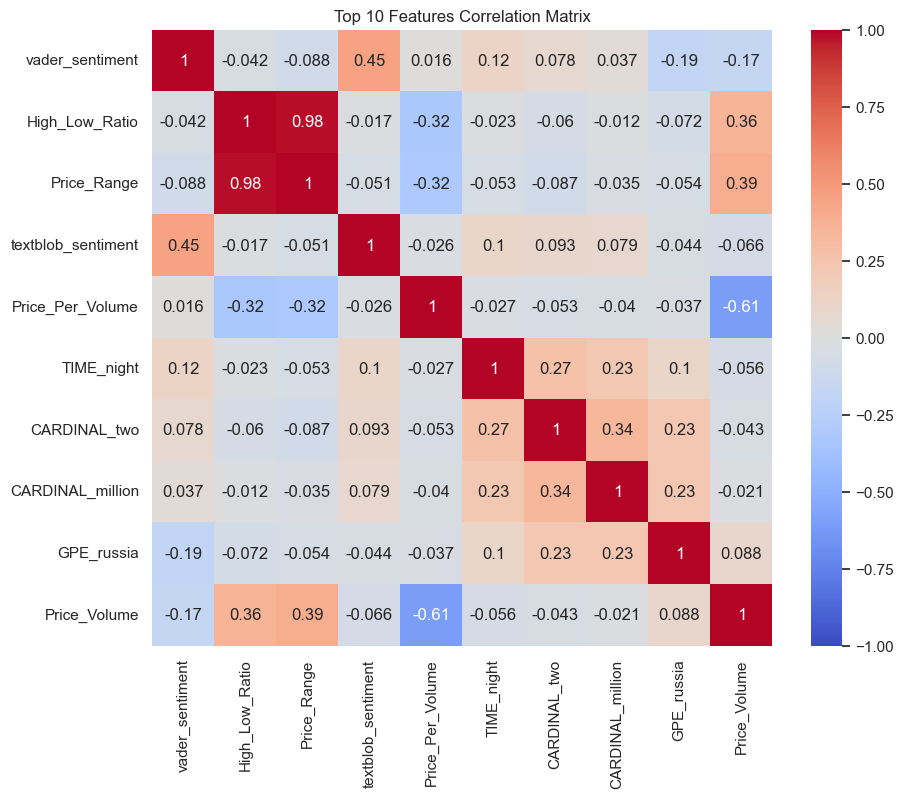

In [35]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming `feat_df` is your DataFrame and 'Price' is the target variable
# Step 1: Calculate the correlation matrix
corr_matrix = feat_df[selected_features + ["Price"]].corr()

# Step 2: Select the top 10 features most correlated with 'Price'
corr_target = abs(corr_matrix["Price"])
top_10_features = corr_target.sort_values(ascending=False).index[1:11]  # [1:11] excludes 'Price' itself

# Step 3: Create a correlation matrix of these top 10 features
top_corr_matrix = corr_matrix.loc[top_10_features, top_10_features]

# Step 4: Plot the correlation matrix
plt.figure(figsize=(10, 8))
sns.heatmap(top_corr_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title("Top 10 Features Correlation Matrix")
plt.show()


In [36]:
len(selected_columns)

25

# These features might have shown high multicollinearity with the target variable (Price) or with each other. For example, High and Low are often highly correlated with Open and Close prices.
In feature selection, if two or more features are highly correlated, one might be removed to reduce redundancy and improve model interpretability and performance. This is because highly correlated features do not provide additional information to the model and can sometimes lead to overfitting.

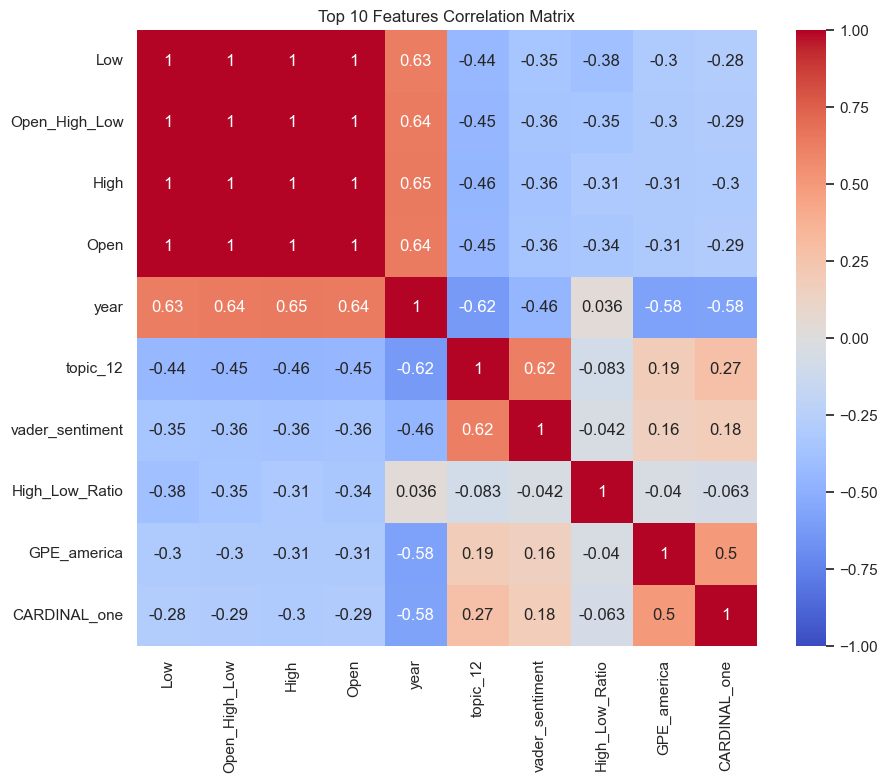

In [37]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming `feat_df` is your DataFrame and 'Price' is the target variable
# Step 1: Calculate the correlation matrix
corr_matrix = feat_df.corr()

# Step 2: Select the top 10 features most correlated with 'Price'
corr_target = abs(corr_matrix["Price"])
top_10_features = corr_target.sort_values(ascending=False).index[1:11]  # [1:11] excludes 'Price' itself

# Step 3: Create a correlation matrix of these top 10 features
top_corr_matrix = corr_matrix.loc[top_10_features, top_10_features]

# Step 4: Plot the correlation matrix
plt.figure(figsize=(10, 8))
sns.heatmap(top_corr_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title("Top 10 Features Correlation Matrix")
plt.show()


##  Choose lag features for - Selected Columns which are correlated
## Stocks - As it will be continuous Data & Rolling Average will be useful
## News - As some news impact stays for morning/next day or even for a week/month and it affects the buy/sell stock trading

### Stocks: Use short-term and medium-term lags along with rolling averages to capture trends and seasonality.
### News: Use immediate and longer-term lags along with rolling averages to capture the impact of news on stock prices.

# generate_lag_features

In [38]:
merged_df = feat_df[selected_columns]
merged_df

,Vol.,vader_sentiment,textblob_sentiment,is_event,topic_15,CARDINAL_two,CARDINAL_million,CARDINAL_three,FAC_north london,GPE_london,...,PERSON_bernie,PERSON_putin,QUANTITY_mile,TIME_night,TIME_hour,Price_Volume,Price_Range,Price_Per_Volume,High_Low_Ratio,Price
time_index,,,,,,,,,,,,,,,,,,,,,
2012-01-03,778.53,0.9945,0.102829,1,0.020600,1,1,1,0,0,...,0,0,0,1,0,4.437551e+06,127.63,7.321375,1.022904,5699.91
2012-01-04,696.94,0.9915,0.125633,1,0.000000,1,1,0,0,0,...,0,0,0,1,1,3.950570e+06,73.47,8.133340,1.013012,5668.45
2012-01-05,794.28,0.9828,0.100445,1,0.036828,1,1,0,0,1,...,0,0,0,1,0,4.467237e+06,74.95,7.080954,1.013350,5624.26
2012-01-06,705.02,0.9969,0.285534,1,0.000000,0,1,0,0,0,...,0,0,0,0,0,3.983137e+06,59.42,8.013503,1.010567,5649.68
2012-01-07,705.02,0.9968,0.056445,1,0.182801,1,0,0,0,1,...,0,0,0,1,0,3.983137e+06,59.42,8.013503,1.010567,5649.68
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-04-23,933.44,-0.8860,-0.237500,1,0.796790,0,0,0,0,0,...,0,0,0,0,0,7.509347e+06,54.85,8.618454,1.006838,8044.81
2024-04-24,1240.00,0.1531,0.068182,1,0.771326,0,0,0,0,0,...,0,0,0,0,0,9.970071e+06,60.41,6.484177,1.007521,8040.38
2024-04-25,1120.00,-0.9621,-0.013163,1,0.456016,0,1,1,0,0,...,0,1,0,0,0,9.048323e+06,75.54,7.213268,1.009407,8078.86


In [39]:
merged_df_copy = merged_df.copy()


In [40]:
merged_df = merged_df[selected_columns]

In [41]:
def generate_lag_features(df: pd.DataFrame, target_col: str) -> pd.DataFrame:
    df = df.copy()  # Avoid modifying the original DataFrame
    df[target_col+'_lag_1d'] = df[target_col].shift(1)
    df[target_col+'_lag_2d'] = df[target_col].shift(2)
    df[target_col+'_lag_4d'] = df[target_col].shift(4)
    df[target_col+'_lag_8d'] = df[target_col].shift(8)
    df[target_col+'_lag_10d'] = df[target_col].shift(10)
    df[target_col+'_lag_12d'] = df[target_col].shift(12)

   # Stock Data Rolling Averages
    df[target_col+'_RollingAvg_3d'] = df[target_col].rolling(window=3).mean()
    df[target_col+'_RollingAvg_5d'] = df[target_col].rolling(window=5).mean()
    df[target_col+'_RollingAvg_7d'] = df[target_col].rolling(window=7).mean()
    df[target_col+'_RollingAvg_14d'] = df[target_col].rolling(window=14).mean()

    df.fillna(df[target_col].mean(), inplace=True)  # Handle NaNs by filling with the mean
    return df


In [42]:
merged_df = generate_lag_features(merged_df, target_col = 'Price')

In [43]:
merged_df_copy

,Vol.,vader_sentiment,textblob_sentiment,is_event,topic_15,CARDINAL_two,CARDINAL_million,CARDINAL_three,FAC_north london,GPE_london,...,PERSON_bernie,PERSON_putin,QUANTITY_mile,TIME_night,TIME_hour,Price_Volume,Price_Range,Price_Per_Volume,High_Low_Ratio,Price
time_index,,,,,,,,,,,,,,,,,,,,,
2012-01-03,778.53,0.9945,0.102829,1,0.020600,1,1,1,0,0,...,0,0,0,1,0,4.437551e+06,127.63,7.321375,1.022904,5699.91
2012-01-04,696.94,0.9915,0.125633,1,0.000000,1,1,0,0,0,...,0,0,0,1,1,3.950570e+06,73.47,8.133340,1.013012,5668.45
2012-01-05,794.28,0.9828,0.100445,1,0.036828,1,1,0,0,1,...,0,0,0,1,0,4.467237e+06,74.95,7.080954,1.013350,5624.26
2012-01-06,705.02,0.9969,0.285534,1,0.000000,0,1,0,0,0,...,0,0,0,0,0,3.983137e+06,59.42,8.013503,1.010567,5649.68
2012-01-07,705.02,0.9968,0.056445,1,0.182801,1,0,0,0,1,...,0,0,0,1,0,3.983137e+06,59.42,8.013503,1.010567,5649.68
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-04-23,933.44,-0.8860,-0.237500,1,0.796790,0,0,0,0,0,...,0,0,0,0,0,7.509347e+06,54.85,8.618454,1.006838,8044.81
2024-04-24,1240.00,0.1531,0.068182,1,0.771326,0,0,0,0,0,...,0,0,0,0,0,9.970071e+06,60.41,6.484177,1.007521,8040.38
2024-04-25,1120.00,-0.9621,-0.013163,1,0.456016,0,1,1,0,0,...,0,1,0,0,0,9.048323e+06,75.54,7.213268,1.009407,8078.86


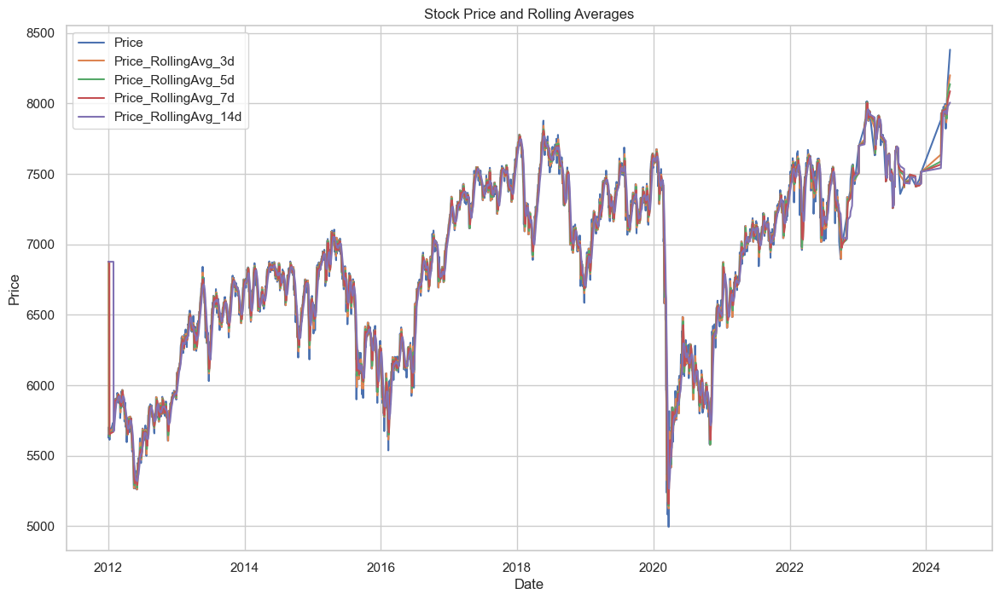

In [44]:
import matplotlib.pyplot as plt

# Define the features you want to plot
features_to_plot = [
    'Price',
    'Price_RollingAvg_3d',
    'Price_RollingAvg_5d',
    'Price_RollingAvg_7d',
    'Price_RollingAvg_14d'
]

# Plot each feature
plt.figure(figsize=(14, 8))

for feature in features_to_plot:
    plt.plot(merged_df[feature], label=feature)

plt.title('Stock Price and Rolling Averages')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.grid(True)
plt.show()


In [45]:
# Loop through columns and print names excluding 'Price' and 'date'
for col in merged_df.columns:
    if 'Price' not in col   and col != 'date':
        print(col)
        merged_df = generate_lag_features(merged_df, target_col = col)

Vol.
vader_sentiment
textblob_sentiment
is_event
topic_15
CARDINAL_two
CARDINAL_million
CARDINAL_three
FAC_north london
GPE_london
GPE_russia
LAW_west ham
LOC_europe
NORP_russian
ORDINAL_first
PERSON_bernie
PERSON_putin
QUANTITY_mile
TIME_night
TIME_hour
High_Low_Ratio


In [46]:
# merged_df['date'] = merged_df_copy['date']
merged_df

,Vol.,vader_sentiment,textblob_sentiment,is_event,topic_15,CARDINAL_two,CARDINAL_million,CARDINAL_three,FAC_north london,GPE_london,...,High_Low_Ratio_lag_1d,High_Low_Ratio_lag_2d,High_Low_Ratio_lag_4d,High_Low_Ratio_lag_8d,High_Low_Ratio_lag_10d,High_Low_Ratio_lag_12d,High_Low_Ratio_RollingAvg_3d,High_Low_Ratio_RollingAvg_5d,High_Low_Ratio_RollingAvg_7d,High_Low_Ratio_RollingAvg_14d
time_index,,,,,,,,,,,,,,,,,,,,,
2012-01-03,778.53,0.9945,0.102829,1,0.020600,1,1,1,0,0,...,1.011513,1.011513,1.011513,1.011513,1.011513,1.011513,1.011513,1.011513,1.011513,1.011513
2012-01-04,696.94,0.9915,0.125633,1,0.000000,1,1,0,0,0,...,1.022904,1.011513,1.011513,1.011513,1.011513,1.011513,1.011513,1.011513,1.011513,1.011513
2012-01-05,794.28,0.9828,0.100445,1,0.036828,1,1,0,0,1,...,1.013012,1.022904,1.011513,1.011513,1.011513,1.011513,1.016422,1.011513,1.011513,1.011513
2012-01-06,705.02,0.9969,0.285534,1,0.000000,0,1,0,0,0,...,1.013350,1.013012,1.011513,1.011513,1.011513,1.011513,1.012309,1.011513,1.011513,1.011513
2012-01-07,705.02,0.9968,0.056445,1,0.182801,1,0,0,0,1,...,1.010567,1.013350,1.022904,1.011513,1.011513,1.011513,1.011494,1.014080,1.011513,1.011513
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-04-23,933.44,-0.8860,-0.237500,1,0.796790,0,0,0,0,0,...,1.018612,1.011630,1.006740,1.015293,1.010524,1.008271,1.012360,1.011090,1.012098,1.011567
2024-04-24,1240.00,0.1531,0.068182,1,0.771326,0,0,0,0,0,...,1.006838,1.018612,1.011630,1.015293,1.010549,1.005723,1.010990,1.011246,1.012142,1.011276
2024-04-25,1120.00,-0.9621,-0.013163,1,0.456016,0,1,1,0,0,...,1.007521,1.006838,1.011630,1.007216,1.015293,1.010524,1.007922,1.010802,1.010340,1.011357


In [50]:
# merged_df['time_index'] = merged_df['date']

# merged_df.drop(columns=['date'],inplace=True)
# # Convert 'Date' to index
# merged_df.set_index('time_index', inplace=True)

In [51]:
merged_df

,Vol.,vader_sentiment,textblob_sentiment,is_event,topic_15,CARDINAL_two,CARDINAL_million,CARDINAL_three,FAC_north london,GPE_london,...,High_Low_Ratio_lag_1d,High_Low_Ratio_lag_2d,High_Low_Ratio_lag_4d,High_Low_Ratio_lag_8d,High_Low_Ratio_lag_10d,High_Low_Ratio_lag_12d,High_Low_Ratio_RollingAvg_3d,High_Low_Ratio_RollingAvg_5d,High_Low_Ratio_RollingAvg_7d,High_Low_Ratio_RollingAvg_14d
time_index,,,,,,,,,,,,,,,,,,,,,
2012-01-03,778.53,0.9945,0.102829,1,0.020600,1,1,1,0,0,...,1.011513,1.011513,1.011513,1.011513,1.011513,1.011513,1.011513,1.011513,1.011513,1.011513
2012-01-04,696.94,0.9915,0.125633,1,0.000000,1,1,0,0,0,...,1.022904,1.011513,1.011513,1.011513,1.011513,1.011513,1.011513,1.011513,1.011513,1.011513
2012-01-05,794.28,0.9828,0.100445,1,0.036828,1,1,0,0,1,...,1.013012,1.022904,1.011513,1.011513,1.011513,1.011513,1.016422,1.011513,1.011513,1.011513
2012-01-06,705.02,0.9969,0.285534,1,0.000000,0,1,0,0,0,...,1.013350,1.013012,1.011513,1.011513,1.011513,1.011513,1.012309,1.011513,1.011513,1.011513
2012-01-07,705.02,0.9968,0.056445,1,0.182801,1,0,0,0,1,...,1.010567,1.013350,1.022904,1.011513,1.011513,1.011513,1.011494,1.014080,1.011513,1.011513
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-04-23,933.44,-0.8860,-0.237500,1,0.796790,0,0,0,0,0,...,1.018612,1.011630,1.006740,1.015293,1.010524,1.008271,1.012360,1.011090,1.012098,1.011567
2024-04-24,1240.00,0.1531,0.068182,1,0.771326,0,0,0,0,0,...,1.006838,1.018612,1.011630,1.015293,1.010549,1.005723,1.010990,1.011246,1.012142,1.011276
2024-04-25,1120.00,-0.9621,-0.013163,1,0.456016,0,1,1,0,0,...,1.007521,1.006838,1.011630,1.007216,1.015293,1.010524,1.007922,1.010802,1.010340,1.011357


In [52]:
X = merged_df.drop(columns=['Price'])
y = merged_df['Price']

Tree-based models like RandomForestRegressor, ExtraTreesRegressor, and CatBoostRegressor are excellent for determining feature importance due to their ability to handle large datasets with many features.

In [ ]:
from sklearn.ensemble import RandomForestRegressor, ExtraTreesRegressor
from catboost import CatBoostRegressor
import pandas as pd

# Assuming X is your feature matrix and y is your target variable
models = {
    "RandomForest": RandomForestRegressor(),
    "ExtraTrees": ExtraTreesRegressor(),
    "CatBoost": CatBoostRegressor()
}

feature_importances = pd.DataFrame()

for name, model in models.items():
    model.fit(X, y)
    feature_importances[name] = model.feature_importances_

feature_importances['mean_importance'] = feature_importances.mean(axis=1)
feature_importances.index = X.columns

# Sort features by their average importance across models
feature_importances = feature_importances.sort_values(by='mean_importance', ascending=False)

feature_importances


In [ ]:
feature_importances[feature_importances['mean_importance'] > 0.005]

In [ ]:
# Select top N features
top_features = feature_importances[feature_importances['mean_importance'] > 0.005].index
X_top_features = X[top_features]
X_top_features

In [ ]:
top_features

In [ ]:
from statsmodels.tsa.stattools import adfuller

stationary_features = []

for feature in top_features:
    result = adfuller(X_top_features[feature])
    if result[1] < 0.05:  # p-value < 0.05 indicates stationarity
        stationary_features.append(feature)

X_stationary = X_top_features[stationary_features]
X_stationary

# Use the Augmented Dickey-Fuller (ADF) test to ensure that selected features are stationary, which is crucial for ARIMA and Exponential Smoothing models.

In [ ]:
stationary_features

In [ ]:
corr_matrix = X_stationary.corr().abs()
upper_triangle = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))

# Select features with correlation less than 0.8
selected_features = [column for column in upper_triangle.columns if not any(upper_triangle[column] > 0.8)]
X_final = X_stationary[selected_features]


In [ ]:
X_final

In [ ]:
selected_features

In [ ]:
regressor_features = [
    'Price', 'Open', 'High', 'Low', 'Vol.', 'Change %',
       'vader_sentiment', 'textblob_sentiment', 'is_event', 'week', 'month', 'quarter' ,'year', 'dayofweek'
]

In [ ]:
columns_list  = X_top_features.columns.tolist()
combined_features = columns_list + selected_features
combined_features=set(combined_features)
combined_features = list(combined_features)
combined_features

In [ ]:
merged_df[combined_features]

In [ ]:
import inspect
import os

import time
import datetime as dt
from datetime import timedelta
import calendar
from datetime import datetime
from datetime import date

import warnings
warnings.filterwarnings('ignore')

import matplotlib.pyplot as plt
import seaborn as sns

import scipy.stats
from scipy.stats import uniform, randint
from scipy.stats.distributions import chi2

import pylab

from statsmodels.tsa.holtwinters import ExponentialSmoothing, SimpleExpSmoothing, Holt
from statsmodels.tsa.seasonal import seasonal_decompose

import statsmodels.tsa.stattools as sts
import statsmodels.graphics.tsaplots as sgt
import statsmodels.graphics.tsaplots as plot_acf

from statsmodels.tools.eval_measures import mse,rmse

from sklearn.metrics import accuracy_score
from sklearn import linear_model
from sklearn.linear_model import ElasticNet
from sklearn.linear_model import Lasso
from sklearn.linear_model import Ridge

from sklearn.model_selection   import GridSearchCV, cross_val_score
from sklearn.model_selection   import TimeSeriesSplit, RandomizedSearchCV
from sklearn.model_selection   import RepeatedKFold
from sklearn.feature_selection import VarianceThreshold

from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble          import ExtraTreesRegressor
from sklearn.neighbors         import KNeighborsRegressor

import catboost
from catboost import CatBoostClassifier
from catboost import CatBoostRegressor

import xgboost as xgb
import lightgbm as lgb

from sklearn.preprocessing import MinMaxScaler

from tqdm import tqdm
tqdm.pandas()

# Visualization
# import ipyleaflet
import matplotlib.pyplot as plt

import requests

# Supress Warnings
import warnings
warnings.filterwarnings('ignore')


from IPython.display import Image
import seaborn as sns

# Data Science
import numpy as np
import pandas as pd

# Feature Engineering
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

# Machine Learning
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import f1_score, accuracy_score,classification_report,confusion_matrix
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
from sklearn.tree import DecisionTreeRegressor

# Others
from itertools import cycle
import pickle

import numpy as np
import pandas as pd
from sklearn.model_selection import cross_val_score, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.ensemble import RandomForestRegressor, ExtraTreesRegressor
from sklearn.linear_model import Ridge, Lasso, ElasticNet
from catboost import CatBoostRegressor
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from sklearn.metrics import make_scorer, mean_squared_error

# Create Validation Test Set

## Reiterative Process to find the current week Features Selection as News Impact will chnage

## Ensemble Weight Also Changes according to the scenario

### Select last week DATA

# Important Create own future test features e.g. news_topic_1 by rolling average as we don't have the future data - So real scenario replicate in validation test as well

In [100]:
merged_df.to_csv('merged_df_data.csv')

In [101]:
X = merged_df[combined_features]   # Your selected features DataFrame
y = merged_df['Price']  # Your target variable

In [432]:
# Assuming 'X' is your feature matrix and 'y' is the target variable (e.g., 'Price')
forecast_duration = 7
train_size = len(X) - forecast_duration

X.fillna(0,inplace=True)

# Split the data
X_train, X_test = X.iloc[:train_size], X.iloc[train_size:]
y_train, y_test = y.iloc[:train_size], y.iloc[train_size:]

In [433]:
# Create future dates for the next week
last_train_date = merged_df.index[-1]
# Create future dates DataFrame
future_dates = pd.date_range(start=last_train_date + timedelta(days=1), periods=forecast_duration, freq='D')
future_df = pd.DataFrame({'date': future_dates})
future_df

,date
0,2024-08-31
1,2024-09-01
2,2024-09-02
3,2024-09-03
4,2024-09-04
5,2024-09-05
6,2024-09-06


In [434]:
X_test['date'] = future_df['date']
future_df = future_df.merge(X_test, on='date', how='left')
future_df['time_index'] = future_df['date']
future_df.drop(columns=['date'],inplace=True)
# Convert 'Date' to index
future_df.set_index('time_index', inplace=True)
future_df

,CARDINAL_two_RollingAvg_14d,Price_lag_10d,High_Low_Ratio_lag_10d,topic_14_lag_10d,vader_sentiment_lag_10d,textblob_sentiment_lag_10d,CARDINAL_million_lag_1d,CARDINAL_two_lag_4d,topic_12_RollingAvg_14d,High_Low_Ratio_lag_8d,...,textblob_sentiment_lag_1d,Price_Volume,vader_sentiment_lag_8d,TIME_night_RollingAvg_5d,topic_12_lag_10d,GPE_america,Price_lag_4d,CARDINAL_one,Price_RollingAvg_14d,QUANTITY_mile_RollingAvg_14d
time_index,,,,,,,,,,,,,,,,,,,,,
2024-08-31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2024-09-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2024-09-02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2024-09-03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2024-09-04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2024-09-05,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2024-09-06,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [435]:
# Append the future dates DataFrame to the original training DataFrame
train_df = pd.concat([X_train, future_df], ignore_index=False)
train_df

,CARDINAL_two_RollingAvg_14d,Price_lag_10d,High_Low_Ratio_lag_10d,topic_14_lag_10d,vader_sentiment_lag_10d,textblob_sentiment_lag_10d,CARDINAL_million_lag_1d,CARDINAL_two_lag_4d,topic_12_RollingAvg_14d,High_Low_Ratio_lag_8d,...,textblob_sentiment_lag_1d,Price_Volume,vader_sentiment_lag_8d,TIME_night_RollingAvg_5d,topic_12_lag_10d,GPE_america,Price_lag_4d,CARDINAL_one,Price_RollingAvg_14d,QUANTITY_mile_RollingAvg_14d
time_index,,,,,,,,,,,,,,,,,,,,,
2012-01-03,0.418569,6912.807491,1.011643,0.732206,-0.04862,0.065071,0.324853,0.418569,0.175606,1.011643,...,0.065071,4.437551e+06,-0.04862,0.232659,0.175606,0.51359,6912.807491,0.693194,6912.807491,0.126549
2012-01-04,0.418569,6912.807491,1.011643,0.732206,-0.04862,0.065071,0.324853,0.418569,0.175606,1.011643,...,0.065071,3.950570e+06,-0.04862,0.232659,0.175606,0.51359,6912.807491,0.693194,6912.807491,0.126549
2012-01-05,0.418569,6912.807491,1.011643,0.732206,-0.04862,0.065071,0.324853,0.418569,0.175606,1.011643,...,0.065071,4.467237e+06,-0.04862,0.232659,0.175606,0.51359,6912.807491,0.693194,6912.807491,0.126549
2012-01-06,0.418569,6912.807491,1.011643,0.732206,-0.04862,0.065071,0.324853,0.418569,0.175606,1.011643,...,0.065071,3.983137e+06,-0.04862,0.232659,0.175606,0.51359,6912.807491,0.693194,6912.807491,0.126549
2012-01-07,0.418569,6912.807491,1.011643,0.732206,-0.04862,0.065071,0.324853,0.418569,0.175606,1.011643,...,0.065071,3.983137e+06,-0.04862,0.232659,0.175606,0.51359,5699.910000,0.693194,6912.807491,0.126549
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-09-02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2024-09-03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2024-09-04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [436]:
# Ensure no column name duplication
train_df.columns = train_df.columns.map(lambda x: x.strip())  # Strip any leading/trailing whitespace from column names
train_df = train_df.loc[:, ~train_df.columns.duplicated()]  # Remove duplicated columns

# Function to fill NaN values using the mean of the previous `forecast_duration` values
def fill_with_previous_forecast_duration(series, forecast_duration=7):
    filled_series = series.copy()
    for i in range(len(series)):
        if pd.isna(series.iloc[i]):  # Check if the current value is NaN
            # Get previous `forecast_duration` values
            previous_values = series[max(0, i-forecast_duration):i]
            if len(previous_values) > 0:  # Ensure there are values to calculate the mean
                # Calculate the mean of the previous values, ignoring NaN values
                mean_value = previous_values.mean()
                filled_series.iloc[i] = mean_value
    return filled_series

# Apply the function to each column in the DataFrame
for col in train_df.columns:
    # print(f"Processing column: {col}")
    train_df[col] = fill_with_previous_forecast_duration(train_df[col])

train_df

,CARDINAL_two_RollingAvg_14d,Price_lag_10d,High_Low_Ratio_lag_10d,topic_14_lag_10d,vader_sentiment_lag_10d,textblob_sentiment_lag_10d,CARDINAL_million_lag_1d,CARDINAL_two_lag_4d,topic_12_RollingAvg_14d,High_Low_Ratio_lag_8d,...,textblob_sentiment_lag_1d,Price_Volume,vader_sentiment_lag_8d,TIME_night_RollingAvg_5d,topic_12_lag_10d,GPE_america,Price_lag_4d,CARDINAL_one,Price_RollingAvg_14d,QUANTITY_mile_RollingAvg_14d
time_index,,,,,,,,,,,,,,,,,,,,,
2012-01-03,0.418569,6912.807491,1.011643,0.732206,-0.04862,0.065071,0.324853,0.418569,0.175606,1.011643,...,0.065071,4.437551e+06,-0.04862,0.232659,0.175606,0.51359,6912.807491,0.693194,6912.807491,0.126549
2012-01-04,0.418569,6912.807491,1.011643,0.732206,-0.04862,0.065071,0.324853,0.418569,0.175606,1.011643,...,0.065071,3.950570e+06,-0.04862,0.232659,0.175606,0.51359,6912.807491,0.693194,6912.807491,0.126549
2012-01-05,0.418569,6912.807491,1.011643,0.732206,-0.04862,0.065071,0.324853,0.418569,0.175606,1.011643,...,0.065071,4.467237e+06,-0.04862,0.232659,0.175606,0.51359,6912.807491,0.693194,6912.807491,0.126549
2012-01-06,0.418569,6912.807491,1.011643,0.732206,-0.04862,0.065071,0.324853,0.418569,0.175606,1.011643,...,0.065071,3.983137e+06,-0.04862,0.232659,0.175606,0.51359,6912.807491,0.693194,6912.807491,0.126549
2012-01-07,0.418569,6912.807491,1.011643,0.732206,-0.04862,0.065071,0.324853,0.418569,0.175606,1.011643,...,0.065071,3.983137e+06,-0.04862,0.232659,0.175606,0.51359,5699.910000,0.693194,6912.807491,0.126549
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-09-02,0.000000,8189.956000,1.007083,0.820142,-0.25000,-0.037500,0.000000,0.000000,0.097445,1.007767,...,-0.037500,5.588386e+06,-0.25000,0.000000,0.097445,0.00000,8327.704000,0.000000,8254.590857,0.000000
2024-09-03,0.000000,8195.420000,1.007042,0.820142,-0.25000,-0.037500,0.000000,0.000000,0.097445,1.007896,...,-0.037500,5.652906e+06,-0.25000,0.000000,0.097445,0.00000,8322.792500,0.000000,8260.954821,0.000000
2024-09-04,0.000000,8204.526667,1.006973,0.820142,-0.25000,-0.037500,0.000000,0.000000,0.097445,1.008268,...,-0.037500,6.185292e+06,-0.25000,0.000000,0.097445,0.00000,8326.586667,0.000000,8265.689286,0.000000


In [437]:
train_df.fillna(method='ffill', inplace=True)
train_df = train_df.fillna(train_df.mean(numeric_only=True))
train_df

,CARDINAL_two_RollingAvg_14d,Price_lag_10d,High_Low_Ratio_lag_10d,topic_14_lag_10d,vader_sentiment_lag_10d,textblob_sentiment_lag_10d,CARDINAL_million_lag_1d,CARDINAL_two_lag_4d,topic_12_RollingAvg_14d,High_Low_Ratio_lag_8d,...,textblob_sentiment_lag_1d,Price_Volume,vader_sentiment_lag_8d,TIME_night_RollingAvg_5d,topic_12_lag_10d,GPE_america,Price_lag_4d,CARDINAL_one,Price_RollingAvg_14d,QUANTITY_mile_RollingAvg_14d
time_index,,,,,,,,,,,,,,,,,,,,,
2012-01-03,0.418569,6912.807491,1.011643,0.732206,-0.04862,0.065071,0.324853,0.418569,0.175606,1.011643,...,0.065071,4.437551e+06,-0.04862,0.232659,0.175606,0.51359,6912.807491,0.693194,6912.807491,0.126549
2012-01-04,0.418569,6912.807491,1.011643,0.732206,-0.04862,0.065071,0.324853,0.418569,0.175606,1.011643,...,0.065071,3.950570e+06,-0.04862,0.232659,0.175606,0.51359,6912.807491,0.693194,6912.807491,0.126549
2012-01-05,0.418569,6912.807491,1.011643,0.732206,-0.04862,0.065071,0.324853,0.418569,0.175606,1.011643,...,0.065071,4.467237e+06,-0.04862,0.232659,0.175606,0.51359,6912.807491,0.693194,6912.807491,0.126549
2012-01-06,0.418569,6912.807491,1.011643,0.732206,-0.04862,0.065071,0.324853,0.418569,0.175606,1.011643,...,0.065071,3.983137e+06,-0.04862,0.232659,0.175606,0.51359,6912.807491,0.693194,6912.807491,0.126549
2012-01-07,0.418569,6912.807491,1.011643,0.732206,-0.04862,0.065071,0.324853,0.418569,0.175606,1.011643,...,0.065071,3.983137e+06,-0.04862,0.232659,0.175606,0.51359,5699.910000,0.693194,6912.807491,0.126549
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-09-02,0.000000,8189.956000,1.007083,0.820142,-0.25000,-0.037500,0.000000,0.000000,0.097445,1.007767,...,-0.037500,5.588386e+06,-0.25000,0.000000,0.097445,0.00000,8327.704000,0.000000,8254.590857,0.000000
2024-09-03,0.000000,8195.420000,1.007042,0.820142,-0.25000,-0.037500,0.000000,0.000000,0.097445,1.007896,...,-0.037500,5.652906e+06,-0.25000,0.000000,0.097445,0.00000,8322.792500,0.000000,8260.954821,0.000000
2024-09-04,0.000000,8204.526667,1.006973,0.820142,-0.25000,-0.037500,0.000000,0.000000,0.097445,1.008268,...,-0.037500,6.185292e+06,-0.25000,0.000000,0.097445,0.00000,8326.586667,0.000000,8265.689286,0.000000


**Y_train replace with created features as a real scenario**

In [452]:
x_test = train_df.iloc[train_size:]
x_test

,CARDINAL_two_RollingAvg_14d,Price_lag_10d,High_Low_Ratio_lag_10d,topic_14_lag_10d,vader_sentiment_lag_10d,textblob_sentiment_lag_10d,CARDINAL_million_lag_1d,CARDINAL_two_lag_4d,topic_12_RollingAvg_14d,High_Low_Ratio_lag_8d,...,textblob_sentiment_lag_1d,Price_Volume,vader_sentiment_lag_8d,TIME_night_RollingAvg_5d,topic_12_lag_10d,GPE_america,Price_lag_4d,CARDINAL_one,Price_RollingAvg_14d,QUANTITY_mile_RollingAvg_14d
time_index,,,,,,,,,,,,,,,,,,,,,
2024-08-31,0.0,8180.232857,1.009551,0.820142,-0.25,-0.0375,0.0,0.0,0.097445,1.007618,...,-0.0375,5.215714e+06,-0.25,0.0,0.097445,0.0,8307.828571,0.0,8238.806327,0.0
2024-09-01,0.0,8182.458333,1.008022,0.820142,-0.25,-0.0375,0.0,0.0,0.097445,1.007680,...,-0.0375,5.370994e+06,-0.25,0.0,0.097445,0.0,8319.928333,0.0,8246.196905,0.0
2024-09-02,0.0,8189.956000,1.007083,0.820142,-0.25,-0.0375,0.0,0.0,0.097445,1.007767,...,-0.0375,5.588386e+06,-0.25,0.0,0.097445,0.0,8327.704000,0.0,8254.590857,0.0
2024-09-03,0.0,8195.420000,1.007042,0.820142,-0.25,-0.0375,0.0,0.0,0.097445,1.007896,...,-0.0375,5.652906e+06,-0.25,0.0,0.097445,0.0,8322.792500,0.0,8260.954821,0.0
2024-09-04,0.0,8204.526667,1.006973,0.820142,-0.25,-0.0375,0.0,0.0,0.097445,1.008268,...,-0.0375,6.185292e+06,-0.25,0.0,0.097445,0.0,8326.586667,0.0,8265.689286,0.0
2024-09-05,0.0,8222.740000,1.006836,0.820142,-0.25,-0.0375,0.0,0.0,0.097445,1.008956,...,-0.0375,5.861147e+06,-0.25,0.0,0.097445,0.0,8334.175000,0.0,8270.995714,0.0
2024-09-06,0.0,8235.230000,1.006892,0.820142,-0.25,-0.0375,0.0,0.0,0.097445,1.010861,...,-0.0375,5.117504e+06,-0.25,0.0,0.097445,0.0,8356.940000,0.0,8276.698571,0.0


In [456]:
# Define the models with hyperparameter grids for GridSearchCV
model_params = {

    "Ridge": {
        "model": Ridge(),
        "params": {
            "model__alpha": [0.1, 1.0, 10.0, 100.0]
        }
    },
    "Lasso": {
        "model": Lasso(),
        "params": {
            "model__alpha": [0.1, 1.0, 10.0, 100.0]
        }
    },
    "ElasticNet": {
        "model": ElasticNet(),
        "params": {
            "model__alpha": [0.1, 1.0, 10.0],
            "model__l1_ratio": [0.2, 0.5, 0.8]
        }
    }
}

# # Define the models with hyperparameter grids for GridSearchCV
# model_params = {
#      "ElasticNet": {
#         "model": ElasticNet(),
#         "params": {
#             "model__alpha": [0.1, 1.0, 10.0],
#             "model__l1_ratio": [0.2, 0.5, 0.8]
#         }
#     },
#     "Ridge": {
#         "model": Ridge(),
#         "params": {
#             'model__alpha': [0.01, 0.1, 1, 10],
#             'model__fit_intercept': [True, False],
#             'model__max_iter': [100, 1000],
#             'model__solver': ['auto', 'svd', 'cholesky', 'lsqr', 'saga']
#         }
#     },
#     "Lasso": {
#         "model": Lasso(),
#         "params": {
#             'model__alpha': [0.001, 0.01, 0.1, 1.0],
#             'model__fit_intercept': [True, False],
#             'model__max_iter': [100, 1000],
#             'model__selection': ['cyclic', 'random']
#         }
#     }
# }

In [464]:
X_train.shape, y_train.shape, X_test.shape, y_test.shape

((4617, 97), (4617,), (7, 98), (7,))

In [465]:
# Standardize the features
scaler = StandardScaler()

# Dictionary to store model performance
model_performance = {}

# Scorer for GridSearchCV using R² score
scorer = make_scorer(r2_score)

# Loop through the models
for name, mp in model_params.items():
    pipeline = Pipeline([
        ('scaler', scaler),
        ('model', mp['model'])
    ])
    try:
      grid = GridSearchCV(pipeline, mp['params'], cv=5, scoring=scorer, n_jobs=-1)
      grid.fit(X_train, y_train)

      best_score = grid.best_score_
      best_params = grid.best_params_
      print(f"{name} - Best Score: {best_score}, Best Params: {best_params}")

      model_performance[name] = {
          "best_score": best_score,
          "best_params": best_params,
          "best_estimator": grid.best_estimator_
      }
    except:
      print(name)

Ridge - Best Score: -2.179194147572565, Best Params: {'model__alpha': 0.1}
Lasso - Best Score: 0.9844279134616297, Best Params: {'model__alpha': 10.0}
ElasticNet - Best Score: -32.231275646514646, Best Params: {'model__alpha': 0.1, 'model__l1_ratio': 0.8}


In [459]:
from statsmodels.tsa.arima.model import ARIMA
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import r2_score
import numpy as np

# Example function to perform time series cross-validation for ARIMA
def time_series_cross_val_score_arima(y, exog=None, order=(1, 1, 1), cv=5):
    tscv = TimeSeriesSplit(n_splits=cv)
    scores = []

    for train_index, test_index in tscv.split(y):
        y_train, y_test = y.iloc[train_index], y.iloc[test_index]
        exog_train = exog.iloc[train_index] if exog is not None else None
        exog_test = exog.iloc[test_index] if exog is not None else None

        # Initialize the ARIMA model with exogenous variables
        model = ARIMA(y_train, order=order, exog=exog_train)
        model_fit = model.fit()
        y_pred = model_fit.predict(start=len(y_train), end=len(y_train) + len(y_test) - 1, exog=exog_test)

        score = r2_score(y_test, y_pred)
        scores.append(score)

    return np.mean(scores)
try:

  # Assuming 'Price' is the target variable (y) and X_time_series contains exogenous variables
  arima_order = (5, 1, 0)  # You can change this to suit your data
  arima_score = time_series_cross_val_score_arima(y, exog=X_final, order=arima_order)

  # Store the ARIMA model performance
  model_performance["ARIMA"] = {"best_score": arima_score, "best_params": f"order={arima_order}"}

  print(f"ARIMA R² Score: {arima_score}")
except:
  pass

In [466]:
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import r2_score
import numpy as np

def time_series_cross_val_score_exp_smoothing(y, seasonal='add', seasonal_periods=12, cv=5):
    tscv = TimeSeriesSplit(n_splits=cv)
    scores = []

    for train_index, test_index in tscv.split(y):
        y_train, y_test = y.iloc[train_index], y.iloc[test_index]

        # Initialize and fit the Exponential Smoothing model
        model = ExponentialSmoothing(y_train, seasonal=seasonal, seasonal_periods=seasonal_periods)
        model_fit = model.fit()

        # Predict on the test set
        y_pred = model_fit.forecast(len(y_test))

        # Calculate R² score
        score = r2_score(y_test, y_pred)
        scores.append(score)

    return np.mean(scores)

# Assuming 'y' is your target variable (e.g., 'Price')
exp_smooth_score = time_series_cross_val_score_exp_smoothing(y, seasonal='add', seasonal_periods=12)

# Store the model performance
model_performance["ExponentialSmoothing"] = {"best_score": exp_smooth_score, "best_params": "seasonal='add', seasonal_periods=12"}

print(f"Exponential Smoothing R² Score: {exp_smooth_score}")


Exponential Smoothing R² Score: -1.8628155272585794


In [467]:
model_performance

{'Ridge': {'best_score': -2.179194147572565,
  'best_params': {'model__alpha': 0.1},
  'best_estimator': Pipeline(steps=[('scaler', StandardScaler()), ('model', Ridge(alpha=0.1))])},
 'Lasso': {'best_score': 0.9844279134616297,
  'best_params': {'model__alpha': 10.0},
  'best_estimator': Pipeline(steps=[('scaler', StandardScaler()), ('model', Lasso(alpha=10.0))])},
 'ElasticNet': {'best_score': -32.231275646514646,
  'best_params': {'model__alpha': 0.1, 'model__l1_ratio': 0.8},
  'best_estimator': Pipeline(steps=[('scaler', StandardScaler()),
                  ('model', ElasticNet(alpha=0.1, l1_ratio=0.8))])},
 'ExponentialSmoothing': {'best_score': -1.8628155272585794,
  'best_params': "seasonal='add', seasonal_periods=12"}}

In [468]:
# Rank models by R² score (higher is better)
sorted_models = sorted(model_performance.items(), key=lambda x: x[1]['best_score'], reverse=True)
top_3_models = sorted_models[:3]
top_3_models_names = [model[0] for model in top_3_models]
top_3_models_names

['Lasso', 'ExponentialSmoothing', 'Ridge']

In [469]:
# Assuming 'model_performance' has the results from GridSearchCV or custom fitting
fitted_models = {}

# Helper function to clean parameter names (only for dictionaries)
def clean_params(params):
    if isinstance(params, dict):
        return {k.replace("model__", ""): v for k, v in params.items()}
    return params  # Return as-is if not a dictionary

# Example loop to store the best models after fitting
for model_name, model_info in model_performance.items():
    # Skip models that are not included in the ensemble (like ARIMA)
    if model_name == "ARIMA":
        continue

    # Get the best parameters and clean them
    best_params = clean_params(model_info['best_params'])

    # Initialize and fit the model with the best parameters
    if model_name == "RandomForest":
        model = RandomForestRegressor(**best_params)
    elif model_name == "ExtraTrees":
        model = ExtraTreesRegressor(**best_params)
    elif model_name == "CatBoost":
        model = CatBoostRegressor(verbose=0, **best_params)
    elif model_name == "Ridge":
        model = Ridge(**best_params)

    elif model_name == "Lasso":
        model = Lasso(**best_params)
    elif model_name == "ElasticNet":
        model = ElasticNet(**best_params)

    # Fit the model on the training data
    model.fit(X_train, y_train)

    # Store the fitted model
    fitted_models[model_name] = model

# Assuming 'top_3_models' contains the names of the top 3 models as [(name, score), ...]
top_model_names = [model[0] for model in top_3_models]

# Create VotingRegressor using the fitted models
ensemble = VotingRegressor(estimators=[(name, fitted_models[name]) for name in top_model_names if name in fitted_models])
ensemble.fit(X_train, y_train)


VotingRegressor(estimators=[('Lasso', Lasso(alpha=10.0)),
                            ('ExponentialSmoothing',
                             ElasticNet(alpha=0.1, l1_ratio=0.8)),
                            ('Ridge', Ridge(alpha=0.1))])

In [471]:
X_test = X_test.drop('date', axis=1)

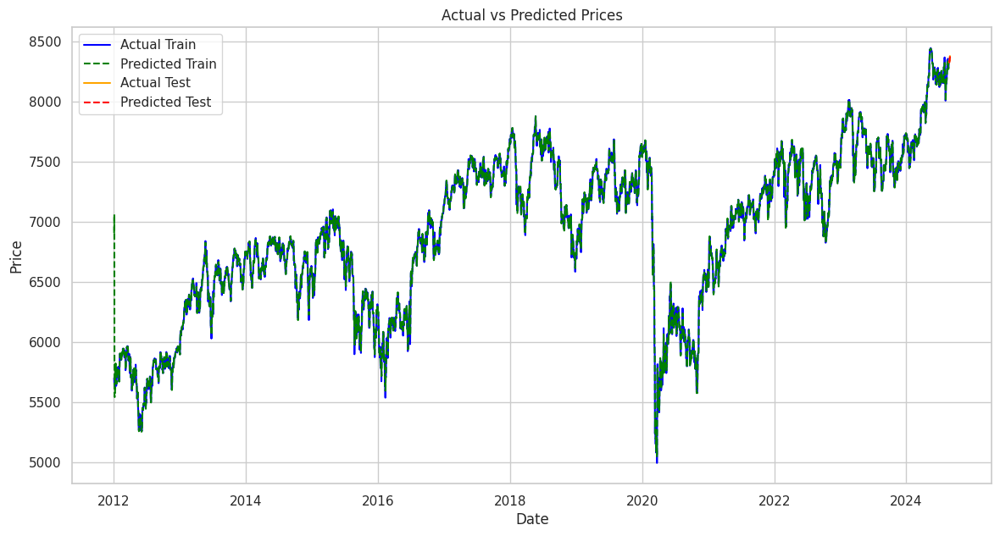

In [472]:
# Now you can use the ensemble model to make predictions
y_pred_train = ensemble.predict(X_train)
y_pred_test = ensemble.predict(X_test)

# Plot the actual vs predicted prices for the training and test sets
plt.figure(figsize=(14, 7))

# # Plot training data
plt.plot(y_train.index, y_train, label='Actual Train', color='blue')
plt.plot(y_train.index, y_pred_train, label='Predicted Train', linestyle='--', color='green')

# Plot test data
plt.plot(y_test.index, y_test, label='Actual Test', color='orange')
plt.plot(y_test.index, y_pred_test, label='Predicted Test', linestyle='--', color='red')

plt.title('Actual vs Predicted Prices')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend(loc='best')
plt.show()

Voting Regressor R² Score: 0.8704810930164578
Voting Regressor MSE: 56.68903576952421


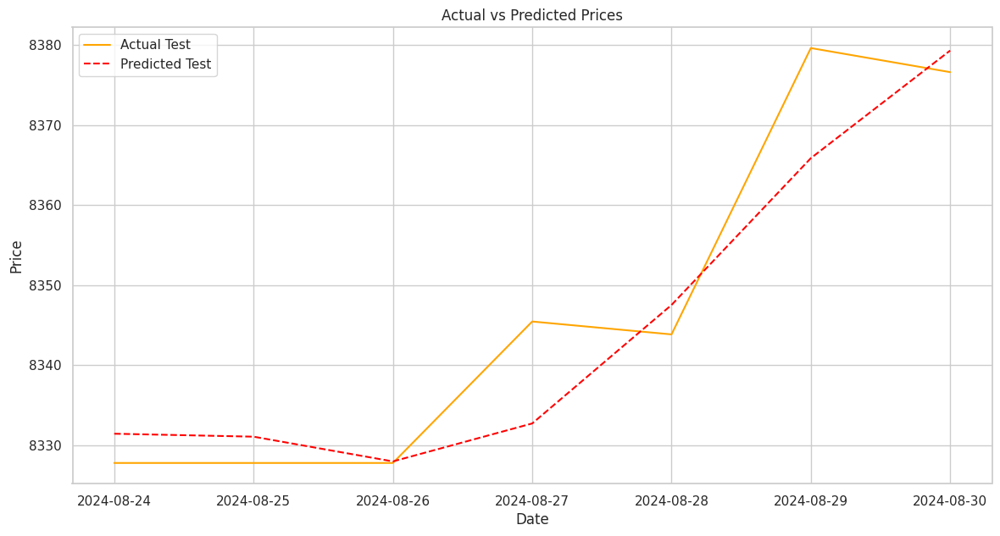

In [478]:
# Calculate R² score for the ensemble predictions
ensemble_r2_score = r2_score(y_test, y_pred_test)
ensemble_mse = mean_squared_error(y_test, y_pred_test)

# Print the ensemble predicted scores
print(f"Voting Regressor R² Score: {ensemble_r2_score}")
print(f"Voting Regressor MSE: {ensemble_mse}")

# Plot the actual vs predicted prices for the training and test sets
plt.figure(figsize=(14, 7))


# Plot test data
plt.plot(y_test.index, y_test, label='Actual Test', color='orange')
plt.plot(y_test.index, y_pred_test, label='Predicted Test', linestyle='--', color='red')

plt.title('Actual vs Predicted Prices')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend(loc='best')
plt.show()

In [474]:
# Print the top 3 models
print("Top 3 models based on R² score:")
for model_name, model_info in top_3_models:
    print(f"{model_name}: Best R² Score = {model_info['best_score']}, Best Params = {model_info['best_params']}")

Top 3 models based on R² score:
Lasso: Best R² Score = 0.9844279134616297, Best Params = {'model__alpha': 10.0}
ExponentialSmoothing: Best R² Score = -1.8628155272585794, Best Params = seasonal='add', seasonal_periods=12
Ridge: Best R² Score = -2.179194147572565, Best Params = {'model__alpha': 0.1}


In [ ]:
# Rank models by R² score (higher is better)
sorted_models = sorted(model_performance.items(), key=lambda x: x[1]['best_score'], reverse=True)
top_3_models = sorted_models[:3]
top_3_models_names = [model[0] for model in top_3_models]
top_3_models_names

['Lasso', 'ExponentialSmoothing', 'Ridge']

In [ ]:
# Assuming 'model_performance' has the results from GridSearchCV or custom fitting
fitted_models = {}

# Helper function to clean parameter names (only for dictionaries)
def clean_params(params):
    if isinstance(params, dict):
        return {k.replace("model__", ""): v for k, v in params.items()}
    return params  # Return as-is if not a dictionary

# Example loop to store the best models after fitting
for model_name, model_info in model_performance.items():
    # Skip models that are not included in the ensemble (like ARIMA)
    if model_name == "ARIMA":
        continue

    # Get the best parameters and clean them
    best_params = clean_params(model_info['best_params'])

    # Initialize and fit the model with the best parameters
    if model_name == "RandomForest":
        model = RandomForestRegressor(**best_params)
    elif model_name == "ExtraTrees":
        model = ExtraTreesRegressor(**best_params)
    elif model_name == "CatBoost":
        model = CatBoostRegressor(verbose=0, **best_params)
    elif model_name == "Ridge":
        model = Ridge(**best_params)

    elif model_name == "Lasso":
        model = Lasso(**best_params)
    elif model_name == "ElasticNet":
        model = ElasticNet(**best_params)

    # Fit the model on the training data
    model.fit(X_train, y_train)

    # Store the fitted model
    fitted_models[model_name] = model

# Assuming 'top_3_models' contains the names of the top 3 models as [(name, score), ...]
top_model_names = [model[0] for model in top_3_models]

# Create VotingRegressor using the fitted models
ensemble = VotingRegressor(estimators=[(name, fitted_models[name]) for name in top_model_names if name in fitted_models])
ensemble.fit(X_train, y_train)


VotingRegressor(estimators=[('Lasso', Lasso(alpha=10.0)),
                            ('ExponentialSmoothing',
                             ElasticNet(alpha=0.1, l1_ratio=0.8)),
                            ('Ridge', Ridge(alpha=0.1))])

In [ ]:
X_test = X_test.drop('date', axis=1)

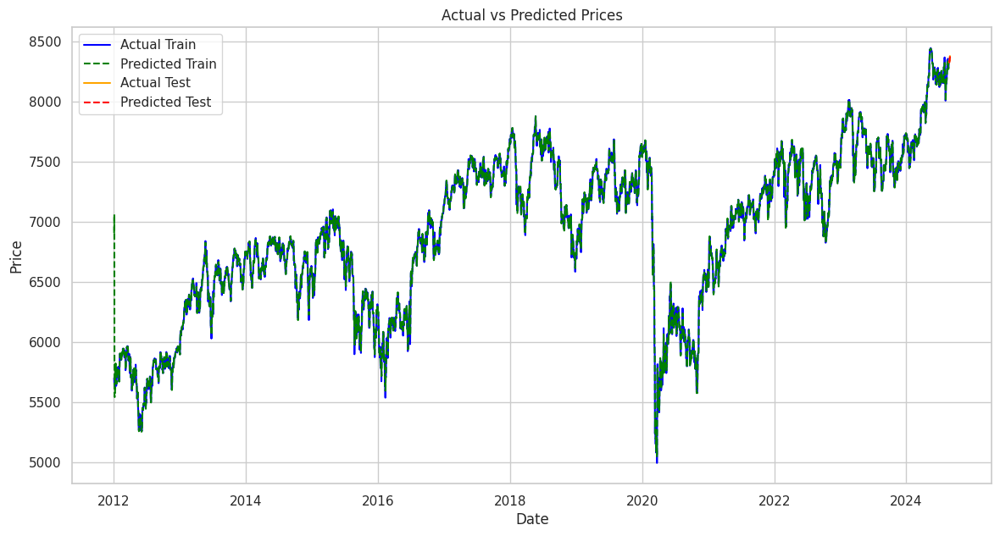

In [ ]:
# Now you can use the ensemble model to make predictions
y_pred_train = ensemble.predict(X_train)
y_pred_test = ensemble.predict(X_test)

# Plot the actual vs predicted prices for the training and test sets
plt.figure(figsize=(14, 7))

# # Plot training data
plt.plot(y_train.index, y_train, label='Actual Train', color='blue')
plt.plot(y_train.index, y_pred_train, label='Predicted Train', linestyle='--', color='green')

# Plot test data
plt.plot(y_test.index, y_test, label='Actual Test', color='orange')
plt.plot(y_test.index, y_pred_test, label='Predicted Test', linestyle='--', color='red')

plt.title('Actual vs Predicted Prices')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend(loc='best')
plt.show()

Voting Regressor R² Score: 0.8704810930164578
Voting Regressor MSE: 56.68903576952421


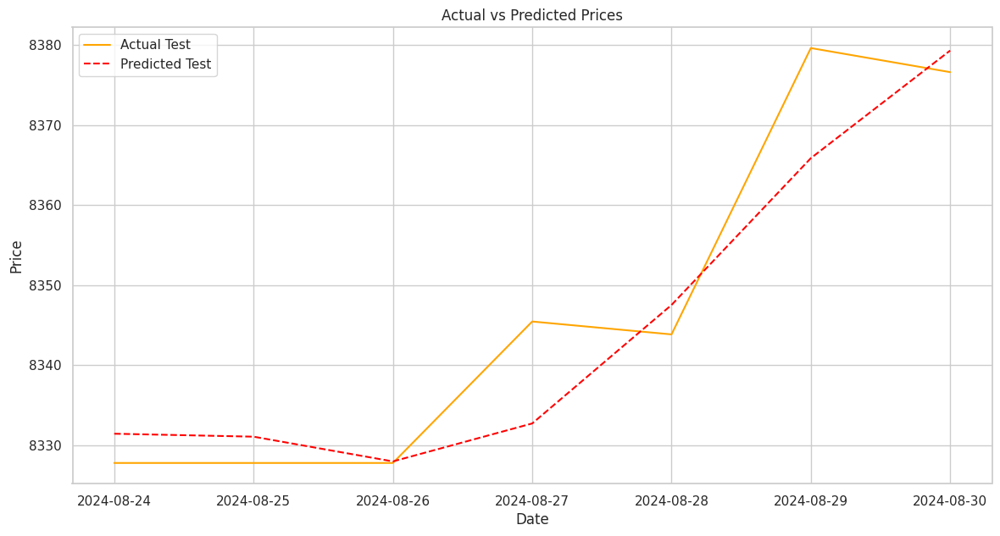

In [ ]:
# Calculate R² score for the ensemble predictions
ensemble_r2_score = r2_score(y_test, y_pred_test)
ensemble_mse = mean_squared_error(y_test, y_pred_test)

# Print the ensemble predicted scores
print(f"Voting Regressor R² Score: {ensemble_r2_score}")
print(f"Voting Regressor MSE: {ensemble_mse}")

# Plot the actual vs predicted prices for the training and test sets
plt.figure(figsize=(14, 7))


# Plot test data
plt.plot(y_test.index, y_test, label='Actual Test', color='orange')
plt.plot(y_test.index, y_pred_test, label='Predicted Test', linestyle='--', color='red')

plt.title('Actual vs Predicted Prices')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend(loc='best')
plt.show()

In [ ]:
# Print the top 3 models
print("Top 3 models based on R² score:")
for model_name, model_info in top_3_models:
    print(f"{model_name}: Best R² Score = {model_info['best_score']}, Best Params = {model_info['best_params']}")

Top 3 models based on R² score:
Lasso: Best R² Score = 0.9844279134616297, Best Params = {'model__alpha': 10.0}
ExponentialSmoothing: Best R² Score = -1.8628155272585794, Best Params = seasonal='add', seasonal_periods=12
Ridge: Best R² Score = -2.179194147572565, Best Params = {'model__alpha': 0.1}


In [340]:
# Save the best model (e.g., the ensemble model)
with open('ensemble_model.pkl', 'wb') as file:
    pickle.dump(ensemble, file)

ARIMA R² Score: -23.23521116207376


# For 4 Weeks

In [479]:
forecast_duration = 7*4 # 4 weeks

In [480]:
X = merged_df[combined_features]   # Your selected features DataFrame
y = merged_df['Price']  # Your target variable

In [481]:
# Assuming 'X' is your feature matrix and 'y' is the target variable (e.g., 'Price')

train_size = len(X) - forecast_duration

X.fillna(0,inplace=True)

# Split the data
X_train, X_test = X.iloc[:train_size], X.iloc[train_size:]
y_train, y_test = y.iloc[:train_size], y.iloc[train_size:]

In [486]:
# Create future dates for the next week
last_train_date = merged_df.index[-1]
# Create future dates DataFrame
future_dates = pd.date_range(start=last_train_date + timedelta(days=1), periods=forecast_duration, freq='D')
future_df = pd.DataFrame({'date': future_dates})
# future_df

In [483]:
X_test['date'] = future_df['date']
future_df = future_df.merge(X_test, on='date', how='left')
future_df['time_index'] = future_df['date']
future_df.drop(columns=['date'],inplace=True)
# Convert 'Date' to index
future_df.set_index('time_index', inplace=True)
future_df

,CARDINAL_two_RollingAvg_14d,Price_lag_10d,High_Low_Ratio_lag_10d,topic_14_lag_10d,vader_sentiment_lag_10d,textblob_sentiment_lag_10d,CARDINAL_million_lag_1d,CARDINAL_two_lag_4d,topic_12_RollingAvg_14d,High_Low_Ratio_lag_8d,...,textblob_sentiment_lag_1d,Price_Volume,vader_sentiment_lag_8d,TIME_night_RollingAvg_5d,topic_12_lag_10d,GPE_america,Price_lag_4d,CARDINAL_one,Price_RollingAvg_14d,QUANTITY_mile_RollingAvg_14d
time_index,,,,,,,,,,,,,,,,,,,,,
2024-08-31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2024-09-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2024-09-02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2024-09-03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2024-09-04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2024-09-05,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2024-09-06,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2024-09-07,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2024-09-08,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [484]:
# Append the future dates DataFrame to the original training DataFrame
train_df = pd.concat([X_train, future_df], ignore_index=False)
train_df

,CARDINAL_two_RollingAvg_14d,Price_lag_10d,High_Low_Ratio_lag_10d,topic_14_lag_10d,vader_sentiment_lag_10d,textblob_sentiment_lag_10d,CARDINAL_million_lag_1d,CARDINAL_two_lag_4d,topic_12_RollingAvg_14d,High_Low_Ratio_lag_8d,...,textblob_sentiment_lag_1d,Price_Volume,vader_sentiment_lag_8d,TIME_night_RollingAvg_5d,topic_12_lag_10d,GPE_america,Price_lag_4d,CARDINAL_one,Price_RollingAvg_14d,QUANTITY_mile_RollingAvg_14d
time_index,,,,,,,,,,,,,,,,,,,,,
2012-01-03,0.418569,6912.807491,1.011643,0.732206,-0.04862,0.065071,0.324853,0.418569,0.175606,1.011643,...,0.065071,4.437551e+06,-0.04862,0.232659,0.175606,0.51359,6912.807491,0.693194,6912.807491,0.126549
2012-01-04,0.418569,6912.807491,1.011643,0.732206,-0.04862,0.065071,0.324853,0.418569,0.175606,1.011643,...,0.065071,3.950570e+06,-0.04862,0.232659,0.175606,0.51359,6912.807491,0.693194,6912.807491,0.126549
2012-01-05,0.418569,6912.807491,1.011643,0.732206,-0.04862,0.065071,0.324853,0.418569,0.175606,1.011643,...,0.065071,4.467237e+06,-0.04862,0.232659,0.175606,0.51359,6912.807491,0.693194,6912.807491,0.126549
2012-01-06,0.418569,6912.807491,1.011643,0.732206,-0.04862,0.065071,0.324853,0.418569,0.175606,1.011643,...,0.065071,3.983137e+06,-0.04862,0.232659,0.175606,0.51359,6912.807491,0.693194,6912.807491,0.126549
2012-01-07,0.418569,6912.807491,1.011643,0.732206,-0.04862,0.065071,0.324853,0.418569,0.175606,1.011643,...,0.065071,3.983137e+06,-0.04862,0.232659,0.175606,0.51359,5699.910000,0.693194,6912.807491,0.126549
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-09-23,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2024-09-24,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2024-09-25,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [485]:
# Ensure no column name duplication
train_df.columns = train_df.columns.map(lambda x: x.strip())  # Strip any leading/trailing whitespace from column names
train_df = train_df.loc[:, ~train_df.columns.duplicated()]  # Remove duplicated columns

# Function to fill NaN values using the mean of the previous `forecast_duration` values
def fill_with_previous_forecast_duration(series, forecast_duration=7):
    filled_series = series.copy()
    for i in range(len(series)):
        if pd.isna(series.iloc[i]):  # Check if the current value is NaN
            # Get previous `forecast_duration` values
            previous_values = series[max(0, i-forecast_duration):i]
            if len(previous_values) > 0:  # Ensure there are values to calculate the mean
                # Calculate the mean of the previous values, ignoring NaN values
                mean_value = previous_values.mean()
                filled_series.iloc[i] = mean_value
    return filled_series

# Apply the function to each column in the DataFrame
for col in train_df.columns:
    # print(f"Processing column: {col}")
    train_df[col] = fill_with_previous_forecast_duration(train_df[col])

train_df

,CARDINAL_two_RollingAvg_14d,Price_lag_10d,High_Low_Ratio_lag_10d,topic_14_lag_10d,vader_sentiment_lag_10d,textblob_sentiment_lag_10d,CARDINAL_million_lag_1d,CARDINAL_two_lag_4d,topic_12_RollingAvg_14d,High_Low_Ratio_lag_8d,...,textblob_sentiment_lag_1d,Price_Volume,vader_sentiment_lag_8d,TIME_night_RollingAvg_5d,topic_12_lag_10d,GPE_america,Price_lag_4d,CARDINAL_one,Price_RollingAvg_14d,QUANTITY_mile_RollingAvg_14d
time_index,,,,,,,,,,,,,,,,,,,,,
2012-01-03,0.418569,6912.807491,1.011643,0.732206,-0.04862,0.065071,0.324853,0.418569,0.175606,1.011643,...,0.065071,4.437551e+06,-0.04862,0.232659,0.175606,0.51359,6912.807491,0.693194,6912.807491,0.126549
2012-01-04,0.418569,6912.807491,1.011643,0.732206,-0.04862,0.065071,0.324853,0.418569,0.175606,1.011643,...,0.065071,3.950570e+06,-0.04862,0.232659,0.175606,0.51359,6912.807491,0.693194,6912.807491,0.126549
2012-01-05,0.418569,6912.807491,1.011643,0.732206,-0.04862,0.065071,0.324853,0.418569,0.175606,1.011643,...,0.065071,4.467237e+06,-0.04862,0.232659,0.175606,0.51359,6912.807491,0.693194,6912.807491,0.126549
2012-01-06,0.418569,6912.807491,1.011643,0.732206,-0.04862,0.065071,0.324853,0.418569,0.175606,1.011643,...,0.065071,3.983137e+06,-0.04862,0.232659,0.175606,0.51359,6912.807491,0.693194,6912.807491,0.126549
2012-01-07,0.418569,6912.807491,1.011643,0.732206,-0.04862,0.065071,0.324853,0.418569,0.175606,1.011643,...,0.065071,3.983137e+06,-0.04862,0.232659,0.175606,0.51359,5699.910000,0.693194,6912.807491,0.126549
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-09-23,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2024-09-24,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2024-09-25,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [487]:
train_df.fillna(method='ffill', inplace=True)
train_df = train_df.fillna(train_df.mean(numeric_only=True))
train_df

,CARDINAL_two_RollingAvg_14d,Price_lag_10d,High_Low_Ratio_lag_10d,topic_14_lag_10d,vader_sentiment_lag_10d,textblob_sentiment_lag_10d,CARDINAL_million_lag_1d,CARDINAL_two_lag_4d,topic_12_RollingAvg_14d,High_Low_Ratio_lag_8d,...,textblob_sentiment_lag_1d,Price_Volume,vader_sentiment_lag_8d,TIME_night_RollingAvg_5d,topic_12_lag_10d,GPE_america,Price_lag_4d,CARDINAL_one,Price_RollingAvg_14d,QUANTITY_mile_RollingAvg_14d
time_index,,,,,,,,,,,,,,,,,,,,,
2012-01-03,0.418569,6912.807491,1.011643,0.732206,-0.04862,0.065071,0.324853,0.418569,0.175606,1.011643,...,0.065071,4.437551e+06,-0.04862,0.232659,0.175606,0.51359,6912.807491,0.693194,6912.807491,0.126549
2012-01-04,0.418569,6912.807491,1.011643,0.732206,-0.04862,0.065071,0.324853,0.418569,0.175606,1.011643,...,0.065071,3.950570e+06,-0.04862,0.232659,0.175606,0.51359,6912.807491,0.693194,6912.807491,0.126549
2012-01-05,0.418569,6912.807491,1.011643,0.732206,-0.04862,0.065071,0.324853,0.418569,0.175606,1.011643,...,0.065071,4.467237e+06,-0.04862,0.232659,0.175606,0.51359,6912.807491,0.693194,6912.807491,0.126549
2012-01-06,0.418569,6912.807491,1.011643,0.732206,-0.04862,0.065071,0.324853,0.418569,0.175606,1.011643,...,0.065071,3.983137e+06,-0.04862,0.232659,0.175606,0.51359,6912.807491,0.693194,6912.807491,0.126549
2012-01-07,0.418569,6912.807491,1.011643,0.732206,-0.04862,0.065071,0.324853,0.418569,0.175606,1.011643,...,0.065071,3.983137e+06,-0.04862,0.232659,0.175606,0.51359,5699.910000,0.693194,6912.807491,0.126549
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-09-23,0.000000,8167.370000,1.009402,1.000000,0.72690,0.000000,0.000000,0.000000,0.000000,1.016323,...,0.000000,1.005489e+07,0.72690,0.000000,0.000000,0.00000,8292.350000,0.000000,8233.397857,0.000000
2024-09-24,0.000000,8167.370000,1.009402,1.000000,0.72690,0.000000,0.000000,0.000000,0.000000,1.016323,...,0.000000,1.005489e+07,0.72690,0.000000,0.000000,0.00000,8292.350000,0.000000,8233.397857,0.000000
2024-09-25,0.000000,8167.370000,1.009402,1.000000,0.72690,0.000000,0.000000,0.000000,0.000000,1.016323,...,0.000000,1.005489e+07,0.72690,0.000000,0.000000,0.00000,8292.350000,0.000000,8233.397857,0.000000


**Y_train replace with created features as a real scenario**

In [488]:
x_test = train_df.iloc[train_size:]
x_test

,CARDINAL_two_RollingAvg_14d,Price_lag_10d,High_Low_Ratio_lag_10d,topic_14_lag_10d,vader_sentiment_lag_10d,textblob_sentiment_lag_10d,CARDINAL_million_lag_1d,CARDINAL_two_lag_4d,topic_12_RollingAvg_14d,High_Low_Ratio_lag_8d,...,textblob_sentiment_lag_1d,Price_Volume,vader_sentiment_lag_8d,TIME_night_RollingAvg_5d,topic_12_lag_10d,GPE_america,Price_lag_4d,CARDINAL_one,Price_RollingAvg_14d,QUANTITY_mile_RollingAvg_14d
time_index,,,,,,,,,,,,,,,,,,,,,
2024-08-31,0.0,8175.094286,1.008088,1.0,0.7269,0.0,0.0,0.0,0.0,1.008782,...,0.0,6.776447e+06,0.7269,0.0,0.0,0.0,8236.698571,0.0,8214.943980,0.0
2024-09-01,0.0,8173.033333,1.007955,1.0,0.7269,0.0,0.0,0.0,0.0,1.009238,...,0.0,6.996401e+06,0.7269,0.0,0.0,0.0,8248.253333,0.0,8218.174048,0.0
2024-09-02,0.0,8166.662000,1.007584,1.0,0.7269,0.0,0.0,0.0,0.0,1.009877,...,0.0,7.304338e+06,0.7269,0.0,0.0,0.0,8267.166000,0.0,8222.227571,0.0
2024-09-03,0.0,8169.397500,1.007969,1.0,0.7269,0.0,0.0,0.0,0.0,1.010835,...,0.0,7.513911e+06,0.7269,0.0,0.0,0.0,8287.370000,0.0,8226.354464,0.0
2024-09-04,0.0,8173.956667,1.008610,1.0,0.7269,0.0,0.0,0.0,0.0,1.010985,...,0.0,8.134520e+06,0.7269,0.0,0.0,0.0,8287.923333,0.0,8230.625238,0.0
2024-09-05,0.0,8183.075000,1.009892,1.0,0.7269,0.0,0.0,0.0,0.0,1.011777,...,0.0,8.692626e+06,0.7269,0.0,0.0,0.0,8289.030000,0.0,8232.719643,0.0
2024-09-06,0.0,8167.370000,1.009402,1.0,0.7269,0.0,0.0,0.0,0.0,1.016323,...,0.0,1.005489e+07,0.7269,0.0,0.0,0.0,8292.350000,0.0,8233.397857,0.0
2024-09-07,0.0,8167.370000,1.009402,1.0,0.7269,0.0,0.0,0.0,0.0,1.016323,...,0.0,1.005489e+07,0.7269,0.0,0.0,0.0,8292.350000,0.0,8233.397857,0.0
2024-09-08,0.0,8167.370000,1.009402,1.0,0.7269,0.0,0.0,0.0,0.0,1.016323,...,0.0,1.005489e+07,0.7269,0.0,0.0,0.0,8292.350000,0.0,8233.397857,0.0


In [489]:
# Define the models with hyperparameter grids for GridSearchCV
model_params = {

    "Ridge": {
        "model": Ridge(),
        "params": {
            "model__alpha": [0.1, 1.0, 10.0, 100.0]
        }
    },
    "Lasso": {
        "model": Lasso(),
        "params": {
            "model__alpha": [0.1, 1.0, 10.0, 100.0]
        }
    },
    "ElasticNet": {
        "model": ElasticNet(),
        "params": {
            "model__alpha": [0.1, 1.0, 10.0],
            "model__l1_ratio": [0.2, 0.5, 0.8]
        }
    }
}

# # Define the models with hyperparameter grids for GridSearchCV
# model_params = {
#      "ElasticNet": {
#         "model": ElasticNet(),
#         "params": {
#             "model__alpha": [0.1, 1.0, 10.0],
#             "model__l1_ratio": [0.2, 0.5, 0.8]
#         }
#     },
#     "Ridge": {
#         "model": Ridge(),
#         "params": {
#             'model__alpha': [0.01, 0.1, 1, 10],
#             'model__fit_intercept': [True, False],
#             'model__max_iter': [100, 1000],
#             'model__solver': ['auto', 'svd', 'cholesky', 'lsqr', 'saga']
#         }
#     },
#     "Lasso": {
#         "model": Lasso(),
#         "params": {
#             'model__alpha': [0.001, 0.01, 0.1, 1.0],
#             'model__fit_intercept': [True, False],
#             'model__max_iter': [100, 1000],
#             'model__selection': ['cyclic', 'random']
#         }
#     }
# }

In [490]:
X_train.shape, y_train.shape, X_test.shape, y_test.shape

((4596, 97), (4596,), (28, 98), (28,))

In [491]:
# Standardize the features
scaler = StandardScaler()

# Dictionary to store model performance
model_performance = {}

# Scorer for GridSearchCV using R² score
scorer = make_scorer(r2_score)

# Loop through the models
for name, mp in model_params.items():
    pipeline = Pipeline([
        ('scaler', scaler),
        ('model', mp['model'])
    ])
    try:
      grid = GridSearchCV(pipeline, mp['params'], cv=5, scoring=scorer, n_jobs=-1)
      grid.fit(X_train, y_train)

      best_score = grid.best_score_
      best_params = grid.best_params_
      print(f"{name} - Best Score: {best_score}, Best Params: {best_params}")

      model_performance[name] = {
          "best_score": best_score,
          "best_params": best_params,
          "best_estimator": grid.best_estimator_
      }
    except:
      print(name)

Ridge - Best Score: -2.469967224034974, Best Params: {'model__alpha': 0.1}
Lasso - Best Score: 0.98411731253813, Best Params: {'model__alpha': 10.0}
ElasticNet - Best Score: -35.20674621647622, Best Params: {'model__alpha': 0.1, 'model__l1_ratio': 0.8}


In [492]:
from statsmodels.tsa.arima.model import ARIMA
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import r2_score
import numpy as np

# Example function to perform time series cross-validation for ARIMA
def time_series_cross_val_score_arima(y, exog=None, order=(1, 1, 1), cv=5):
    tscv = TimeSeriesSplit(n_splits=cv)
    scores = []

    for train_index, test_index in tscv.split(y):
        y_train, y_test = y.iloc[train_index], y.iloc[test_index]
        exog_train = exog.iloc[train_index] if exog is not None else None
        exog_test = exog.iloc[test_index] if exog is not None else None

        # Initialize the ARIMA model with exogenous variables
        model = ARIMA(y_train, order=order, exog=exog_train)
        model_fit = model.fit()
        y_pred = model_fit.predict(start=len(y_train), end=len(y_train) + len(y_test) - 1, exog=exog_test)

        score = r2_score(y_test, y_pred)
        scores.append(score)

    return np.mean(scores)
try:

  # Assuming 'Price' is the target variable (y) and X_time_series contains exogenous variables
  arima_order = (5, 1, 0)  # You can change this to suit your data
  arima_score = time_series_cross_val_score_arima(y, exog=X_final, order=arima_order)

  # Store the ARIMA model performance
  model_performance["ARIMA"] = {"best_score": arima_score, "best_params": f"order={arima_order}"}

  print(f"ARIMA R² Score: {arima_score}")
except:
  pass

In [493]:
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import r2_score
import numpy as np

def time_series_cross_val_score_exp_smoothing(y, seasonal='add', seasonal_periods=12, cv=5):
    tscv = TimeSeriesSplit(n_splits=cv)
    scores = []

    for train_index, test_index in tscv.split(y):
        y_train, y_test = y.iloc[train_index], y.iloc[test_index]

        # Initialize and fit the Exponential Smoothing model
        model = ExponentialSmoothing(y_train, seasonal=seasonal, seasonal_periods=seasonal_periods)
        model_fit = model.fit()

        # Predict on the test set
        y_pred = model_fit.forecast(len(y_test))

        # Calculate R² score
        score = r2_score(y_test, y_pred)
        scores.append(score)

    return np.mean(scores)

# Assuming 'y' is your target variable (e.g., 'Price')
exp_smooth_score = time_series_cross_val_score_exp_smoothing(y, seasonal='add', seasonal_periods=12)

# Store the model performance
model_performance["ExponentialSmoothing"] = {"best_score": exp_smooth_score, "best_params": "seasonal='add', seasonal_periods=12"}

print(f"Exponential Smoothing R² Score: {exp_smooth_score}")


Exponential Smoothing R² Score: -1.8628155272585794


In [494]:
model_performance

{'Ridge': {'best_score': -2.469967224034974,
  'best_params': {'model__alpha': 0.1},
  'best_estimator': Pipeline(steps=[('scaler', StandardScaler()), ('model', Ridge(alpha=0.1))])},
 'Lasso': {'best_score': 0.98411731253813,
  'best_params': {'model__alpha': 10.0},
  'best_estimator': Pipeline(steps=[('scaler', StandardScaler()), ('model', Lasso(alpha=10.0))])},
 'ElasticNet': {'best_score': -35.20674621647622,
  'best_params': {'model__alpha': 0.1, 'model__l1_ratio': 0.8},
  'best_estimator': Pipeline(steps=[('scaler', StandardScaler()),
                  ('model', ElasticNet(alpha=0.1, l1_ratio=0.8))])},
 'ExponentialSmoothing': {'best_score': -1.8628155272585794,
  'best_params': "seasonal='add', seasonal_periods=12"}}

In [495]:
# Rank models by R² score (higher is better)
sorted_models = sorted(model_performance.items(), key=lambda x: x[1]['best_score'], reverse=True)
top_3_models = sorted_models[:3]
top_3_models_names = [model[0] for model in top_3_models]
top_3_models_names

['Lasso', 'ExponentialSmoothing', 'Ridge']

In [496]:
# Assuming 'model_performance' has the results from GridSearchCV or custom fitting
fitted_models = {}

# Helper function to clean parameter names (only for dictionaries)
def clean_params(params):
    if isinstance(params, dict):
        return {k.replace("model__", ""): v for k, v in params.items()}
    return params  # Return as-is if not a dictionary

# Example loop to store the best models after fitting
for model_name, model_info in model_performance.items():
    # Skip models that are not included in the ensemble (like ARIMA)
    if model_name == "ARIMA":
        continue

    # Get the best parameters and clean them
    best_params = clean_params(model_info['best_params'])

    # Initialize and fit the model with the best parameters
    if model_name == "RandomForest":
        model = RandomForestRegressor(**best_params)
    elif model_name == "ExtraTrees":
        model = ExtraTreesRegressor(**best_params)
    elif model_name == "CatBoost":
        model = CatBoostRegressor(verbose=0, **best_params)
    elif model_name == "Ridge":
        model = Ridge(**best_params)

    elif model_name == "Lasso":
        model = Lasso(**best_params)
    elif model_name == "ElasticNet":
        model = ElasticNet(**best_params)

    # Fit the model on the training data
    model.fit(X_train, y_train)

    # Store the fitted model
    fitted_models[model_name] = model

# Assuming 'top_3_models' contains the names of the top 3 models as [(name, score), ...]
top_model_names = [model[0] for model in top_3_models]

# Create VotingRegressor using the fitted models
ensemble = VotingRegressor(estimators=[(name, fitted_models[name]) for name in top_model_names if name in fitted_models])
ensemble.fit(X_train, y_train)


VotingRegressor(estimators=[('Lasso', Lasso(alpha=10.0)),
                            ('ExponentialSmoothing',
                             ElasticNet(alpha=0.1, l1_ratio=0.8)),
                            ('Ridge', Ridge(alpha=0.1))])

In [497]:
X_test = X_test.drop('date', axis=1)

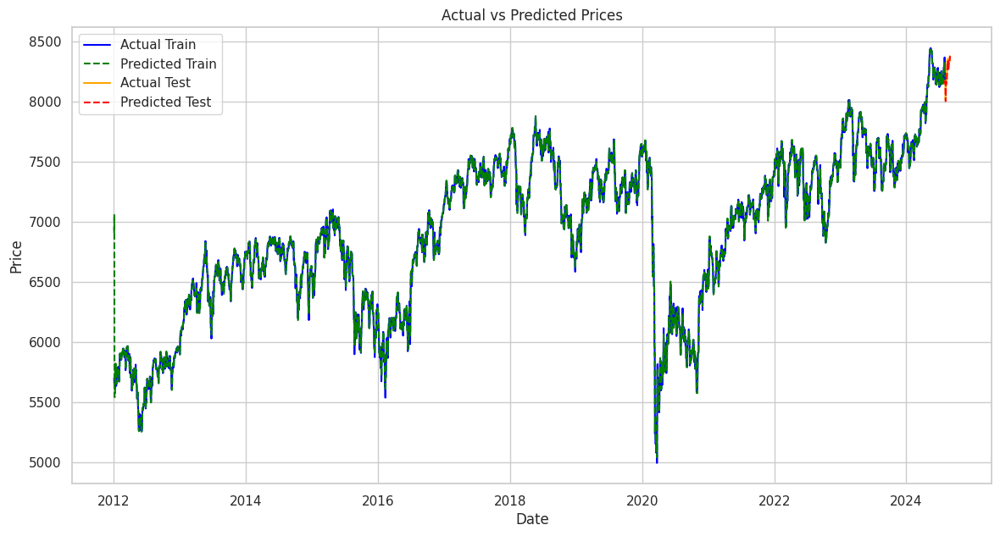

In [498]:
# Now you can use the ensemble model to make predictions
y_pred_train = ensemble.predict(X_train)
y_pred_test = ensemble.predict(X_test)

# Plot the actual vs predicted prices for the training and test sets
plt.figure(figsize=(14, 7))

# # Plot training data
plt.plot(y_train.index, y_train, label='Actual Train', color='blue')
plt.plot(y_train.index, y_pred_train, label='Predicted Train', linestyle='--', color='green')

# Plot test data
plt.plot(y_test.index, y_test, label='Actual Test', color='orange')
plt.plot(y_test.index, y_pred_test, label='Predicted Test', linestyle='--', color='red')

plt.title('Actual vs Predicted Prices')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend(loc='best')
plt.show()

Voting Regressor R² Score: 0.9498315969304048
Voting Regressor MSE: 483.37237699900385


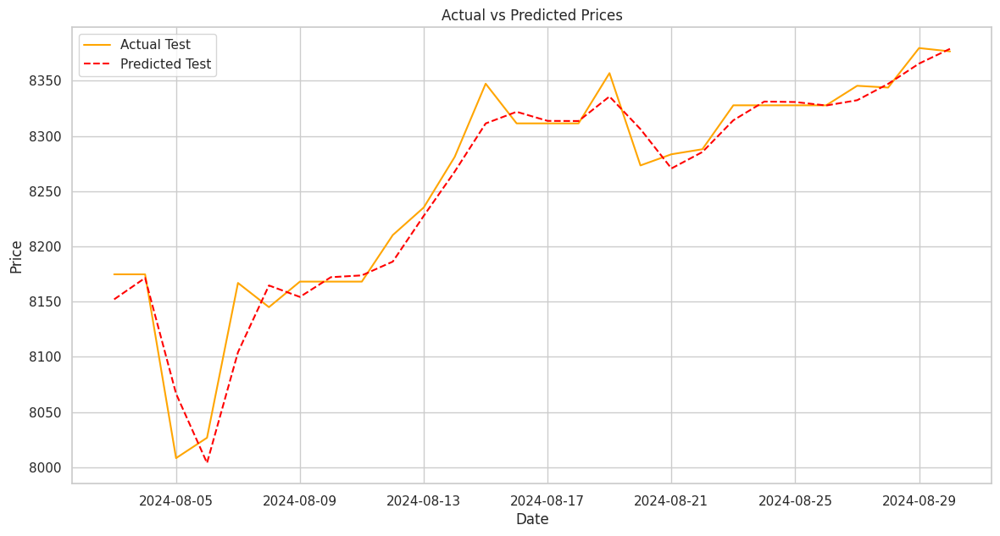

In [499]:
# Calculate R² score for the ensemble predictions
ensemble_r2_score = r2_score(y_test, y_pred_test)
ensemble_mse = mean_squared_error(y_test, y_pred_test)

# Print the ensemble predicted scores
print(f"Voting Regressor R² Score: {ensemble_r2_score}")
print(f"Voting Regressor MSE: {ensemble_mse}")

# Plot the actual vs predicted prices for the training and test sets
plt.figure(figsize=(14, 7))


# Plot test data
plt.plot(y_test.index, y_test, label='Actual Test', color='orange')
plt.plot(y_test.index, y_pred_test, label='Predicted Test', linestyle='--', color='red')

plt.title('Actual vs Predicted Prices')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend(loc='best')
plt.show()

In [ ]:
# Print the top 3 models
print("Top 3 models based on R² score:")
for model_name, model_info in top_3_models:
    print(f"{model_name}: Best R² Score = {model_info['best_score']}, Best Params = {model_info['best_params']}")

Top 3 models based on R² score:
Lasso: Best R² Score = 0.9844279134616297, Best Params = {'model__alpha': 10.0}
ExponentialSmoothing: Best R² Score = -1.8628155272585794, Best Params = seasonal='add', seasonal_periods=12
Ridge: Best R² Score = -2.179194147572565, Best Params = {'model__alpha': 0.1}


# More Models & Parameters

In [48]:
forecast_duration = 7

In [49]:
X = merged_df[combined_features]   # Your selected features DataFrame
y = merged_df['Price']  # Your target variable

NameError: name 'combined_features' is not defined

In [108]:
# Assuming 'X' is your feature matrix and 'y' is the target variable (e.g., 'Price')

train_size = len(X) - forecast_duration

X.fillna(0,inplace=True)

# Split the data
X_train, X_test = X.iloc[:train_size], X.iloc[train_size:]
y_train, y_test = y.iloc[:train_size], y.iloc[train_size:]

In [109]:
# Create future dates for the next week
last_train_date = merged_df.index[-1]
# Create future dates DataFrame
future_dates = pd.date_range(start=last_train_date + timedelta(days=1), periods=forecast_duration, freq='D')
future_df = pd.DataFrame({'date': future_dates})
# future_df

In [110]:
X_test['date'] = future_df['date']
future_df = future_df.merge(X_test, on='date', how='left')
future_df['time_index'] = future_df['date']
future_df.drop(columns=['date'],inplace=True)
# Convert 'Date' to index
future_df.set_index('time_index', inplace=True)
future_df

,High_Low_Ratio_RollingAvg_5d,Price_Per_Volume,High_Low_Ratio_lag_1d,vader_sentiment_lag_8d,TIME_hour_RollingAvg_5d,is_event_lag_2d,High_Low_Ratio_RollingAvg_7d,topic_15_RollingAvg_3d,vader_sentiment,Vol._lag_10d,...,TIME_hour_RollingAvg_7d,NORP_russian_lag_10d,CARDINAL_three_RollingAvg_14d,textblob_sentiment_lag_1d,Vol._lag_4d,GPE_london_RollingAvg_7d,Vol._RollingAvg_7d,High_Low_Ratio_lag_2d,vader_sentiment_lag_2d,vader_sentiment_lag_4d
time_index,,,,,,,,,,,,,,,,,,,,,
2024-05-10,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2024-05-11,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2024-05-12,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2024-05-13,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2024-05-14,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2024-05-15,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2024-05-16,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [111]:
# Append the future dates DataFrame to the original training DataFrame
train_df = pd.concat([X_train, future_df], ignore_index=False)
train_df

,High_Low_Ratio_RollingAvg_5d,Price_Per_Volume,High_Low_Ratio_lag_1d,vader_sentiment_lag_8d,TIME_hour_RollingAvg_5d,is_event_lag_2d,High_Low_Ratio_RollingAvg_7d,topic_15_RollingAvg_3d,vader_sentiment,Vol._lag_10d,...,TIME_hour_RollingAvg_7d,NORP_russian_lag_10d,CARDINAL_three_RollingAvg_14d,textblob_sentiment_lag_1d,Vol._lag_4d,GPE_london_RollingAvg_7d,Vol._RollingAvg_7d,High_Low_Ratio_lag_2d,vader_sentiment_lag_2d,vader_sentiment_lag_4d
time_index,,,,,,,,,,,,,,,,,,,,,
2012-01-03,1.011513,7.321375,1.011513,-0.044404,0.174629,0.9952,1.011513,0.046136,0.9945,796.170823,...,0.174629,0.143771,0.2368,0.066003,796.170823,0.098514,796.170823,1.011513,-0.044404,-0.044404
2012-01-04,1.011513,8.133340,1.022904,-0.044404,0.174629,0.9952,1.011513,0.046136,0.9915,796.170823,...,0.174629,0.143771,0.2368,0.102829,796.170823,0.098514,796.170823,1.011513,-0.044404,-0.044404
2012-01-05,1.011513,7.080954,1.013012,-0.044404,0.174629,1.0000,1.011513,0.019143,0.9828,796.170823,...,0.174629,0.143771,0.2368,0.125633,796.170823,0.098514,796.170823,1.022904,0.994500,-0.044404
2012-01-06,1.011513,8.013503,1.013350,-0.044404,0.174629,1.0000,1.011513,0.012276,0.9969,796.170823,...,0.174629,0.143771,0.2368,0.100445,796.170823,0.098514,796.170823,1.013012,0.991500,-0.044404
2012-01-07,1.014080,8.013503,1.010567,-0.044404,0.200000,1.0000,1.011513,0.073209,0.9968,796.170823,...,0.174629,0.143771,0.2368,0.285534,778.530000,0.098514,796.170823,1.013350,0.982800,0.994500
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-05-12,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2024-05-13,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2024-05-14,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [112]:
# Ensure no column name duplication
train_df.columns = train_df.columns.map(lambda x: x.strip())  # Strip any leading/trailing whitespace from column names
train_df = train_df.loc[:, ~train_df.columns.duplicated()]  # Remove duplicated columns

# Function to fill NaN values using the mean of the previous `forecast_duration` values
def fill_with_previous_forecast_duration(series, forecast_duration=7):
    filled_series = series.copy()
    for i in range(len(series)):
        if pd.isna(series.iloc[i]):  # Check if the current value is NaN
            # Get previous `forecast_duration` values
            previous_values = series[max(0, i-forecast_duration):i]
            if len(previous_values) > 0:  # Ensure there are values to calculate the mean
                # Calculate the mean of the previous values, ignoring NaN values
                mean_value = previous_values.mean()
                filled_series.iloc[i] = mean_value
    return filled_series

# Apply the function to each column in the DataFrame
for col in train_df.columns:
    # print(f"Processing column: {col}")
    train_df[col] = fill_with_previous_forecast_duration(train_df[col])

train_df

,High_Low_Ratio_RollingAvg_5d,Price_Per_Volume,High_Low_Ratio_lag_1d,vader_sentiment_lag_8d,TIME_hour_RollingAvg_5d,is_event_lag_2d,High_Low_Ratio_RollingAvg_7d,topic_15_RollingAvg_3d,vader_sentiment,Vol._lag_10d,...,TIME_hour_RollingAvg_7d,NORP_russian_lag_10d,CARDINAL_three_RollingAvg_14d,textblob_sentiment_lag_1d,Vol._lag_4d,GPE_london_RollingAvg_7d,Vol._RollingAvg_7d,High_Low_Ratio_lag_2d,vader_sentiment_lag_2d,vader_sentiment_lag_4d
time_index,,,,,,,,,,,,,,,,,,,,,
2012-01-03,1.011513,7.321375,1.011513,-0.044404,0.174629,0.9952,1.011513,0.046136,0.994500,796.170823,...,0.174629,0.143771,0.236800,0.066003,796.170823,0.098514,796.170823,1.011513,-0.044404,-0.044404
2012-01-04,1.011513,8.133340,1.022904,-0.044404,0.174629,0.9952,1.011513,0.046136,0.991500,796.170823,...,0.174629,0.143771,0.236800,0.102829,796.170823,0.098514,796.170823,1.011513,-0.044404,-0.044404
2012-01-05,1.011513,7.080954,1.013012,-0.044404,0.174629,1.0000,1.011513,0.019143,0.982800,796.170823,...,0.174629,0.143771,0.236800,0.125633,796.170823,0.098514,796.170823,1.022904,0.994500,-0.044404
2012-01-06,1.011513,8.013503,1.013350,-0.044404,0.174629,1.0000,1.011513,0.012276,0.996900,796.170823,...,0.174629,0.143771,0.236800,0.100445,796.170823,0.098514,796.170823,1.013012,0.991500,-0.044404
2012-01-07,1.014080,8.013503,1.010567,-0.044404,0.200000,1.0000,1.011513,0.073209,0.996800,796.170823,...,0.174629,0.143771,0.236800,0.285534,778.530000,0.098514,796.170823,1.013350,0.982800,0.994500
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-05-12,1.012644,8.881387,1.013312,-0.609080,0.200000,1.0000,1.011803,0.317073,0.013420,946.448000,...,0.142857,0.200000,0.014286,0.100617,955.388000,0.000000,923.574571,1.014074,0.070560,-0.186200
2024-05-13,1.012935,8.718409,1.012817,-0.793350,0.200000,1.0000,1.011995,0.223125,0.258350,923.060000,...,0.142857,0.250000,0.017857,0.192437,964.350000,0.000000,924.742857,1.014955,-0.073950,-0.012575
2024-05-14,1.013322,7.888490,1.011992,-0.756400,0.200000,1.0000,1.012523,0.162401,0.077133,874.080000,...,0.142857,0.333333,0.023810,0.217143,912.466667,0.000000,934.470476,1.014843,0.092033,-0.296533


In [113]:
train_df.fillna(method='ffill', inplace=True)
train_df = train_df.fillna(train_df.mean(numeric_only=True))
# train_df

**Y_train replace with created features as a real scenario**

In [114]:
x_test = train_df.iloc[train_size:]
# x_test

In [115]:
from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet
from sklearn.ensemble import RandomForestRegressor, ExtraTreesRegressor, VotingRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.svm import SVR
from catboost import CatBoostRegressor
import xgboost as xgb
import lightgbm as lgb

# Define the models with hyperparameter grids for GridSearchCV
model_params = {

    "CatBoost": {
        "model": CatBoostRegressor(verbose=0),
        "params": {
            'model__iterations': [100,500,1000],
            'model__learning_rate': [0.01, 0.05, 0.1],
#             'model__depth': [2, 6, 10],
#             'model__l2_leaf_reg': [1, 3, 5],
#             'model__random_strength': [0.5, 1.0, 2.0],
#             'model__bagging_temperature': [0.0, 0.5, 1.0],
        }
    },

    "LinearRegression": {
        "model": LinearRegression(),
        "params": {
            'model__fit_intercept': [True, False],
            'model__copy_X': [True, False]
        }
    },

    "Ridge": {
        "model": Ridge(),
        "params": {
            'model__alpha': [0.01, 0.1, 1, 10],
            'model__copy_X': [True, False],
            'model__fit_intercept': [True, False],
#             'model__max_iter': [10, 100, 1000],
#             'model__positive': [True, False],
#             'model__solver': ['auto']
        }
    },

    "Lasso": {
        "model": Lasso(),
        "params": {
            'model__alpha': [0.001, 0.01, 0.1, 1.0, 10.0],
            'model__copy_X': [True, False],
            'model__fit_intercept': [True, False],
#             'model__max_iter': [10, 100, 1000],
#             'model__positive': [True, False],
#             'model__precompute': [True, False],
#             'model__selection': ['cyclic', 'random'],
#             'model__warm_start': [True, False]
        }
    },

    "RandomForestRegressor": {
        "model": RandomForestRegressor(),
        "params": {
            'model__n_estimators': [80, 120],
            'model__criterion': ['squared_error', 'absolute_error'],  # Updated valid options
#             'model__max_depth': [1, 3],
#             'model__max_features': ['sqrt', 'log2', 0.5, 'auto'],
#             'model__min_samples_split': [2, 5],
#             'model__warm_start': [True, False],
#             'model__ccp_alpha': [0, 1]
        }
    },

    "XGBRegressor": {
        "model": xgb.XGBRegressor(random_state=42, objective='reg:squarederror'),
        "params": {
            'model__learning_rate': [0.01, 0.1],
            'model__n_estimators': [10, 600],
#             'model__max_depth': [1, 7],
#             'model__subsample': [0.7, 0.5],
#             'model__colsample_bytree': [0.8, 1]
        }
    },

    "ExtraTreesRegressor": {
        "model": ExtraTreesRegressor(),
        "params": {
            'model__bootstrap': [True],
            'model__ccp_alpha': [0.001, 1, 10],
#             'model__criterion': ['squared_error'],  # Updated to valid option
#             'model__max_depth': [2, 3, 4],
#             'model__max_features': ['auto'],
#             'model__n_estimators': [90, 120],
#             'model__min_samples_split': [8, 12],
#             'model__warm_start': [True, False]
        }
    },

    "LGBMRegressor": {
        "model": lgb.LGBMRegressor(),
        "params": {
            'model__max_depth': [1, 3],
            'model__n_estimators': [20, 30, 40],
#             'model__force_col_wise': [True],
#             'model__class_weight': [None, 'balanced'],
#             'model__colsample_bytree': [0.5, 0.8],
#             'model__reg_alpha': [0.1, 0.01],
#             "model__verbosity": [0]
        }
    },

    "ElasticNet": {
        "model": ElasticNet(),
        "params": {
            'model__alpha': [0.5, 1, 2],
            'model__warm_start': [True, False],
#             'model__l1_ratio': [0.9, 1],
#             'model__normalize': [True, False],
#             'model__fit_intercept': [True, False],
#             'model__positive': [True, False],
#             'model__precompute': [True, False],
#             'model__selection': ['cyclic', 'random']
        }
    },

    "DecisionTreeRegressor": {
        "model": DecisionTreeRegressor(),
        "params": {
            'model__ccp_alpha': [0, 0.1, 0.01, 1, 10],
            'model__max_depth': [2, 3, 4],
#             'model__min_samples_split': [2, 3, 10],
#             'model__min_samples_leaf': [1, 5, 10],
#             'model__criterion': ['squared_error', 'absolute_error'],  # Updated valid options
#             'model__max_features': ['auto'],
        }
    },

    "SVR": {
        "model": SVR(),
        "params": {
            'model__C': [0.1, 1, 10, 100],
            'model__epsilon': [0.01, 0.1, 1, 10],
            'model__gamma': ['scale', 'auto']
        }
    },
}


In [116]:
X_train.shape, y_train.shape, X_test.shape, y_test.shape

((4368, 99), (4368,), (7, 100), (7,))

In [ ]:
# Standardize the features
scaler = StandardScaler()

# Dictionary to store model performance
model_performance = {}

# Scorer for GridSearchCV using R² score
scorer = make_scorer(r2_score)

# Loop through the models
for name, mp in model_params.items():
    pipeline = Pipeline([
        ('scaler', scaler),
        ('model', mp['model'])
    ])
    try:
        grid = GridSearchCV(pipeline, mp['params'], cv=5, scoring=scorer, n_jobs=-1)
        grid.fit(X_train, y_train)

        best_score = grid.best_score_
        best_params = grid.best_params_
        print(f"{name} - Best Score: {best_score}, Best Params: {best_params}")

        model_performance[name] = {
          "best_score": best_score,
          "best_params": best_params,
          "best_estimator": grid.best_estimator_
        }
    except:
        print(name)

In [ ]:
from statsmodels.tsa.arima.model import ARIMA
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import r2_score
import numpy as np

# Example function to perform time series cross-validation for ARIMA
def time_series_cross_val_score_arima(y, exog=None, order=(1, 1, 1), cv=5):
    tscv = TimeSeriesSplit(n_splits=cv)
    scores = []

    for train_index, test_index in tscv.split(y):
        y_train, y_test = y.iloc[train_index], y.iloc[test_index]
        exog_train = exog.iloc[train_index] if exog is not None else None
        exog_test = exog.iloc[test_index] if exog is not None else None

        # Initialize the ARIMA model with exogenous variables
        model = ARIMA(y_train, order=order, exog=exog_train)
        model_fit = model.fit()
        y_pred = model_fit.predict(start=len(y_train), end=len(y_train) + len(y_test) - 1, exog=exog_test)

        score = r2_score(y_test, y_pred)
        scores.append(score)

    return np.mean(scores)
try:

    # Assuming 'Price' is the target variable (y) and X_time_series contains exogenous variables
    arima_order = (5, 1, 0)  # You can change this to suit your data
    arima_score = time_series_cross_val_score_arima(y, exog=X_final, order=arima_order)

    # Store the ARIMA model performance
    model_performance["ARIMA"] = {"best_score": arima_score, "best_params": f"order={arima_order}"}

    print(f"ARIMA R² Score: {arima_score}")
except:
    pass

In [ ]:
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import r2_score
import numpy as np

def time_series_cross_val_score_exp_smoothing(y, trend='add', seasonal='add', seasonal_periods=12, cv=5):
    tscv = TimeSeriesSplit(n_splits=cv)
    scores = []

    for train_index, test_index in tscv.split(y):
        y_train, y_test = y.iloc[train_index], y.iloc[test_index]

        # Initialize and fit the Exponential Smoothing model
        model = ExponentialSmoothing(y_train, seasonal=seasonal, seasonal_periods=seasonal_periods)
        model_fit = model.fit()

        # Predict on the test set
        y_pred = model_fit.forecast(len(y_test))

        # Calculate R² score
        score = r2_score(y_test, y_pred)
        scores.append(score)

    return np.mean(scores)

# Assuming 'y' is your target variable (e.g., 'Price')
exp_smooth_score = time_series_cross_val_score_exp_smoothing(y, trend='add', seasonal='add', seasonal_periods=12)

# Store the model performance
model_performance["ExponentialSmoothing"] = {"best_score": exp_smooth_score, "best_params": " trend='add', seasonal='add', seasonal_periods=12"}

print(f"Exponential Smoothing R² Score: {exp_smooth_score}")


In [ ]:
import numpy as np
import pandas as pd
from statsmodels.tsa.arima.model import ARIMA
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import r2_score, make_scorer
from pmdarima import auto_arima  # Make sure you have pmdarima installed
import matplotlib.pyplot as plt

# Function to perform time series cross-validation for ARIMA
def time_series_cross_val_score_arima(y, exog=None, order=(1, 1, 1), cv=5):
    tscv = TimeSeriesSplit(n_splits=cv)
    scores = []

    for train_index, test_index in tscv.split(y):
        y_train, y_test = y.iloc[train_index], y.iloc[test_index]
        exog_train = exog.iloc[train_index] if exog is not None else None
        exog_test = exog.iloc[test_index] if exog is not None else None

        # Initialize the ARIMA model with exogenous variables
        model = ARIMA(y_train, order=order, exog=exog_train)
        model_fit = model.fit()
        y_pred = model_fit.predict(start=len(y_train), end=len(y_train) + len(y_test) - 1, exog=exog_test)

        score = r2_score(y_test, y_pred)
        scores.append(score)

    return np.mean(scores)

# Store model performance
model_performance = {}

# Assuming 'Price' is the target variable (y) and X_final contains exogenous variables
try:
    arima_order = (5, 1, 0)  # Adjust to your data
    arima_score = time_series_cross_val_score_arima(y, exog=X_final, order=arima_order)

    # Store the ARIMA model performance
    model_performance["ARIMA"] = {"best_score": arima_score, "best_params": f"order={arima_order}"}

    print(f"ARIMA R² Score: {arima_score}")
except Exception as e:
    print(f"ARIMA model failed: {e}")



In [ ]:
model_performance

In [ ]:
# Rank models by R² score (higher is better)
sorted_models = sorted(model_performance.items(), key=lambda x: x[1]['best_score'], reverse=True)
top_3_models = sorted_models[:3]
top_3_models_names = [model[0] for model in top_3_models]
top_3_models_names

In [ ]:
# Assuming 'model_performance' has the results from GridSearchCV or custom fitting
fitted_models = {}

# Helper function to clean parameter names (only for dictionaries)
def clean_params(params):
    if isinstance(params, dict):
        return {k.replace("model__", ""): v for k, v in params.items()}
    return params  # Return as-is if not a dictionary

# Example loop to store the best models after fitting
for model_name, model_info in model_performance.items():
    # Skip models that are not included in the ensemble (like ARIMA)
    if model_name == "ARIMA":
        continue

    # Get the best parameters and clean them
    best_params = clean_params(model_info['best_params'])

     # Initialize and fit the model with the best parameters
    if model_name == "RandomForestRegressor":
        model = RandomForestRegressor(**best_params)
    elif model_name == "ExtraTreesRegressor":
        model = ExtraTreesRegressor(**best_params)
    elif model_name == "CatBoost":
        model = CatBoostRegressor(verbose=0, **best_params)
    elif model_name == "Ridge":
        model = Ridge(**best_params)
    elif model_name == "Lasso":
        model = Lasso(**best_params)
    elif model_name == "ElasticNet":
        model = ElasticNet(**best_params)
    # Add other models similarly, if needed
    elif model_name == "XGBRegressor":
        model = xgb.XGBRegressor(**best_params)
    elif model_name == "LGBMRegressor":
        model = lgb.LGBMRegressor(**best_params)
    elif model_name == "DecisionTreeRegressor":
        model = DecisionTreeRegressor(**best_params)
    elif model_name == "SVR":
        model = SVR(**best_params)

    # Fit the model on the training data
    model.fit(X_train, y_train)

    # Store the fitted model
    fitted_models[model_name] = model

# Assuming 'top_3_models' contains the names of the top 3 models as [(name, score), ...]
top_model_names = [model[0] for model in top_3_models]

# Create VotingRegressor using the fitted models
ensemble = VotingRegressor(estimators=[(name, fitted_models[name]) for name in top_model_names if name in fitted_models])
ensemble.fit(X_train, y_train)


In [ ]:
X_test = X_test.drop('date', axis=1)

In [ ]:
# Now you can use the ensemble model to make predictions
y_pred_train = ensemble.predict(X_train)
y_pred_test = ensemble.predict(X_test)

# Plot the actual vs predicted prices for the training and test sets
plt.figure(figsize=(14, 7))

# # Plot training data
plt.plot(y_train.index, y_train, label='Actual Train', color='blue')
plt.plot(y_train.index, y_pred_train, label='Predicted Train', linestyle='--', color='green')

# Plot test data
plt.plot(y_test.index, y_test, label='Actual Test', color='orange')
plt.plot(y_test.index, y_pred_test, label='Predicted Test', linestyle='--', color='red')

plt.title('Actual vs Predicted Prices')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend(loc='best')
plt.show()

In [ ]:
# Calculate R² score for the ensemble predictions
ensemble_r2_score = r2_score(y_test, y_pred_test)
ensemble_mse = mean_squared_error(y_test, y_pred_test)

# Print the ensemble predicted scores
print(f"Voting Regressor R² Score: {ensemble_r2_score}")
print(f"Voting Regressor MSE: {ensemble_mse}")

# Plot the actual vs predicted prices for the training and test sets
plt.figure(figsize=(14, 7))


# Plot test data
plt.plot(y_test.index, y_test, label='Actual Test', color='orange')
plt.plot(y_test.index, y_pred_test, label='Predicted Test', linestyle='--', color='red')

plt.title('Actual vs Predicted Prices')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend(loc='best')
plt.show()

In [ ]:
# Print the top 3 models
print("Top 3 models based on R² score:")
for model_name, model_info in top_3_models:
    print(f"{model_name}: Best R² Score = {model_info['best_score']}, Best Params = {model_info['best_params']}")

In [ ]:
# Save the best model (e.g., the ensemble model)
with open('ensemble_model_all.pkl', 'wb') as file:
    pickle.dump(ensemble, file)

# More Models & Parameters

In [500]:
forecast_duration = 7

In [501]:
X = merged_df[combined_features]   # Your selected features DataFrame
y = merged_df['Price']  # Your target variable

In [502]:
# Assuming 'X' is your feature matrix and 'y' is the target variable (e.g., 'Price')

train_size = len(X) - forecast_duration

X.fillna(0,inplace=True)

# Split the data
X_train, X_test = X.iloc[:train_size], X.iloc[train_size:]
y_train, y_test = y.iloc[:train_size], y.iloc[train_size:]

In [503]:
# Create future dates for the next week
last_train_date = merged_df.index[-1]
# Create future dates DataFrame
future_dates = pd.date_range(start=last_train_date + timedelta(days=1), periods=forecast_duration, freq='D')
future_df = pd.DataFrame({'date': future_dates})
# future_df

In [504]:
X_test['date'] = future_df['date']
future_df = future_df.merge(X_test, on='date', how='left')
future_df['time_index'] = future_df['date']
future_df.drop(columns=['date'],inplace=True)
# Convert 'Date' to index
future_df.set_index('time_index', inplace=True)
future_df

,CARDINAL_two_RollingAvg_14d,Price_lag_10d,High_Low_Ratio_lag_10d,topic_14_lag_10d,vader_sentiment_lag_10d,textblob_sentiment_lag_10d,CARDINAL_million_lag_1d,CARDINAL_two_lag_4d,topic_12_RollingAvg_14d,High_Low_Ratio_lag_8d,...,textblob_sentiment_lag_1d,Price_Volume,vader_sentiment_lag_8d,TIME_night_RollingAvg_5d,topic_12_lag_10d,GPE_america,Price_lag_4d,CARDINAL_one,Price_RollingAvg_14d,QUANTITY_mile_RollingAvg_14d
time_index,,,,,,,,,,,,,,,,,,,,,
2024-08-31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2024-09-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2024-09-02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2024-09-03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2024-09-04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2024-09-05,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2024-09-06,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [505]:
# Append the future dates DataFrame to the original training DataFrame
train_df = pd.concat([X_train, future_df], ignore_index=False)
train_df

,CARDINAL_two_RollingAvg_14d,Price_lag_10d,High_Low_Ratio_lag_10d,topic_14_lag_10d,vader_sentiment_lag_10d,textblob_sentiment_lag_10d,CARDINAL_million_lag_1d,CARDINAL_two_lag_4d,topic_12_RollingAvg_14d,High_Low_Ratio_lag_8d,...,textblob_sentiment_lag_1d,Price_Volume,vader_sentiment_lag_8d,TIME_night_RollingAvg_5d,topic_12_lag_10d,GPE_america,Price_lag_4d,CARDINAL_one,Price_RollingAvg_14d,QUANTITY_mile_RollingAvg_14d
time_index,,,,,,,,,,,,,,,,,,,,,
2012-01-03,0.418569,6912.807491,1.011643,0.732206,-0.04862,0.065071,0.324853,0.418569,0.175606,1.011643,...,0.065071,4.437551e+06,-0.04862,0.232659,0.175606,0.51359,6912.807491,0.693194,6912.807491,0.126549
2012-01-04,0.418569,6912.807491,1.011643,0.732206,-0.04862,0.065071,0.324853,0.418569,0.175606,1.011643,...,0.065071,3.950570e+06,-0.04862,0.232659,0.175606,0.51359,6912.807491,0.693194,6912.807491,0.126549
2012-01-05,0.418569,6912.807491,1.011643,0.732206,-0.04862,0.065071,0.324853,0.418569,0.175606,1.011643,...,0.065071,4.467237e+06,-0.04862,0.232659,0.175606,0.51359,6912.807491,0.693194,6912.807491,0.126549
2012-01-06,0.418569,6912.807491,1.011643,0.732206,-0.04862,0.065071,0.324853,0.418569,0.175606,1.011643,...,0.065071,3.983137e+06,-0.04862,0.232659,0.175606,0.51359,6912.807491,0.693194,6912.807491,0.126549
2012-01-07,0.418569,6912.807491,1.011643,0.732206,-0.04862,0.065071,0.324853,0.418569,0.175606,1.011643,...,0.065071,3.983137e+06,-0.04862,0.232659,0.175606,0.51359,5699.910000,0.693194,6912.807491,0.126549
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-09-02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2024-09-03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2024-09-04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [506]:
# Ensure no column name duplication
train_df.columns = train_df.columns.map(lambda x: x.strip())  # Strip any leading/trailing whitespace from column names
train_df = train_df.loc[:, ~train_df.columns.duplicated()]  # Remove duplicated columns

# Function to fill NaN values using the mean of the previous `forecast_duration` values
def fill_with_previous_forecast_duration(series, forecast_duration=7):
    filled_series = series.copy()
    for i in range(len(series)):
        if pd.isna(series.iloc[i]):  # Check if the current value is NaN
            # Get previous `forecast_duration` values
            previous_values = series[max(0, i-forecast_duration):i]
            if len(previous_values) > 0:  # Ensure there are values to calculate the mean
                # Calculate the mean of the previous values, ignoring NaN values
                mean_value = previous_values.mean()
                filled_series.iloc[i] = mean_value
    return filled_series

# Apply the function to each column in the DataFrame
for col in train_df.columns:
    # print(f"Processing column: {col}")
    train_df[col] = fill_with_previous_forecast_duration(train_df[col])

train_df

,CARDINAL_two_RollingAvg_14d,Price_lag_10d,High_Low_Ratio_lag_10d,topic_14_lag_10d,vader_sentiment_lag_10d,textblob_sentiment_lag_10d,CARDINAL_million_lag_1d,CARDINAL_two_lag_4d,topic_12_RollingAvg_14d,High_Low_Ratio_lag_8d,...,textblob_sentiment_lag_1d,Price_Volume,vader_sentiment_lag_8d,TIME_night_RollingAvg_5d,topic_12_lag_10d,GPE_america,Price_lag_4d,CARDINAL_one,Price_RollingAvg_14d,QUANTITY_mile_RollingAvg_14d
time_index,,,,,,,,,,,,,,,,,,,,,
2012-01-03,0.418569,6912.807491,1.011643,0.732206,-0.04862,0.065071,0.324853,0.418569,0.175606,1.011643,...,0.065071,4.437551e+06,-0.04862,0.232659,0.175606,0.51359,6912.807491,0.693194,6912.807491,0.126549
2012-01-04,0.418569,6912.807491,1.011643,0.732206,-0.04862,0.065071,0.324853,0.418569,0.175606,1.011643,...,0.065071,3.950570e+06,-0.04862,0.232659,0.175606,0.51359,6912.807491,0.693194,6912.807491,0.126549
2012-01-05,0.418569,6912.807491,1.011643,0.732206,-0.04862,0.065071,0.324853,0.418569,0.175606,1.011643,...,0.065071,4.467237e+06,-0.04862,0.232659,0.175606,0.51359,6912.807491,0.693194,6912.807491,0.126549
2012-01-06,0.418569,6912.807491,1.011643,0.732206,-0.04862,0.065071,0.324853,0.418569,0.175606,1.011643,...,0.065071,3.983137e+06,-0.04862,0.232659,0.175606,0.51359,6912.807491,0.693194,6912.807491,0.126549
2012-01-07,0.418569,6912.807491,1.011643,0.732206,-0.04862,0.065071,0.324853,0.418569,0.175606,1.011643,...,0.065071,3.983137e+06,-0.04862,0.232659,0.175606,0.51359,5699.910000,0.693194,6912.807491,0.126549
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-09-02,0.000000,8189.956000,1.007083,0.820142,-0.25000,-0.037500,0.000000,0.000000,0.097445,1.007767,...,-0.037500,5.588386e+06,-0.25000,0.000000,0.097445,0.00000,8327.704000,0.000000,8254.590857,0.000000
2024-09-03,0.000000,8195.420000,1.007042,0.820142,-0.25000,-0.037500,0.000000,0.000000,0.097445,1.007896,...,-0.037500,5.652906e+06,-0.25000,0.000000,0.097445,0.00000,8322.792500,0.000000,8260.954821,0.000000
2024-09-04,0.000000,8204.526667,1.006973,0.820142,-0.25000,-0.037500,0.000000,0.000000,0.097445,1.008268,...,-0.037500,6.185292e+06,-0.25000,0.000000,0.097445,0.00000,8326.586667,0.000000,8265.689286,0.000000


In [507]:
train_df.fillna(method='ffill', inplace=True)
train_df = train_df.fillna(train_df.mean(numeric_only=True))
# train_df

**Y_train replace with created features as a real scenario**

In [508]:
x_test = train_df.iloc[train_size:]
# x_test

In [510]:
from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet
from sklearn.ensemble import RandomForestRegressor, ExtraTreesRegressor, VotingRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.svm import SVR
from catboost import CatBoostRegressor
import xgboost as xgb
import lightgbm as lgb

# Define the models with hyperparameter grids for GridSearchCV
model_params = {

    "CatBoost": {
        "model": CatBoostRegressor(verbose=0),
        "params": {
            'model__iterations': [100, 200, 500, 1000],
            'model__learning_rate': [0.01, 0.05, 0.1],
            'model__depth': [2, 4, 6, 8, 10],
            'model__l2_leaf_reg': [1, 3, 5, 7, 10],
            'model__random_strength': [0.5, 1.0, 2.0],
            'model__bagging_temperature': [0.0, 0.5, 1.0],
        }
    },

    "LinearRegression": {
        "model": LinearRegression(),
        "params": {
            'model__fit_intercept': [True, False],
            'model__copy_X': [True, False]
        }
    },

    "Ridge": {
        "model": Ridge(),
        "params": {
            'model__alpha': [0.01, 0.1, 1, 10, 100],
            'model__copy_X': [True, False],
            'model__fit_intercept': [True, False],
            'model__max_iter': [10, 100, 1000],
            'model__positive': [True, False],
            'model__solver': ['auto', 'svd', 'cholesky', 'lsqr', 'sparse_cg', 'sag', 'saga']
        }
    },

    "Lasso": {
        "model": Lasso(),
        "params": {
            'model__alpha': [0.001, 0.01, 0.1, 1.0, 10.0],
            'model__copy_X': [True, False],
            'model__fit_intercept': [True, False],
            'model__max_iter': [10, 100, 1000],
            'model__positive': [True, False],
            'model__precompute': [True, False],
            'model__selection': ['cyclic', 'random'],
            'model__warm_start': [True, False]
        }
    },

    "RandomForestRegressor": {
        "model": RandomForestRegressor(),
        "params": {
            'model__n_estimators': [80, 120],
            'model__criterion': ['squared_error', 'absolute_error'],  # Updated valid options
            'model__max_depth': [1, 3],
            'model__max_features': ['sqrt', 'log2', 0.5, 'auto'],
            'model__min_samples_split': [2, 5],
            'model__warm_start': [True, False],
            'model__ccp_alpha': [0, 1]
        }
    },

    "XGBRegressor": {
        "model": xgb.XGBRegressor(random_state=42, objective='reg:squarederror'),
        "params": {
            'model__learning_rate': [0.01, 0.1],
            'model__n_estimators': [10, 600],
            'model__max_depth': [1, 7],
            'model__subsample': [0.7, 0.5],
            'model__colsample_bytree': [0.8, 1]
        }
    },

    "ExtraTreesRegressor": {
        "model": ExtraTreesRegressor(),
        "params": {
            'model__bootstrap': [True],
            'model__ccp_alpha': [0.001, 1, 10],
            'model__criterion': ['squared_error'],  # Updated to valid option
            'model__max_depth': [2, 3, 4],
            'model__max_features': ['auto'],
            'model__n_estimators': [90, 120],
            'model__min_samples_split': [8, 12],
            'model__warm_start': [True, False]
        }
    },

    "LGBMRegressor": {
        "model": lgb.LGBMRegressor(),
        "params": {
            'model__max_depth': [1, 3],
            'model__n_estimators': [20, 30, 40],
            'model__force_col_wise': [True],
            'model__class_weight': [None, 'balanced'],
            'model__colsample_bytree': [0.5, 0.8],
            'model__reg_alpha': [0.1, 0.01],
            "model__verbosity": [0]
        }
    },

    "ElasticNet": {
        "model": ElasticNet(),
        "params": {
            'model__alpha': [0.5, 1, 2],
            'model__warm_start': [True, False],
            'model__l1_ratio': [0.9, 1],
            'model__normalize': [True, False],
            'model__fit_intercept': [True, False],
            'model__positive': [True, False],
            'model__precompute': [True, False],
            'model__selection': ['cyclic', 'random']
        }
    },

    "DecisionTreeRegressor": {
        "model": DecisionTreeRegressor(),
        "params": {
            'model__ccp_alpha': [0, 0.1, 0.01, 1, 10],
            'model__max_depth': [2, 3, 4],
            'model__min_samples_split': [2, 3, 10],
            'model__min_samples_leaf': [1, 5, 10],
            'model__criterion': ['squared_error', 'absolute_error'],  # Updated valid options
            'model__max_features': ['auto'],
        }
    },

    "SVR": {
        "model": SVR(),
        "params": {
            'model__C': [0.1, 1, 10, 100],
            'model__epsilon': [0.01, 0.1, 1, 10],
            'model__gamma': ['scale', 'auto']
        }
    },
}


In [1]:
X_train.shape, y_train.shape, X_test.shape, y_test.shape

NameError: name 'X_train' is not defined

In [ ]:
# Standardize the features
scaler = StandardScaler()

# Dictionary to store model performance
model_performance = {}

# Scorer for GridSearchCV using R² score
scorer = make_scorer(r2_score)

# Loop through the models
for name, mp in model_params.items():
    pipeline = Pipeline([
        ('scaler', scaler),
        ('model', mp['model'])
    ])
    try:
      grid = GridSearchCV(pipeline, mp['params'], cv=5, scoring=scorer, n_jobs=-1)
      grid.fit(X_train, y_train)

      best_score = grid.best_score_
      best_params = grid.best_params_
      print(f"{name} - Best Score: {best_score}, Best Params: {best_params}")

      model_performance[name] = {
          "best_score": best_score,
          "best_params": best_params,
          "best_estimator": grid.best_estimator_
      }
    except:
      print(name)

In [ ]:
from statsmodels.tsa.arima.model import ARIMA
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import r2_score
import numpy as np

# Example function to perform time series cross-validation for ARIMA
def time_series_cross_val_score_arima(y, exog=None, order=(1, 1, 1), cv=5):
    tscv = TimeSeriesSplit(n_splits=cv)
    scores = []

    for train_index, test_index in tscv.split(y):
        y_train, y_test = y.iloc[train_index], y.iloc[test_index]
        exog_train = exog.iloc[train_index] if exog is not None else None
        exog_test = exog.iloc[test_index] if exog is not None else None

        # Initialize the ARIMA model with exogenous variables
        model = ARIMA(y_train, order=order, exog=exog_train)
        model_fit = model.fit()
        y_pred = model_fit.predict(start=len(y_train), end=len(y_train) + len(y_test) - 1, exog=exog_test)

        score = r2_score(y_test, y_pred)
        scores.append(score)

    return np.mean(scores)
try:

  # Assuming 'Price' is the target variable (y) and X_time_series contains exogenous variables
  arima_order = (5, 1, 0)  # You can change this to suit your data
  arima_score = time_series_cross_val_score_arima(y, exog=X_final, order=arima_order)

  # Store the ARIMA model performance
  model_performance["ARIMA"] = {"best_score": arima_score, "best_params": f"order={arima_order}"}

  print(f"ARIMA R² Score: {arima_score}")
except:
  pass

In [ ]:
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import r2_score
import numpy as np

def time_series_cross_val_score_exp_smoothing(y, trend='add', seasonal='add', seasonal_periods=12, cv=5):
    tscv = TimeSeriesSplit(n_splits=cv)
    scores = []

    for train_index, test_index in tscv.split(y):
        y_train, y_test = y.iloc[train_index], y.iloc[test_index]

        # Initialize and fit the Exponential Smoothing model
        model = ExponentialSmoothing(y_train, seasonal=seasonal, seasonal_periods=seasonal_periods)
        model_fit = model.fit()

        # Predict on the test set
        y_pred = model_fit.forecast(len(y_test))

        # Calculate R² score
        score = r2_score(y_test, y_pred)
        scores.append(score)

    return np.mean(scores)

# Assuming 'y' is your target variable (e.g., 'Price')
exp_smooth_score = time_series_cross_val_score_exp_smoothing(y, trend='add', seasonal='add', seasonal_periods=12)

# Store the model performance
model_performance["ExponentialSmoothing"] = {"best_score": exp_smooth_score, "best_params": " trend='add', seasonal='add', seasonal_periods=12"}

print(f"Exponential Smoothing R² Score: {exp_smooth_score}")


Exponential Smoothing R² Score: -1.8628155272585794


In [ ]:
import numpy as np
import pandas as pd
from statsmodels.tsa.arima.model import ARIMA
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import r2_score, make_scorer
from pmdarima import auto_arima  # Make sure you have pmdarima installed
import matplotlib.pyplot as plt

# Function to perform time series cross-validation for ARIMA
def time_series_cross_val_score_arima(y, exog=None, order=(1, 1, 1), cv=5):
    tscv = TimeSeriesSplit(n_splits=cv)
    scores = []

    for train_index, test_index in tscv.split(y):
        y_train, y_test = y.iloc[train_index], y.iloc[test_index]
        exog_train = exog.iloc[train_index] if exog is not None else None
        exog_test = exog.iloc[test_index] if exog is not None else None

        # Initialize the ARIMA model with exogenous variables
        model = ARIMA(y_train, order=order, exog=exog_train)
        model_fit = model.fit()
        y_pred = model_fit.predict(start=len(y_train), end=len(y_train) + len(y_test) - 1, exog=exog_test)

        score = r2_score(y_test, y_pred)
        scores.append(score)

    return np.mean(scores)

# Store model performance
model_performance = {}

# Assuming 'Price' is the target variable (y) and X_final contains exogenous variables
try:
    arima_order = (5, 1, 0)  # Adjust to your data
    arima_score = time_series_cross_val_score_arima(y, exog=X_final, order=arima_order)

    # Store the ARIMA model performance
    model_performance["ARIMA"] = {"best_score": arima_score, "best_params": f"order={arima_order}"}

    print(f"ARIMA R² Score: {arima_score}")
except Exception as e:
    print(f"ARIMA model failed: {e}")



In [ ]:
model_performance

{'Ridge': {'best_score': -2.469967224034974,
  'best_params': {'model__alpha': 0.1},
  'best_estimator': Pipeline(steps=[('scaler', StandardScaler()), ('model', Ridge(alpha=0.1))])},
 'Lasso': {'best_score': 0.98411731253813,
  'best_params': {'model__alpha': 10.0},
  'best_estimator': Pipeline(steps=[('scaler', StandardScaler()), ('model', Lasso(alpha=10.0))])},
 'ElasticNet': {'best_score': -35.20674621647622,
  'best_params': {'model__alpha': 0.1, 'model__l1_ratio': 0.8},
  'best_estimator': Pipeline(steps=[('scaler', StandardScaler()),
                  ('model', ElasticNet(alpha=0.1, l1_ratio=0.8))])},
 'ExponentialSmoothing': {'best_score': -1.8628155272585794,
  'best_params': "seasonal='add', seasonal_periods=12"}}

In [ ]:
# Rank models by R² score (higher is better)
sorted_models = sorted(model_performance.items(), key=lambda x: x[1]['best_score'], reverse=True)
top_3_models = sorted_models[:3]
top_3_models_names = [model[0] for model in top_3_models]
top_3_models_names

['Lasso', 'ExponentialSmoothing', 'Ridge']

In [ ]:
# Assuming 'model_performance' has the results from GridSearchCV or custom fitting
fitted_models = {}

# Helper function to clean parameter names (only for dictionaries)
def clean_params(params):
    if isinstance(params, dict):
        return {k.replace("model__", ""): v for k, v in params.items()}
    return params  # Return as-is if not a dictionary

# Example loop to store the best models after fitting
for model_name, model_info in model_performance.items():
    # Skip models that are not included in the ensemble (like ARIMA)
    if model_name == "ARIMA":
        continue

    # Get the best parameters and clean them
    best_params = clean_params(model_info['best_params'])

     # Initialize and fit the model with the best parameters
    if model_name == "RandomForestRegressor":
        model = RandomForestRegressor(**best_params)
    elif model_name == "ExtraTreesRegressor":
        model = ExtraTreesRegressor(**best_params)
    elif model_name == "CatBoost":
        model = CatBoostRegressor(verbose=0, **best_params)
    elif model_name == "Ridge":
        model = Ridge(**best_params)
    elif model_name == "Lasso":
        model = Lasso(**best_params)
    elif model_name == "ElasticNet":
        model = ElasticNet(**best_params)
    # Add other models similarly, if needed
    elif model_name == "XGBRegressor":
        model = xgb.XGBRegressor(**best_params)
    elif model_name == "LGBMRegressor":
        model = lgb.LGBMRegressor(**best_params)
    elif model_name == "DecisionTreeRegressor":
        model = DecisionTreeRegressor(**best_params)
    elif model_name == "SVR":
        model = SVR(**best_params)

    # Fit the model on the training data
    model.fit(X_train, y_train)

    # Store the fitted model
    fitted_models[model_name] = model

# Assuming 'top_3_models' contains the names of the top 3 models as [(name, score), ...]
top_model_names = [model[0] for model in top_3_models]

# Create VotingRegressor using the fitted models
ensemble = VotingRegressor(estimators=[(name, fitted_models[name]) for name in top_model_names if name in fitted_models])
ensemble.fit(X_train, y_train)


VotingRegressor(estimators=[('Lasso', Lasso(alpha=10.0)),
                            ('ExponentialSmoothing',
                             ElasticNet(alpha=0.1, l1_ratio=0.8)),
                            ('Ridge', Ridge(alpha=0.1))])

In [ ]:
X_test = X_test.drop('date', axis=1)

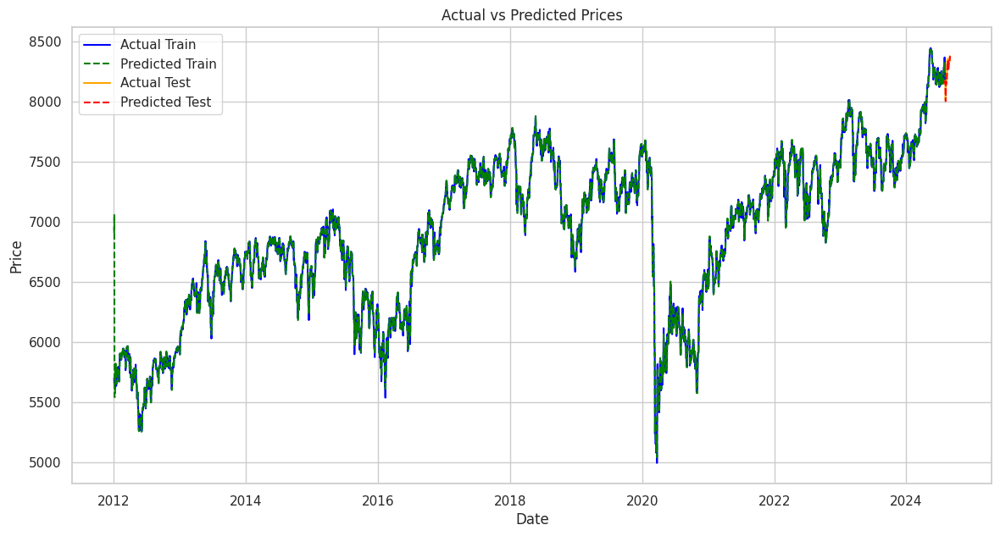

In [ ]:
# Now you can use the ensemble model to make predictions
y_pred_train = ensemble.predict(X_train)
y_pred_test = ensemble.predict(X_test)

# Plot the actual vs predicted prices for the training and test sets
plt.figure(figsize=(14, 7))

# # Plot training data
plt.plot(y_train.index, y_train, label='Actual Train', color='blue')
plt.plot(y_train.index, y_pred_train, label='Predicted Train', linestyle='--', color='green')

# Plot test data
plt.plot(y_test.index, y_test, label='Actual Test', color='orange')
plt.plot(y_test.index, y_pred_test, label='Predicted Test', linestyle='--', color='red')

plt.title('Actual vs Predicted Prices')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend(loc='best')
plt.show()

Voting Regressor R² Score: 0.9498315969304048
Voting Regressor MSE: 483.37237699900385


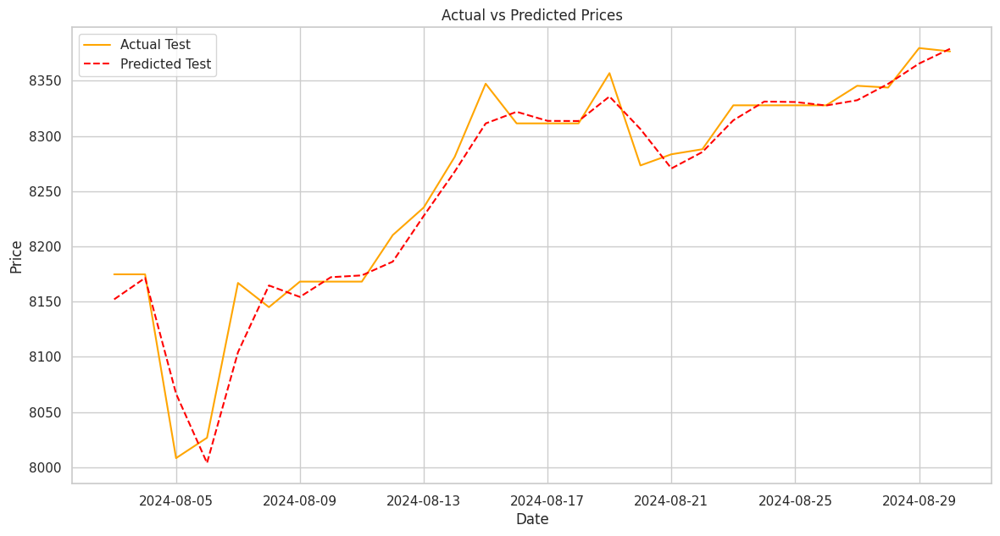

In [ ]:
# Calculate R² score for the ensemble predictions
ensemble_r2_score = r2_score(y_test, y_pred_test)
ensemble_mse = mean_squared_error(y_test, y_pred_test)

# Print the ensemble predicted scores
print(f"Voting Regressor R² Score: {ensemble_r2_score}")
print(f"Voting Regressor MSE: {ensemble_mse}")

# Plot the actual vs predicted prices for the training and test sets
plt.figure(figsize=(14, 7))


# Plot test data
plt.plot(y_test.index, y_test, label='Actual Test', color='orange')
plt.plot(y_test.index, y_pred_test, label='Predicted Test', linestyle='--', color='red')

plt.title('Actual vs Predicted Prices')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend(loc='best')
plt.show()

In [ ]:
# Print the top 3 models
print("Top 3 models based on R² score:")
for model_name, model_info in top_3_models:
    print(f"{model_name}: Best R² Score = {model_info['best_score']}, Best Params = {model_info['best_params']}")

Top 3 models based on R² score:
Lasso: Best R² Score = 0.9844279134616297, Best Params = {'model__alpha': 10.0}
ExponentialSmoothing: Best R² Score = -1.8628155272585794, Best Params = seasonal='add', seasonal_periods=12
Ridge: Best R² Score = -2.179194147572565, Best Params = {'model__alpha': 0.1}
